# Load packages and defaults

In [1]:
import os
from typing import Literal

# Move two levels up work from project level, not location of analysis file
os.chdir('../..')
print('Working dir:', os.getcwd())

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
import pandas as pd
import seaborn as sns

import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.anova import anova_lm

from scipy import stats
from scipy import optimize
from scipy.interpolate import interpn
from scipy import integrate

from Analyses.SDC_singlePulse_EET.tools import *
from Analyses.SDC_singlePulse_singleOpticField import loader
import Functions.globalFunctions.ExtracellularField as EcF
from Analyses.functionsAnalysis import *


%matplotlib inline
recollect = False


font = {'family': 'helvetica',
        'size': 10}
mpl.rc('font', **font)
colors_crest = np.array(sns.color_palette("crest", n_colors=10))
colors_crest = colors_crest[[0,2,5,8],:]
cmap_tab20 = np.array(mpl.cm.get_cmap('tab20').colors)

colors = np.array(sns.color_palette("crest", n_colors=10))
colors = colors[[0, 2, 5, 8], :]
crestcmap_pvalue = LinearSegmentedColormap.from_list('my_cmap', colors, N=colors.shape[0])
boundaries = [0.001, 0.01, 0.05, 1.0]
boundnorm_pvalue = mpl.cm.colors.BoundaryNorm(
    boundaries, len(boundaries), extend='min')

def myfun(x, y): return list(mpl.colors.to_rgb(x))+[y]

colorkeyval = {'soma': myfun('tab:red', 1), 'axon': myfun('tomato', 1), 'apic': myfun('seagreen', 1),
                'basaldend': myfun('teal', 1), 'alldend': myfun('tab:cyan',1), 'allsec': myfun('tab:blue', 1),
                'pyr_1': list(cmap_tab20[2,:])+[1],'pyr_2': list(cmap_tab20[3,:])+[1],
                'pyr_3': list(cmap_tab20[4,:])+[1],'pyr_4': list(cmap_tab20[5,:])+[1],
                'bc_1': list(cmap_tab20[8,:])+[1],'bc_2': list(cmap_tab20[9,:])+[1], 'unclassified': [0, 0, 0]}
stylekeyval = {'pyr_1': '-', 'pyr_2': '--', 'bc_1': ':', 'bc_2': '-.'}

EET_pallete = {'mua_eet':'tab:blue','redus_eet':'tab:orange','Gmax_eet':'tab:green','roll_eet':'tab:red','cell_eet':'tab:cyan','loc_eet':'tab:gray'}
EET_pallete_paper = {'mua_eet':'#17a2b8ff','redus_eet':'#11694fff','Gmax_eet':'#38ad4bff','roll_eet':'#92235aff','cell_eet':'#5d37a2ff','loc_eet':'tab:gray'}

Working dir: d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code


# Loading data

In [2]:
# Load data
filepath = './Results/SDC/SDC_EETUgent470grayinvivo_singlePulse'
filename = 'all_data_filled_v2.csv'
drop_columns = ['opsinmech', 'distribution',
                'distribution_method', 'seed', 'celsius', 'dt']


# opsinlocations to single word
opsinLocation_map = loader.opsinLocation_map
master_df = pd.read_csv(os.path.join(filepath, filename), index_col=0)
master_df['amp'] = master_df['amp']/1000  # convert W/m2 -> mW/mm2
for x in ['x', 'y', 'z']:
    for suffix in ['', '_0']:
        master_df[x+suffix] = master_df[x+suffix]/1000  # convert um -> mm
master_df['TAC'] = -master_df['ichr2']/master_df['dur'] * \
    1e-5  # convert to uA (ichr2: mA/cm2*um2)
master_df['Gmax'] = np.round(master_df['Gmax'], 4)
master_df['theta_0'] = np.round(master_df['theta_0'], 2)
for x in ['amp', 'Gmax', 'TAC', 'dur']:
    master_df[x+'_log10'] = np.round(np.log10(master_df[x]), 4)

master_df = master_df.drop(drop_columns, axis=1)
master_df['neurontemplate'] = master_df['neurontemplate'].replace(
    {'CA1_PC_cAC_sig5': 'pyr_1', 'CA1_PC_cAC_sig6': 'pyr_2', 'cNACnoljp1': 'bc_1', 'cNACnoljp2': 'bc_2'})
master_df[['celltype', 'cell_number']
          ] = master_df['neurontemplate'].str.split('_', expand=True)
master_df['cluster_eet'] = master_df['EETsimidx']//7
master_df['idx_incluster_eet'] = master_df['EETsimidx'] % 7
all_columns = master_df.columns


all_settings_columns = ['dur', 'Gmax', 'EETsimidx',
                        'neurontemplate', 'theta_0', 'cluster_eet', 'idx_incluster_eet']

# change perspective from optrode centered to stratum pyramidale centred
for theta in master_df['theta_0'].unique():
    if theta < 0:
        label = 'z'
        master_df.loc[master_df['theta_0'] == theta, label] *= -1
        master_df.loc[master_df['theta_0'] == theta, label+'_0'] *= -1
    elif theta == 0:
        label = 'x'
        master_df.loc[master_df['theta_0'] == theta, label] *= -1
        master_df.loc[master_df['theta_0'] == theta, label+'_0'] *= -1
        toz = master_df.loc[master_df['theta_0'] == theta, 'x'].to_numpy()
        tox = master_df.loc[master_df['theta_0'] == theta, 'z'].to_numpy()
        toz_0 = master_df.loc[master_df['theta_0'] == theta, 'x_0'].to_numpy()
        tox_0 = master_df.loc[master_df['theta_0'] == theta, 'z_0'].to_numpy()
        master_df.loc[master_df['theta_0'] == theta, 'x'] = tox
        master_df.loc[master_df['theta_0'] == theta, 'z'] = toz
        master_df.loc[master_df['theta_0'] == theta, 'x_0'] = tox_0
        master_df.loc[master_df['theta_0'] == theta, 'z_0'] = toz_0

    master_df.loc[master_df['theta_0'] == theta, 'z'] = np.round(
        master_df.loc[master_df['theta_0'] == theta, 'z']+master_df.loc[master_df['theta_0'] == theta, 'z_0'], 3)
    master_df.loc[master_df['theta_0'] == theta, 'x'] = np.round(
        master_df.loc[master_df['theta_0'] == theta, 'x']+master_df.loc[master_df['theta_0'] == theta, 'x_0'], 3)


unique_values_columns_master = {
    key: master_df[key].unique() for key in all_columns}
for x in ['amp', 'Gmax', 'TAC', 'dur']:
    unique_values_columns_master[x] = np.sort(unique_values_columns_master[x])
    unique_values_columns_master[x+'_log10'] = np.sort(
        unique_values_columns_master[x+'_log10'])
for x in ['x', 'z', 'x_0', 'z_0']:
    unique_values_columns_master[x] = np.sort(unique_values_columns_master[x])
print('all coluumn names:\n\t', all_columns.to_numpy())
print('all settings:\n\t', all_settings_columns)
print('Total number of entries:\n\t', len(master_df))
for k in all_settings_columns+[x for x in all_columns if '_eet' in x]+['opsinlocations']:
    print(f'unique entries {k}:\n\t', len(
        unique_values_columns_master[k]), ': ', unique_values_columns_master[k])
master_df.describe()

all coluumn names:
	 ['amp' 'sR' 'ichr2' 'gchr2' 'dur' 'field' 'nPulse' 'Gmax' 'opsinlocations'
 'x' 'y' 'z' 'phi' 'theta' 'psi' 'phi_0' 'theta_0' 'psi_0'
 'neurontemplate' 'x_0' 'y_0' 'z_0' 'EETsimidx' 'neurontemplate2'
 'celltype' 'number' 'mua_eet' 'mus_eet' 'g_eet' 'Gmax_eet' 'cell_eet'
 'loc_eet' 'roll_eet' 'TAC' 'amp_log10' 'Gmax_log10' 'TAC_log10'
 'dur_log10' 'cell_number' 'cluster_eet' 'idx_incluster_eet']
all settings:
	 ['dur', 'Gmax', 'EETsimidx', 'neurontemplate', 'theta_0', 'cluster_eet', 'idx_incluster_eet']
Total number of entries:
	 406560
unique entries dur:
	 5 :  [  1.           3.16227766  10.          31.6227766  100.        ]
unique entries Gmax:
	 21 :  [0.7699 0.8274 0.8669 0.8835 0.8988 0.9131 0.9267 0.9522 0.9764 0.9882
 1.     1.0236 1.0356 1.0478 1.0733 1.0869 1.1012 1.1331 1.1726 1.2301
 1.2794]
unique entries EETsimidx:
	 112 :  [  0   1  10 100 101 102 103 104 105 106 107 108 109  11 110 111  12  13
  14  15  16  17  18  19   2  20  21  22  23  24  25  2

,amp,sR,ichr2,gchr2,dur,nPulse,Gmax,x,y,z,...,cell_eet,loc_eet,roll_eet,TAC,amp_log10,Gmax_log10,TAC_log10,dur_log10,cluster_eet,idx_incluster_eet
count,321157.000000,321157.0,406560.000000,406560.000000,406560.000000,406560.0,406560.000000,406560.000000,406560.0,406560.000000,...,406560.000000,406560.000000,406560.000000,4.065600e+05,321157.000000,406560.000000,406560.000000,406560.000000,406560.000000,406560.000000
mean,894.062854,1.0,-1895.872525,0.720530,29.157011,1.0,0.996246,1.333333,0.0,0.150000,...,0.500000,1.236607,3.245027,3.512598e-03,2.234833,-0.005100,-3.137273,1.000000,7.500000,3.000000
std,1636.954307,0.0,2117.811735,48.130146,37.041492,0.0,0.125313,1.124230,0.0,0.347851,...,0.500001,0.969306,1.754237,7.227535e-03,0.987760,0.054941,0.946537,0.707108,4.609778,2.000002
min,0.026295,1.0,-21654.950300,-22159.528300,1.000000,1.0,0.769900,-1.000000,0.0,-0.400000,...,0.000000,0.000000,0.196350,3.976700e-07,-1.580100,-0.113600,-6.400500,0.000000,0.000000,0.000000
25%,46.018127,1.0,-2382.160200,0.027300,3.162278,1.0,0.909525,0.500000,0.0,-0.180000,...,0.000000,0.000000,1.570796,3.333512e-04,1.662900,-0.041200,-3.477100,0.500000,3.750000,1.000000
50%,219.597168,1.0,-1218.301900,0.148800,10.000000,1.0,0.994100,1.250000,0.0,0.150000,...,0.500000,1.000000,3.337942,8.216448e-04,2.341600,-0.002600,-3.085300,1.000000,7.500000,3.000000
75%,889.719238,1.0,-599.638950,0.764800,31.622777,1.0,1.076700,2.000000,0.0,0.480000,...,1.000000,2.000000,4.810564,3.464191e-03,2.949300,0.032075,-2.460400,1.500000,11.250000,5.000000
max,12109.375000,1.0,-0.055660,6255.707300,100.000000,1.0,1.279400,4.000000,0.0,0.700000,...,1.000000,3.000000,5.890486,8.759367e-02,4.083100,0.107000,-1.057500,2.000000,15.000000,6.000000


# Raw Data visualization

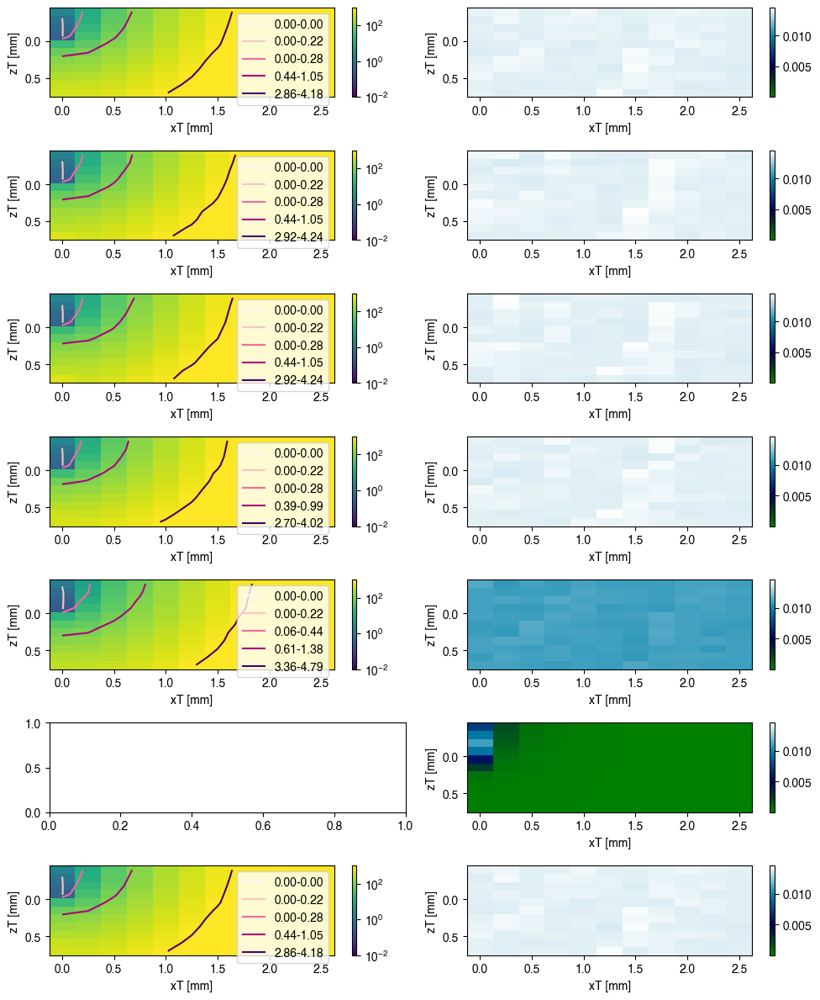

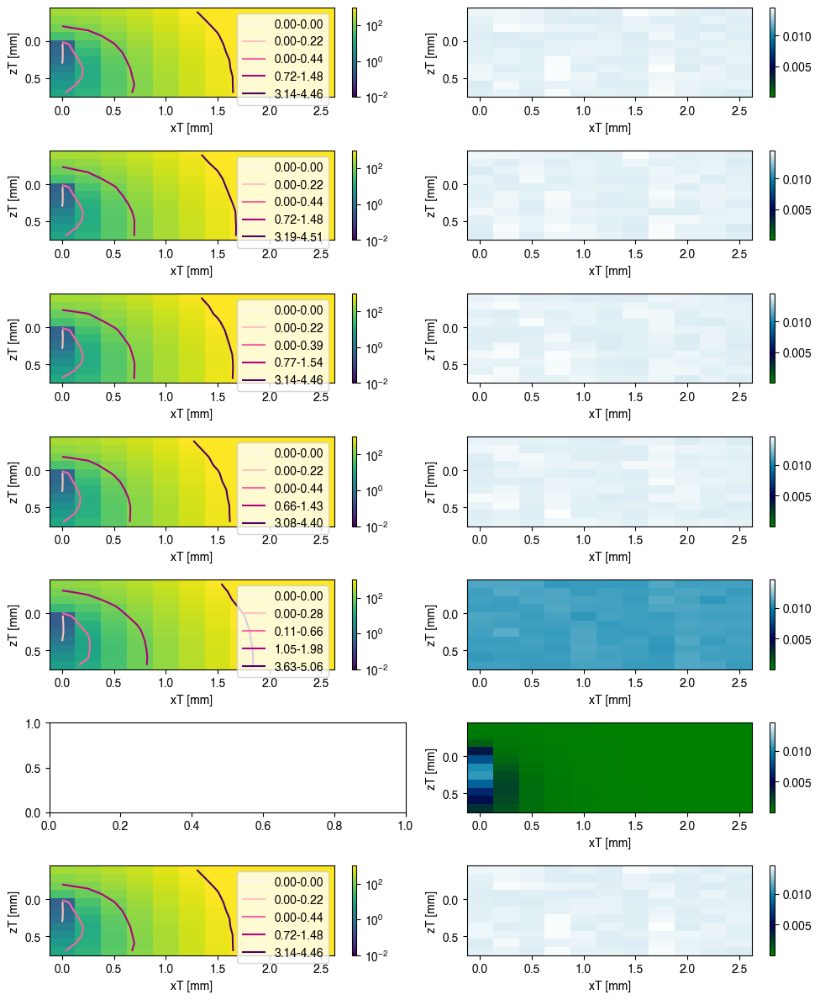

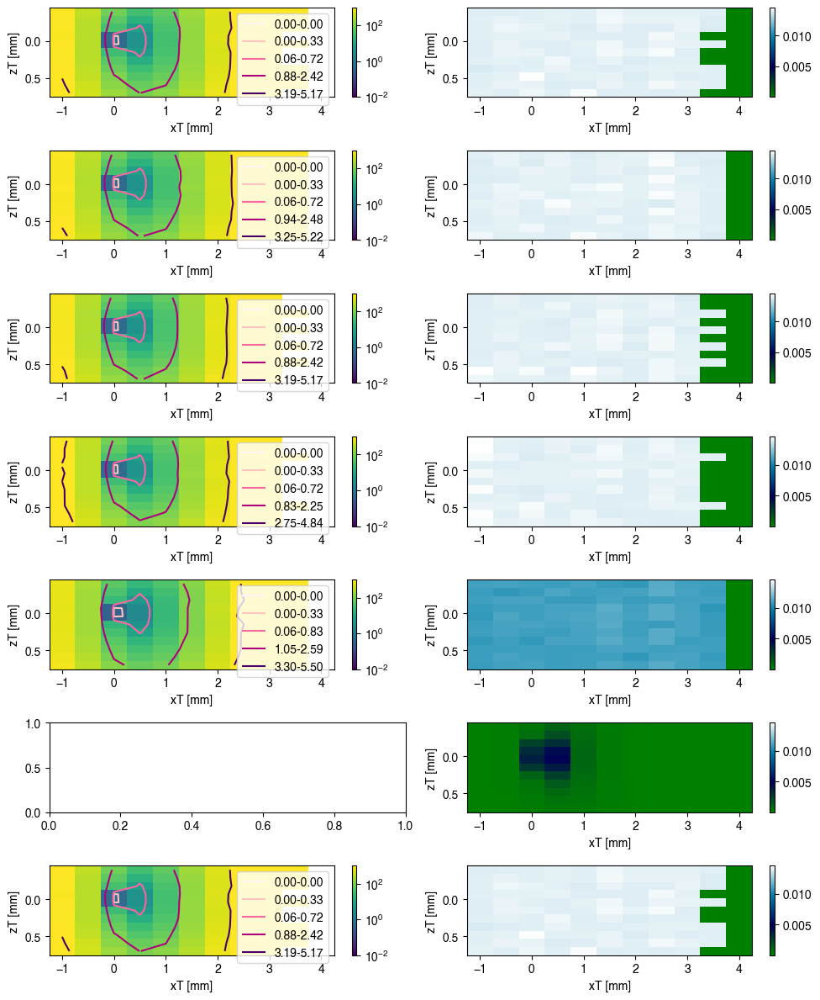

In [3]:
# results in trajectories
myselection = {'celltype': 'bc', 'cluster_eet': 0, 'dur': 1}
intm_df = master_df[selection_generator(
    master_df, unique_values_columns_master, verbose=False, **myselection)]
print_upscale = False
nan_tolerance_percentage = 0.95
for theta in unique_values_columns_master['theta_0']:
    uiice = intm_df['idx_incluster_eet'].unique()
    fig, axs = plt.subplots(
        len(uiice), 2, tight_layout=True, figsize=np.array([10, 12]))
    for i, feat in enumerate(['amp', 'TAC']):
        if feat == 'amp':
            levels = np.logspace(-1, 3, 5)
            norm_log = mpl.cm.colors.LogNorm(vmax=1000, vmin=0.01)
            norm_log_cntr = mpl.cm.colors.LogNorm(
                vmax=levels[-1], vmin=levels[0])
            plot_cntr = True
        else:
            plot_cntr = False
        for iice, ax in zip(uiice, axs[:, i]):
            single_config_df = intm_df[selection_generator(intm_df, unique_values_columns_master, verbose=False, **{
                                                           **myselection, 'theta_0': theta, 'idx_incluster_eet': iice})].reset_index(drop=True)
            if not np.all(np.isnan(single_config_df[feat])):
                data_toplot = np.array(
                    (single_config_df['x'], single_config_df['z'], single_config_df[feat])).T
                # if ninterp, data_toplot[-1] is in 'ij' order
                data_toplot = EcF.prepareDataforInterp(
                    data_toplot, 'ninterp', sorted=False)
                yY, zZ = np.meshgrid(np.linspace(data_toplot[0].min(), data_toplot[0].max(), len(np.unique(data_toplot[0])), endpoint=True), np.linspace(
                    data_toplot[1].min(), data_toplot[1].max(), len(np.unique(data_toplot[0])), endpoint=True), indexing='ij')

                if sum(np.isnan(data_toplot[-1].flatten()))/len(data_toplot[-1].flatten()) < nan_tolerance_percentage:
                    if plot_cntr:
                        im, cntr, cb = EcF.slicePlot(data_toplot, ax, fig, plotGrid=(yY, zZ), structured=True, norm=norm_log, invert_yaxis=True, contour_kwargs={
                                                     'norm': norm_log_cntr, 'cmap': 'RdPu', 'levels': levels})
                        h, l = cntr.legend_elements("I")
                        if theta != 0:
                            surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(
                                yY, zZ, data_toplot[2], intensity=levels, radial_data=True, gridorder='ij')
                        else:
                            surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(
                                yY, zZ, data_toplot[2], intensity=levels, radial_data=False, gridorder='ij')
                        ax.legend(h, [f'{x:0.2f}-{y:0.2f}' if ~np.isnan(x) else '-' for x,
                                  y in zip(surf_low, surf_up)], ncol=1, loc='upper right')
                    else:
                        TAC_min = np.nanmin(intm_df[feat])
                        TAC_max = np.nanmax(intm_df[feat])
                        norm_log = mpl.cm.colors.Normalize(
                            vmax=TAC_max, vmin=TAC_min)
                        im, cb = EcF.slicePlot(data_toplot, ax, fig, plotGrid=(
                            yY, zZ), structured=True, norm=norm_log, invert_yaxis=True, cmap='ocean')
                    ax.set_xlabel('xT [mm]')
                    ax.set_ylabel('zT [mm]')

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


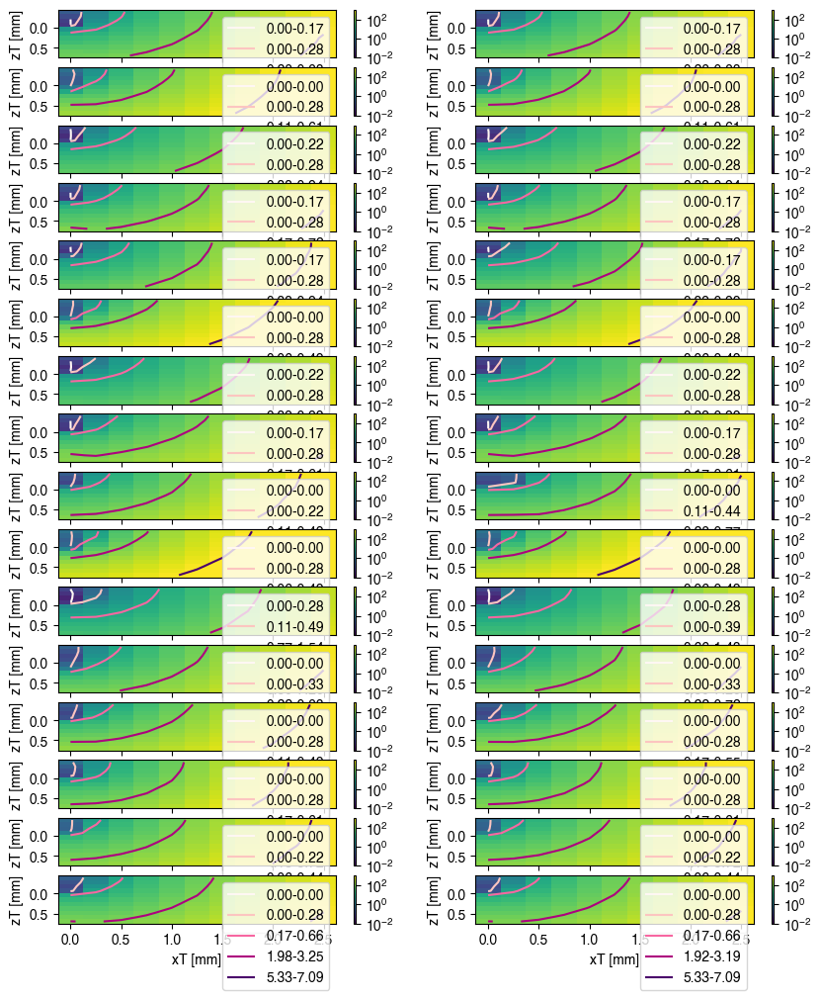

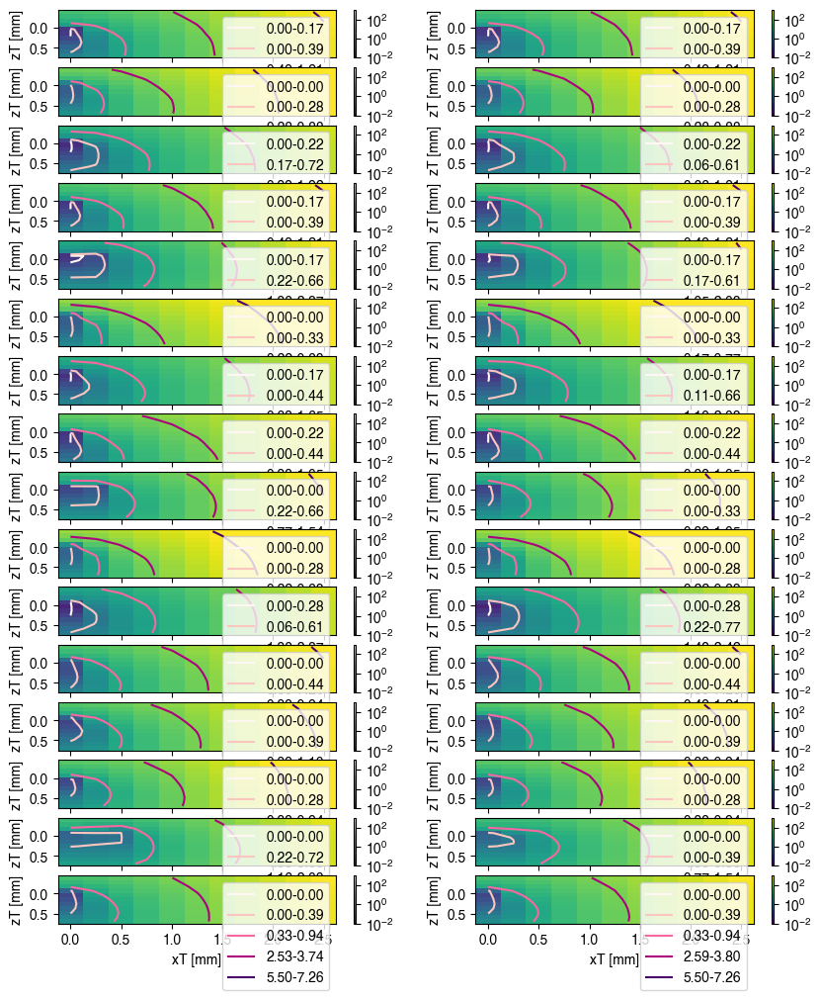

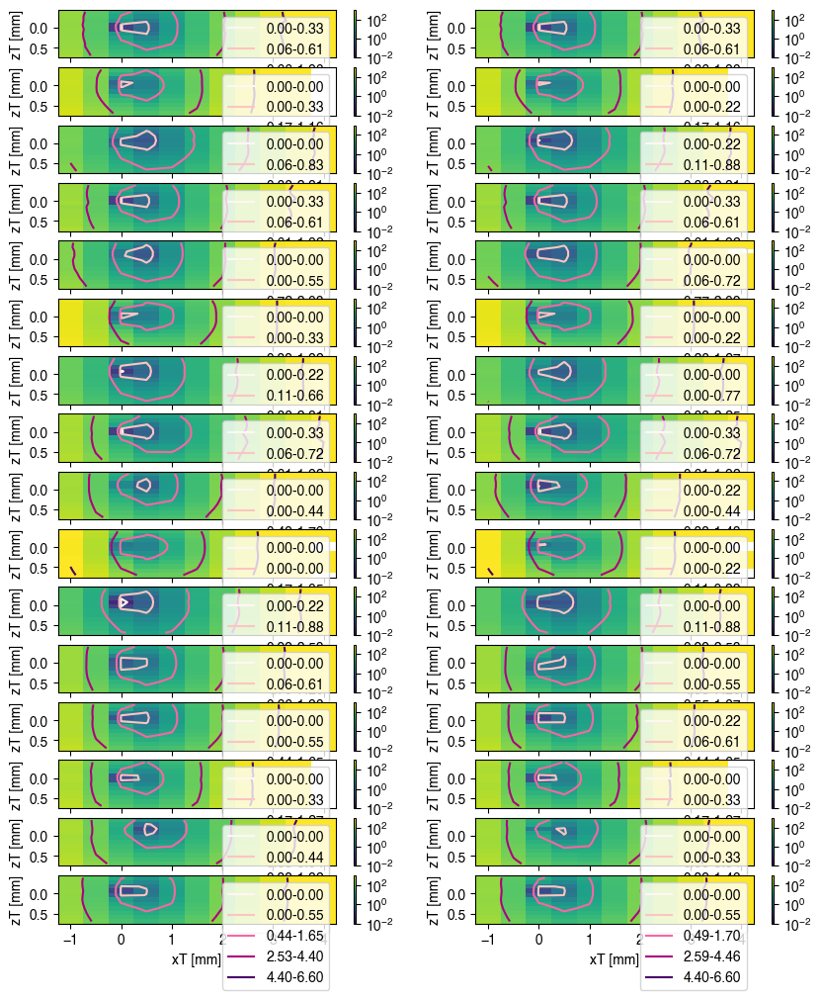

In [4]:
myselection = {'celltype': 'pyr'}
intm_df = master_df[selection_generator(
    master_df, unique_values_columns_master, verbose=False, **myselection)]
print_upscale = False
nan_tolerance_percentage = 0.95
feat = 'amp'
for theta in unique_values_columns_master['theta_0']:
    ucle = np.unique(intm_df['cluster_eet'])
    fig, axs = plt.subplots(
        len(ucle), 2, tight_layout=True, figsize=np.array([10, 12]))
    for i, iice in enumerate([0, 6]):
        if feat == 'amp':
            levels = np.logspace(-1, 3, 5)
            norm_log = mpl.cm.colors.LogNorm(vmax=1000, vmin=0.01)
            norm_log_cntr = mpl.cm.colors.LogNorm(
                vmax=levels[-1], vmin=levels[0])
            plot_cntr = True
        else:
            plot_cntr = False
        for icle, ax in zip(ucle, axs[:, i]):
            single_config_df = intm_df[selection_generator(intm_df, unique_values_columns_master, verbose=False, **{
                                                           **myselection, 'dur': 10, 'theta_0': theta, 'idx_incluster_eet': iice, 'cluster_eet': icle})].reset_index(drop=True)
            if not np.all(np.isnan(single_config_df[feat])):
                data_toplot = np.array(
                    (single_config_df['x'], single_config_df['z'], single_config_df[feat])).T
                # if ninterp, data_toplot[-1] is in 'ij' order
                data_toplot = EcF.prepareDataforInterp(
                    data_toplot, 'ninterp', sorted=False)
                yY, zZ = np.meshgrid(np.linspace(data_toplot[0].min(), data_toplot[0].max(), len(np.unique(data_toplot[0])), endpoint=True), np.linspace(
                    data_toplot[1].min(), data_toplot[1].max(), len(np.unique(data_toplot[0])), endpoint=True), indexing='ij')

                if sum(np.isnan(data_toplot[-1].flatten()))/len(data_toplot[-1].flatten()) < nan_tolerance_percentage:
                    if plot_cntr:
                        im, cntr, cb = EcF.slicePlot(data_toplot, ax, fig, plotGrid=(yY, zZ), structured=True, norm=norm_log, invert_yaxis=True, contour_kwargs={
                                                     'norm': norm_log_cntr, 'cmap': 'RdPu', 'levels': levels})
                        h, l = cntr.legend_elements("I")
                        if theta != 0:
                            surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(
                                yY, zZ, data_toplot[2], intensity=levels, radial_data=True, gridorder='ij')
                        else:
                            surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(
                                yY, zZ, data_toplot[2], intensity=levels, radial_data=False, gridorder='ij')
                        ax.legend(h, [f'{x:0.2f}-{y:0.2f}' if ~np.isnan(x) else '-' for x,
                                  y in zip(surf_low, surf_up)], ncol=1, loc='upper right')
                    else:
                        TAC_min = np.nanmin(intm_df[feat])
                        TAC_max = np.nanmax(intm_df[feat])
                        norm_log = mpl.cm.colors.Normalize(
                            vmax=TAC_max, vmin=TAC_min)
                        im, cb = EcF.slicePlot(data_toplot, ax, fig, plotGrid=(
                            yY, zZ), structured=True, norm=norm_log, invert_yaxis=True, cmap='ocean')
                    ax.set_xlabel('xT [mm]')
                    ax.set_ylabel('zT [mm]')

# VTA/STA

In [5]:
vta_filename = 'vta_logspace(-1,3,9)_v2.csv'
vta_df = loader.load_vta_df(filepath, vta_filename, recollect=False)
vta_df.head()
for x in ['Gmax', 'dur', 'level', 'theta_0', 'psi_0']:
    vta_df[x] = np.round(vta_df[x], 3)

print('!!!!! Remove nans surf_avg to 0!!!!!')
vta_df.loc[np.isnan(vta_df['surf_avg']), 'surf_avg'] = 0
for x in ['vta_low', 'vta_up', 'surf_low', 'surf_up', 'dur', 'Gmax', 'level', 'surf_avg']:
    vta_df[x+'_log10'] = np.round(np.log10(vta_df[x]), 4)
vta_df['neurontemplate'].unique()

try:
    vta_df['neurontemplate'] = vta_df['neurontemplate'].replace(
        {'CA1_PC_cAC_sig5': 'pyr_1', 'CA1_PC_cAC_sig6': 'pyr_2', 'cNACnoljp1': 'bc_1', 'cNACnoljp2': 'bc_2'})
except Exception as e:
    print(e)
    pass
vta_df[['celltype', 'number']] = vta_df['neurontemplate'].str.split(
    '_', expand=True)
vta_df['ct_theta'] = vta_df.apply(
    lambda row: f"{row['celltype']}_{row['theta_0']}", axis=1)
vta_df['redus_eet'] = vta_df['mus_eet']*(1-vta_df['g_eet'])
vta_df['cluster_eet'] = vta_df['EETsimidx']//7
vta_df['idx_incluster_eet'] = vta_df['EETsimidx'] % 7
vta_df['roll_eet'] = vta_df['roll_eet']-np.pi
vta_columns = vta_df.columns


vta_limit_df = vta_df.copy()
for x, maxsurf in zip(['surf_low', 'surf_up', 'surf_avg'], [5*1.1, 2*2.75*1.32]):
    vta_limit_df[x] = np.minimum(vta_limit_df[x], np.round(maxsurf, 4))
    vta_limit_df[x+'_log10'] = np.minimum(
        vta_limit_df[x+'_log10'], np.round(np.log10(maxsurf), 4))

unique_values_columns_vta = {key: vta_df[key].unique() for key in vta_columns}
for x in ['vta_low', 'vta_up', 'surf_low', 'surf_up', 'surf_avg', 'dur', 'Gmax', 'level']:
    unique_values_columns_vta[x] = np.sort(unique_values_columns_vta[x])
    unique_values_columns_vta[x +
                              '_log10'] = np.sort(unique_values_columns_vta[x+'_log10'])

len(vta_df)

!!!!! Remove nans surf_avg to 0!!!!!


c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, 

30240

# SoFPAN data Visualization
surfaces of activation for 100 mW/mm2 LightSource output

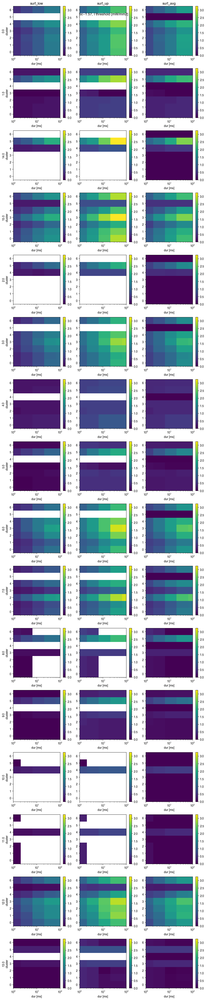

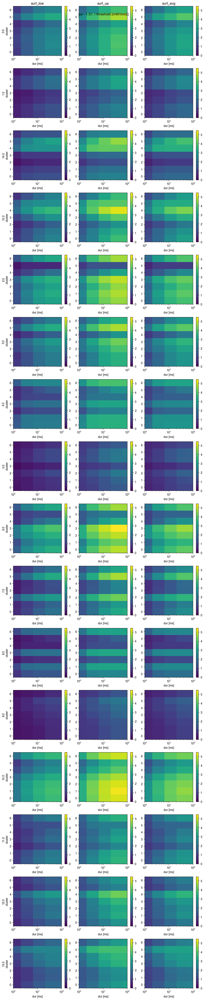

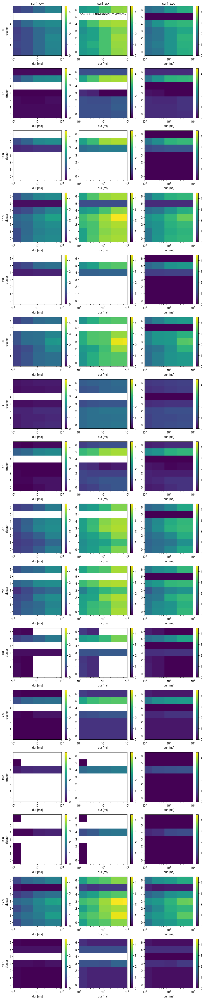

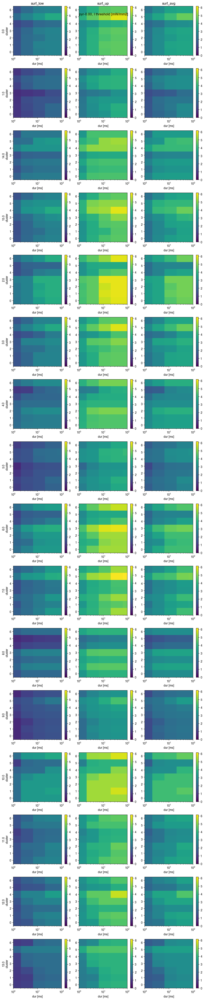

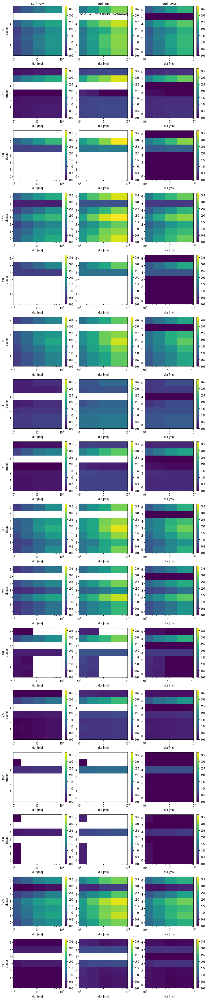

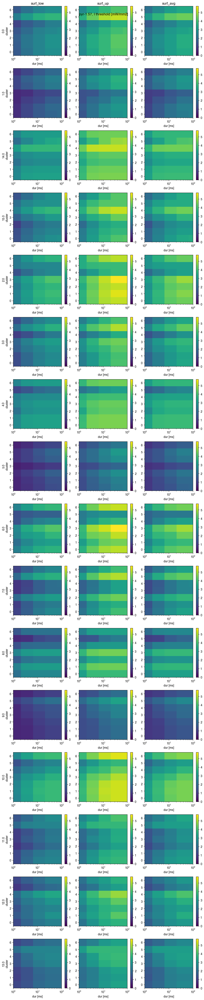

In [6]:
level = 100  # mW/mm2
for pitch in unique_values_columns_vta['theta_0']:
    for cellt in unique_values_columns_vta['celltype']:
        fig_df = vta_df[selection_generator(
            vta_df, unique_values_columns=unique_values_columns_vta, celltype=cellt, level=level, theta_0=pitch)]
        uAxesVals = fig_df['cluster_eet'].unique()
        fig, axs = plt.subplots(16, 3, tight_layout=True,
                                figsize=(10, 3*len(uAxesVals)))
        for i, datalabel in enumerate(['surf_low', 'surf_up', 'surf_avg']):
            if not all(np.isnan(fig_df[datalabel])):
                Imin = 0  # np.nanmin(fig_df[datalabel])
                if 'surf' in datalabel:
                    Imax = np.nanmax(fig_df[['surf_up', 'surf_low']].values)
                    norm = mpl.cm.colors.Normalize(vmax=Imax, vmin=Imin)
                else:
                    Imax = np.nanmax(fig_df[datalabel])
                    norm = mpl.cm.colors.PowerNorm(
                        gamma=2, vmax=Imax, vmin=Imin)

                for oL, ax in zip(uAxesVals, axs[:, i]):
                    intm_df = fig_df[fig_df['cluster_eet'] == oL]
                    data_toplot = EcF.prepareDataforInterp(np.array(
                        (intm_df['dur'], intm_df['idx_incluster_eet'], intm_df[datalabel])).T, 'ninterp', sorted=False)
                    yY, zZ = np.meshgrid(
                        data_toplot[0], data_toplot[1], indexing='ij')

                    im, cb = EcF.slicePlot(data_toplot, ax, fig, plotGrid=(
                        yY, zZ), structured=True, norm=norm)
                    ax.set_xscale('log')
                    ax.set_xlim(
                        (min(intm_df['dur'].unique()), max(intm_df['dur'].unique())))
                    ax.set_xlabel('dur [ms]')
                    if i == 0:
                        ax.set_ylabel(f'{oL}\ncluster')
                    if oL == uAxesVals[0]:
                        ax.set_title(datalabel)
        fig.suptitle(f'{cellt}-{pitch:0.2f}, I threshold [mW/mm2]')
        print()

## surf _avg plot surface for r trajectories and all steps

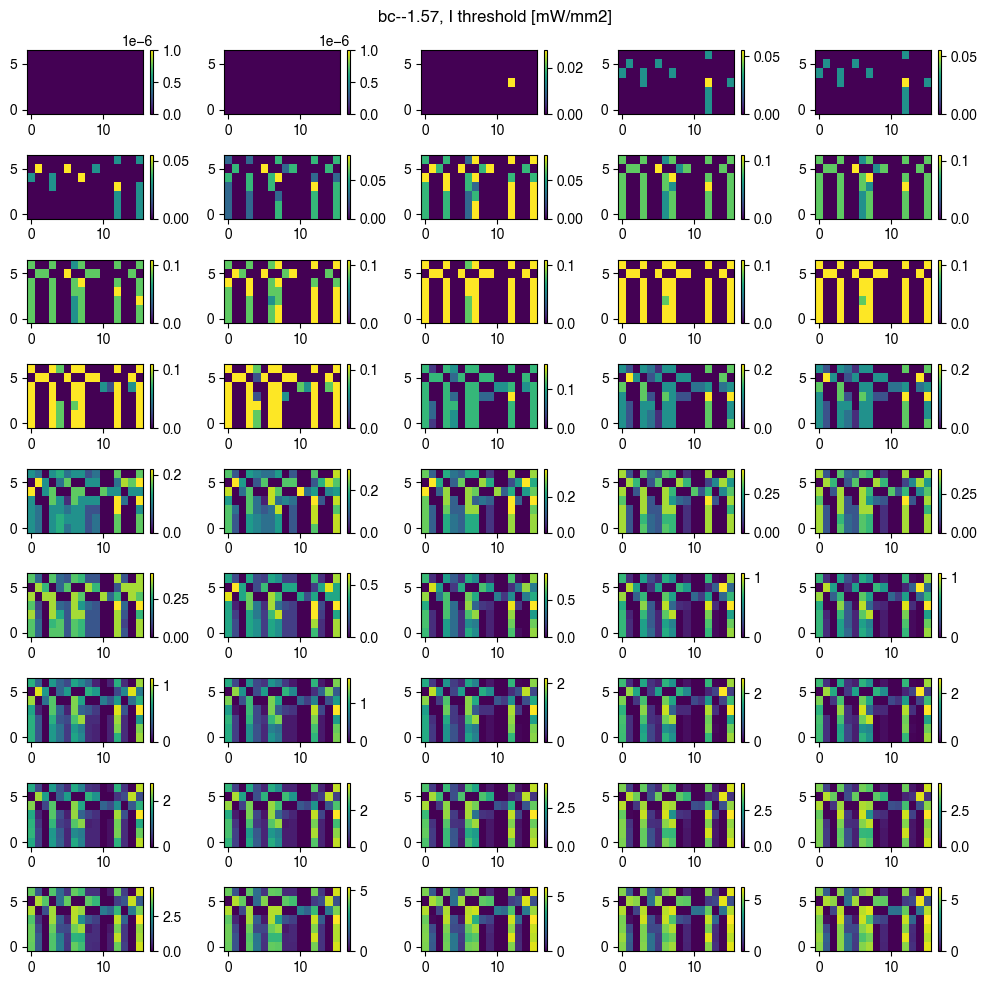

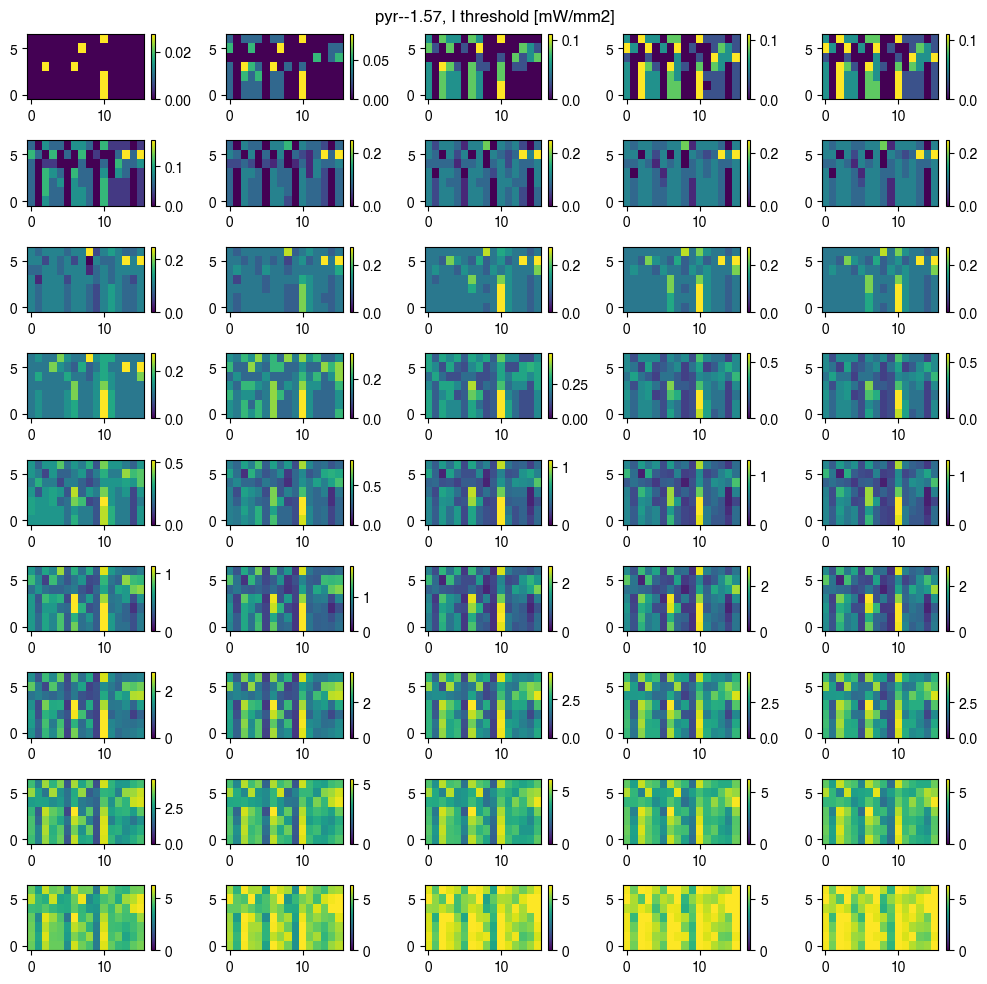

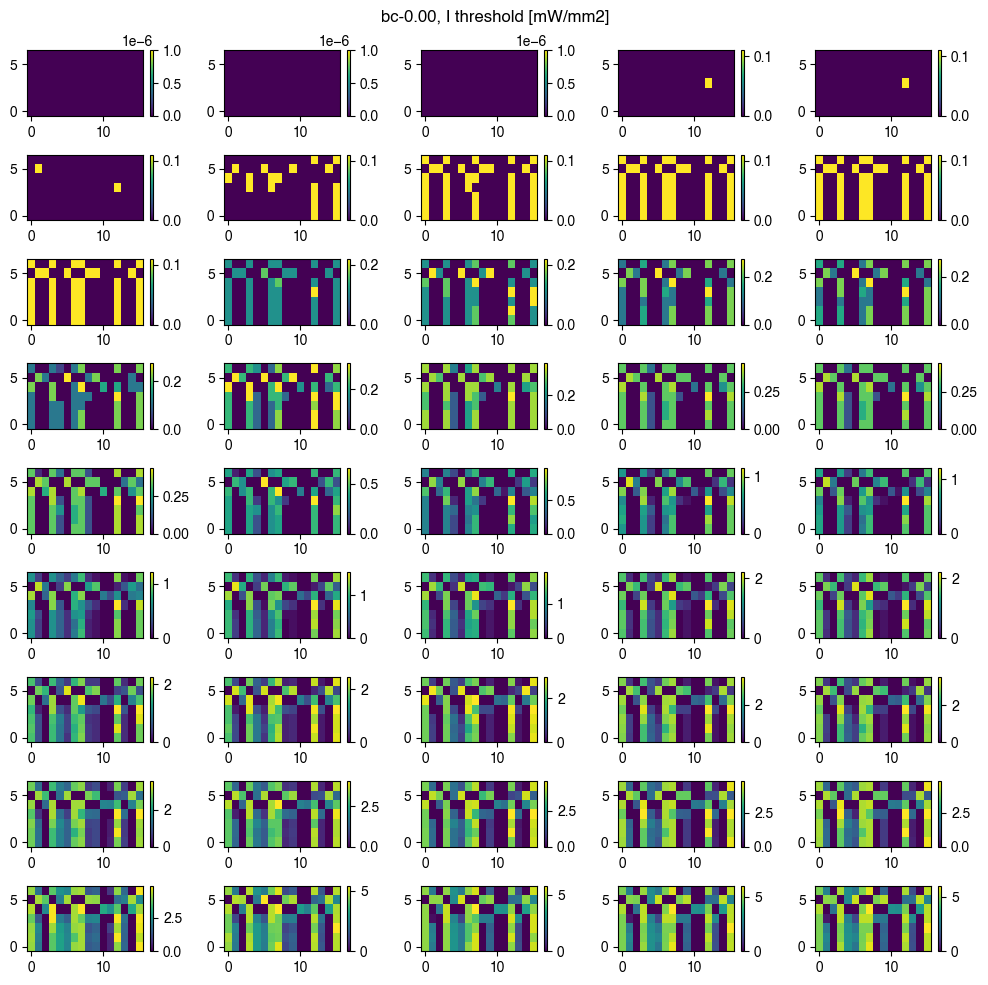

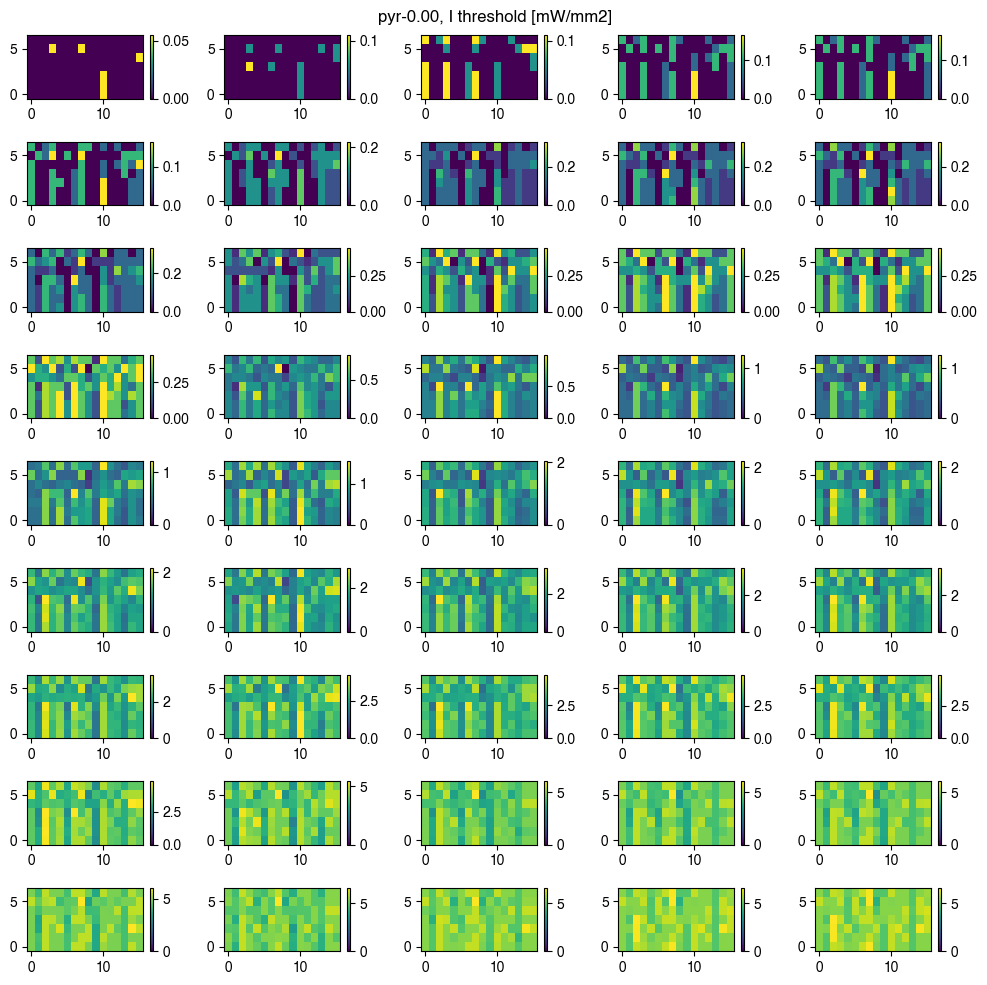

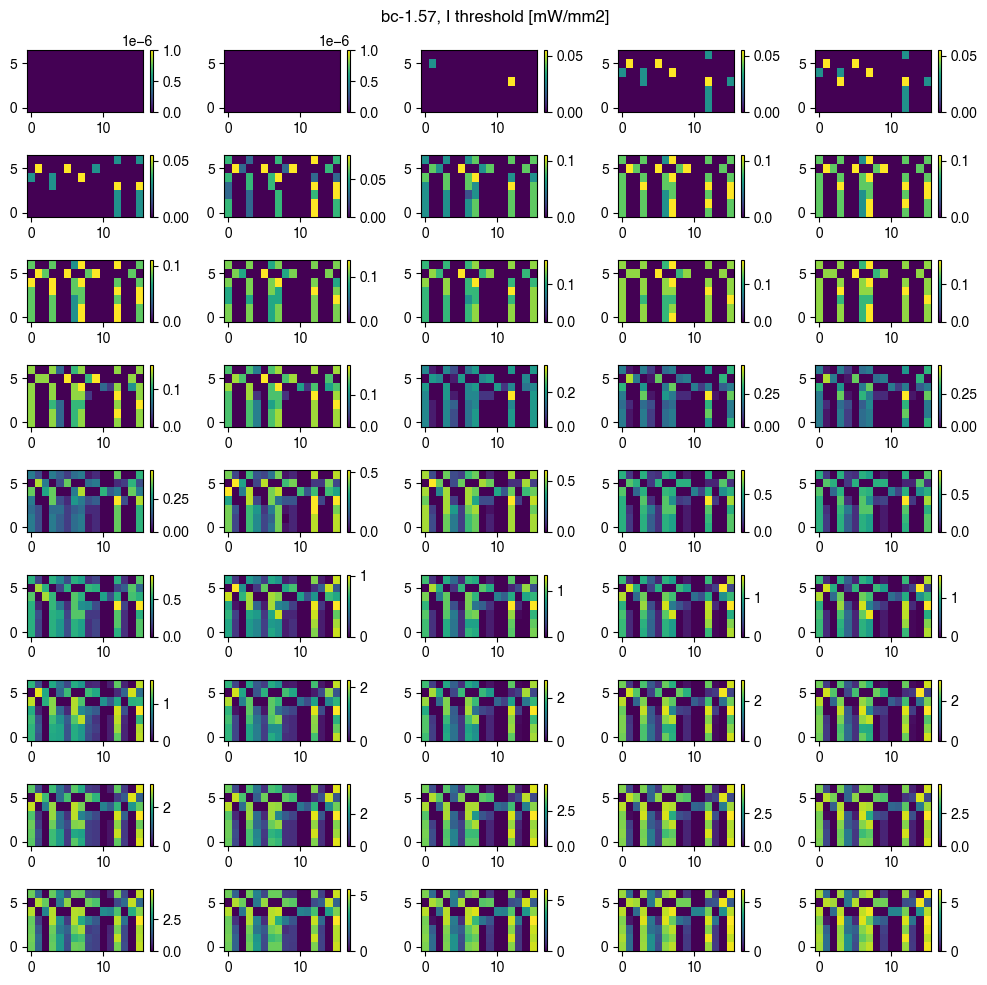

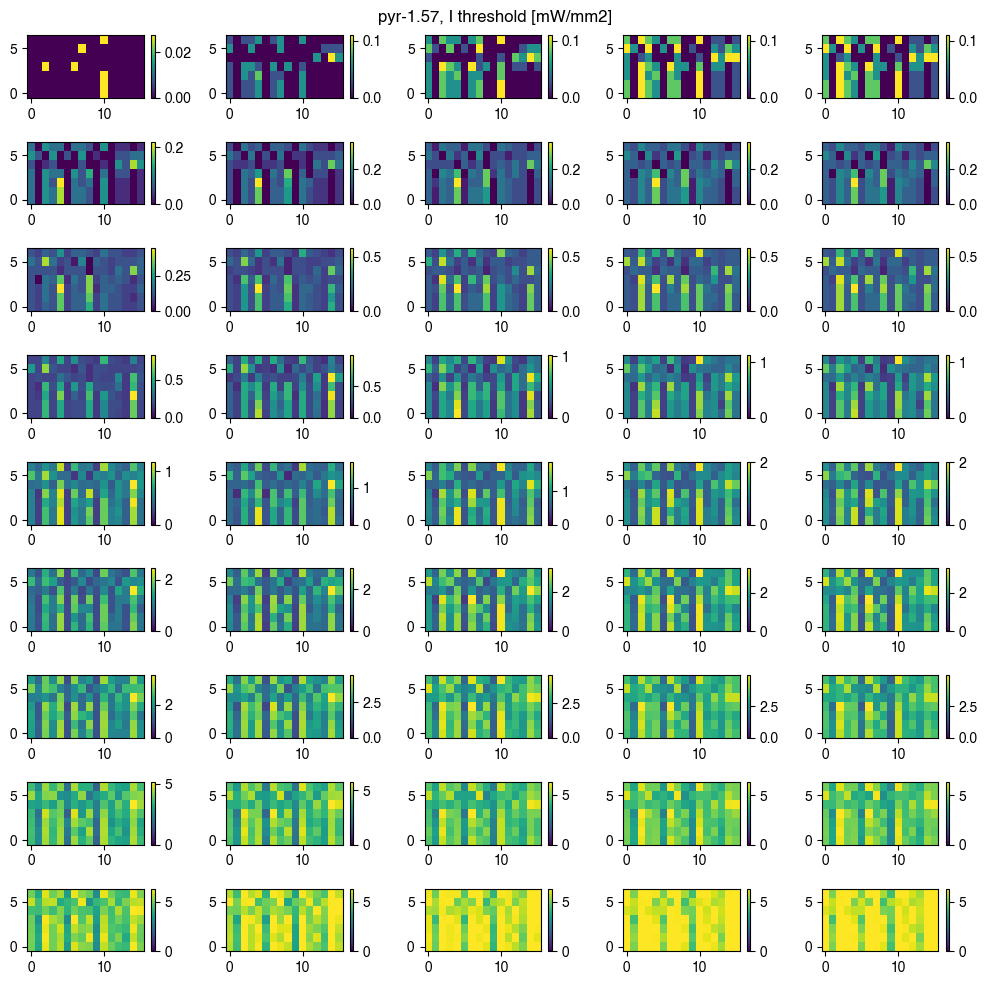

In [7]:
datalabel = 'surf_avg'
for pitch in unique_values_columns_vta['theta_0']:
    for cellt in unique_values_columns_vta['celltype']:
        fig_df = vta_df[selection_generator(
            vta_df, unique_values_columns=unique_values_columns_vta, celltype=cellt, theta_0=pitch)]
        urowAxesVals = fig_df['level'].unique()[:]
        ucolumnAxesVals = fig_df['dur'].unique()[:]
        fig, axs = plt.subplots(len(urowAxesVals), len(
            ucolumnAxesVals), tight_layout=True, figsize=(10, 10))
        for i, row in enumerate(urowAxesVals):
            for j, column in enumerate(ucolumnAxesVals):
                ax_df = fig_df[selection_generator(
                    fig_df, unique_values_columns=unique_values_columns_vta, level=row, dur=column)]
                if not all(np.isnan(ax_df[datalabel])):
                    Imin = 0  # np.nanmin(fig_df[datalabel])
                    if 'surf' in datalabel:
                        Imax = max(
                            (np.nanmax(ax_df[datalabel].values), Imin+1e-6))
                        norm = mpl.cm.colors.Normalize(vmax=Imax, vmin=Imin)

                    data_toplot = EcF.prepareDataforInterp(np.array(
                        (ax_df['cluster_eet'], ax_df['idx_incluster_eet'], ax_df[datalabel])).T, 'ninterp', sorted=False)
                    yY, zZ = np.meshgrid(
                        data_toplot[0], data_toplot[1], indexing='ij')

                    im, cb = EcF.slicePlot(data_toplot, axs[i, j], fig, plotGrid=(
                        yY, zZ), structured=True, norm=norm)
                    ax.set_xlabel('cluster_eet')
                    ax.set_ylabel('idx_incluster_eet')

        fig.suptitle(f'{cellt}-{pitch:0.2f}, I threshold [mW/mm2]')
        print()

## rel change in surf_avg

C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\768412402.py:21: RuntimeWarning: invalid value encountered in true_divide
  data_toplot[-1] = (data_toplot[-1] - data_toplot[-1][:, 0:1]) / \
C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\768412402.py:24: RuntimeWarning: All-NaN slice encountered
  Imin = (np.nanmin(data_toplot[-1].ravel()))
C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\768412402.py:26: RuntimeWarning: All-NaN slice encountered
  Imax = np.nanmax(data_toplot[-1].ravel())
C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\768412402.py:21: RuntimeWarning: divide by zero encountered in true_divide
  data_toplot[-1] = (data_toplot[-1] - data_toplot[-1][:, 0:1]) / \


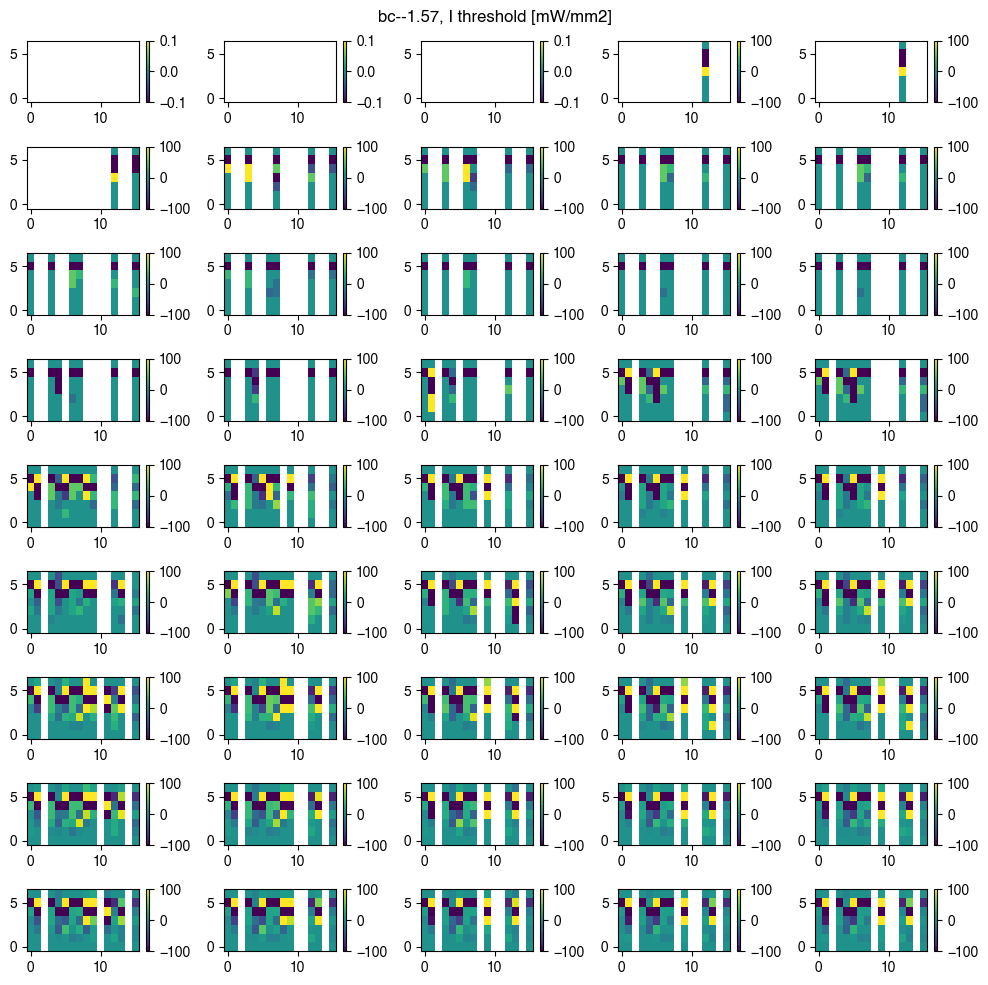

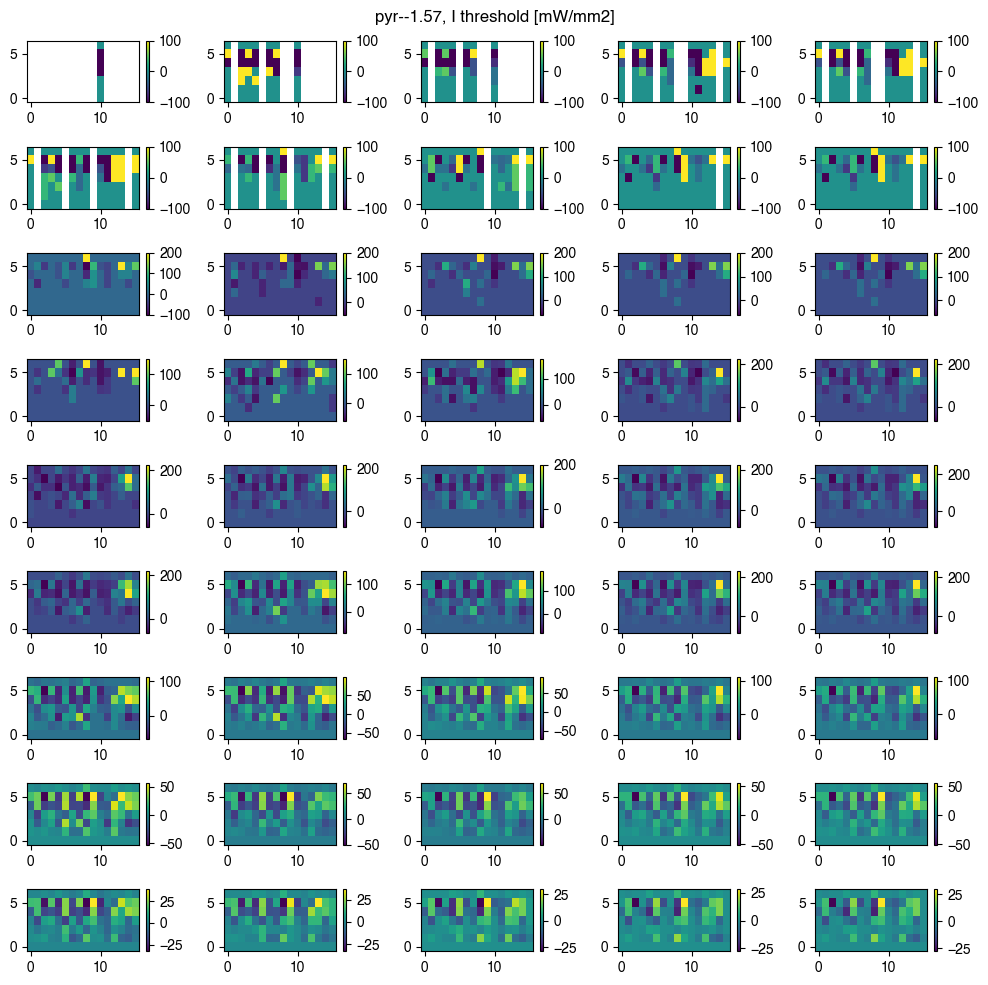

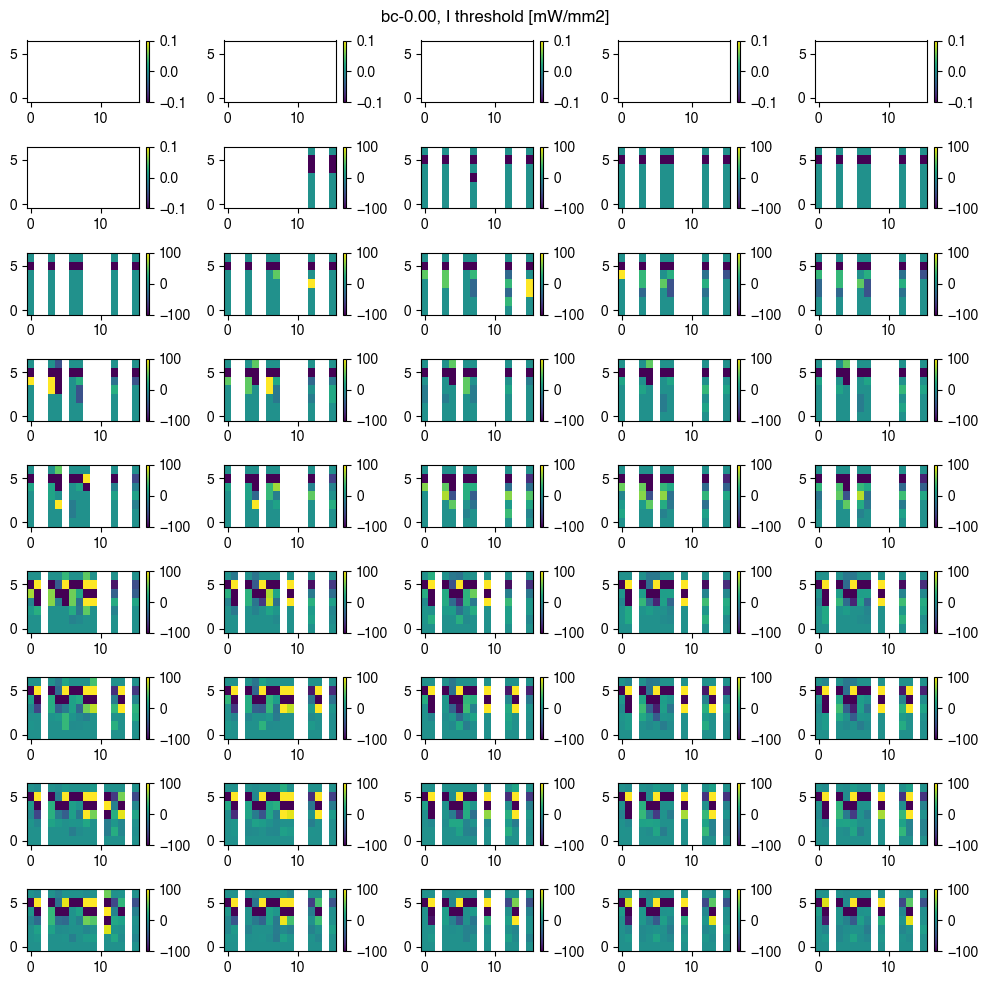

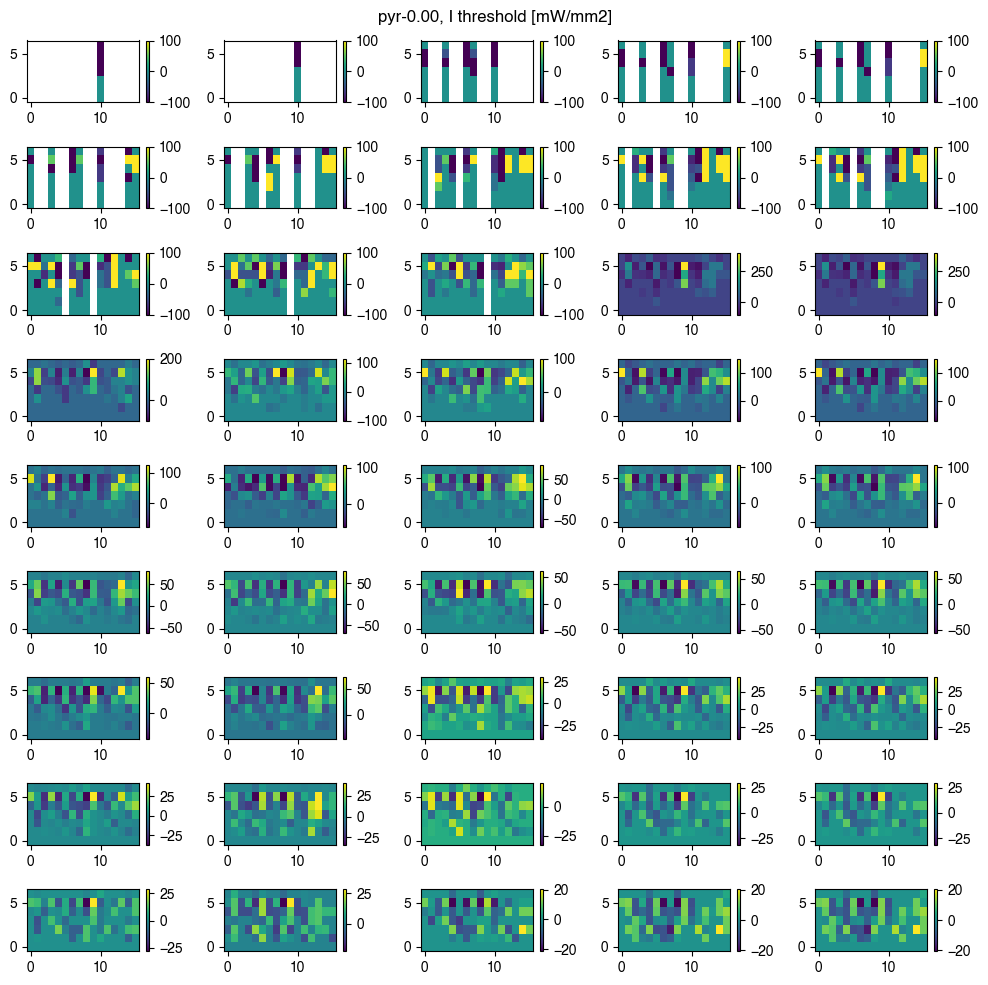

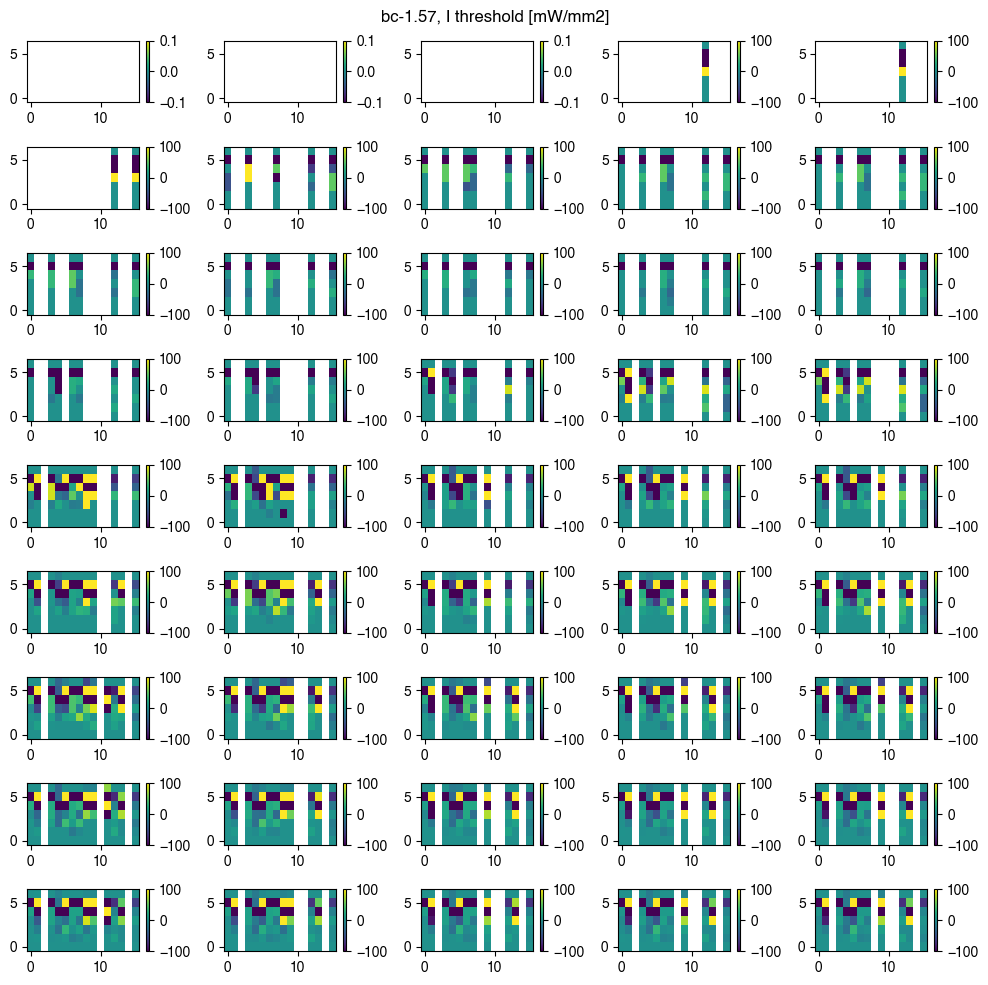

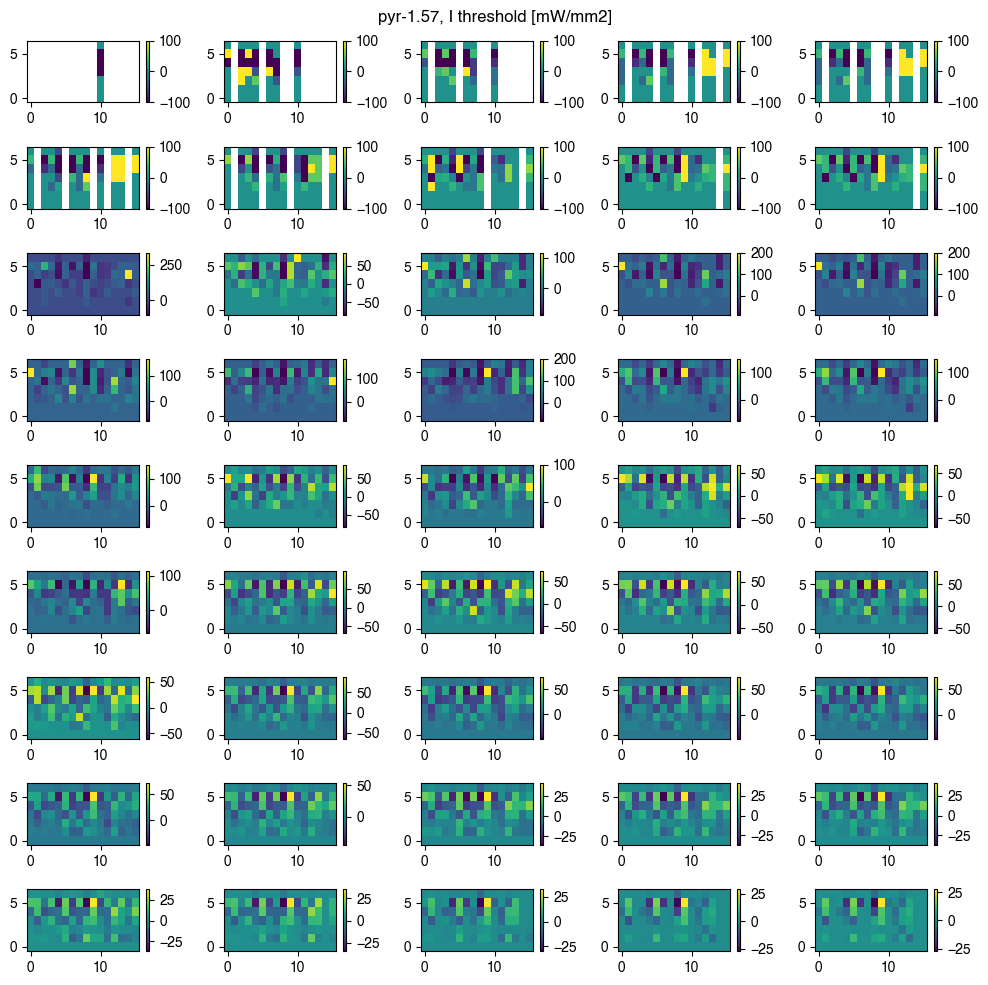

In [8]:
datalabel = 'surf_avg'
for pitch in unique_values_columns_vta['theta_0']:
    for cellt in unique_values_columns_vta['celltype']:
        fig_df = vta_df[selection_generator(
            vta_df, unique_values_columns=unique_values_columns_vta, celltype=cellt, theta_0=pitch)]
        urowAxesVals = fig_df['level'].unique()[:]
        ucolumnAxesVals = fig_df['dur'].unique()[:]
        fig, axs = plt.subplots(len(urowAxesVals), len(
            ucolumnAxesVals), tight_layout=True, figsize=(10, 10))
        for i, row in enumerate(urowAxesVals):
            for j, column in enumerate(ucolumnAxesVals):
                ax_df = fig_df[selection_generator(
                    fig_df, unique_values_columns=unique_values_columns_vta, level=row, dur=column)]
                if not all(np.isnan(ax_df[datalabel])):

                    data_toplot = EcF.prepareDataforInterp(np.array(
                        (ax_df['cluster_eet'], ax_df['idx_incluster_eet'], ax_df[datalabel])).T, 'ninterp', sorted=False)
                    yY, zZ = np.meshgrid(
                        data_toplot[0], data_toplot[1], indexing='ij')
                    data_toplot = list(data_toplot)
                    data_toplot[-1] = (data_toplot[-1] - data_toplot[-1][:, 0:1]) / \
                        data_toplot[-1][:, 0:1]*100

                    Imin = (np.nanmin(data_toplot[-1].ravel()))

                    Imax = np.nanmax(data_toplot[-1].ravel())
                    Imax = 100 if np.isinf(Imax) else Imax
                    norm = mpl.cm.colors.Normalize(vmax=Imax, vmin=Imin)
                    im, cb = EcF.slicePlot(data_toplot, axs[i, j], fig, plotGrid=(
                        yY, zZ), structured=True, norm=norm)

        fig.suptitle(f'{cellt}-{pitch:0.2f}, I threshold [mW/mm2]')
        print()

## scatter plots

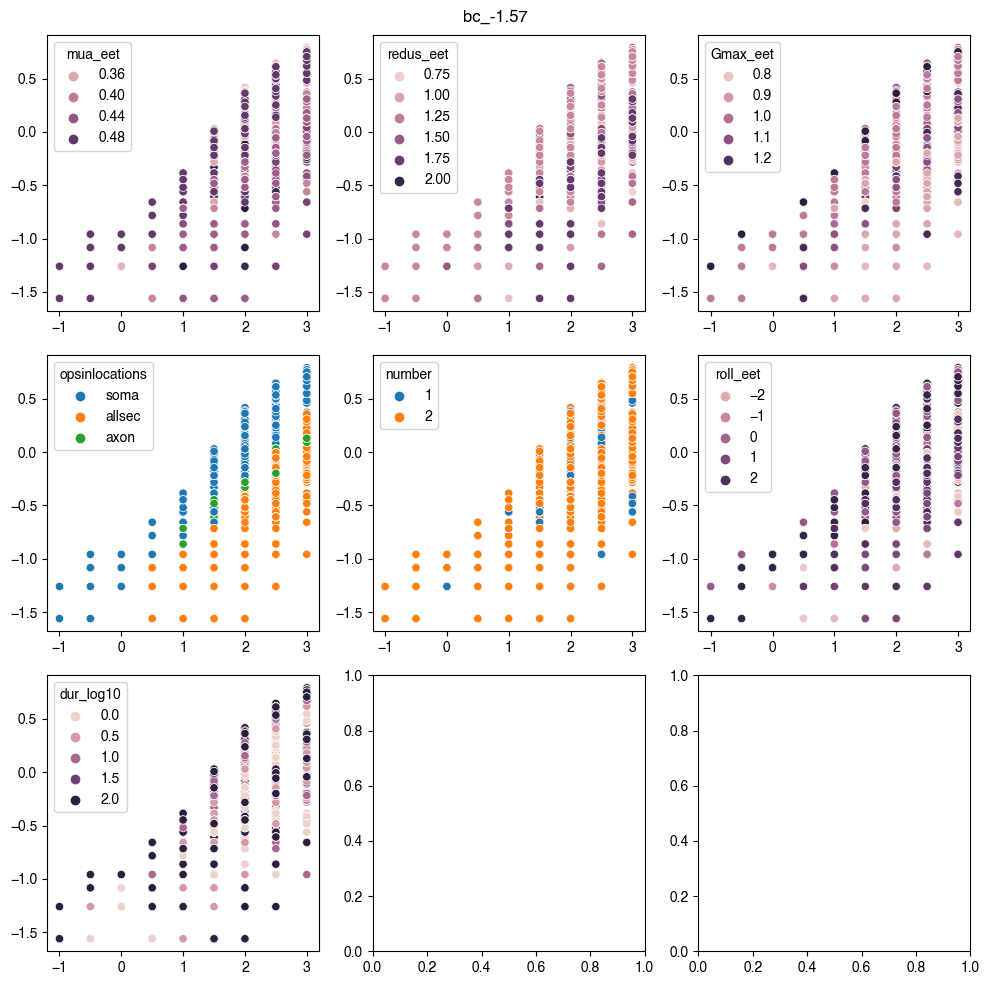

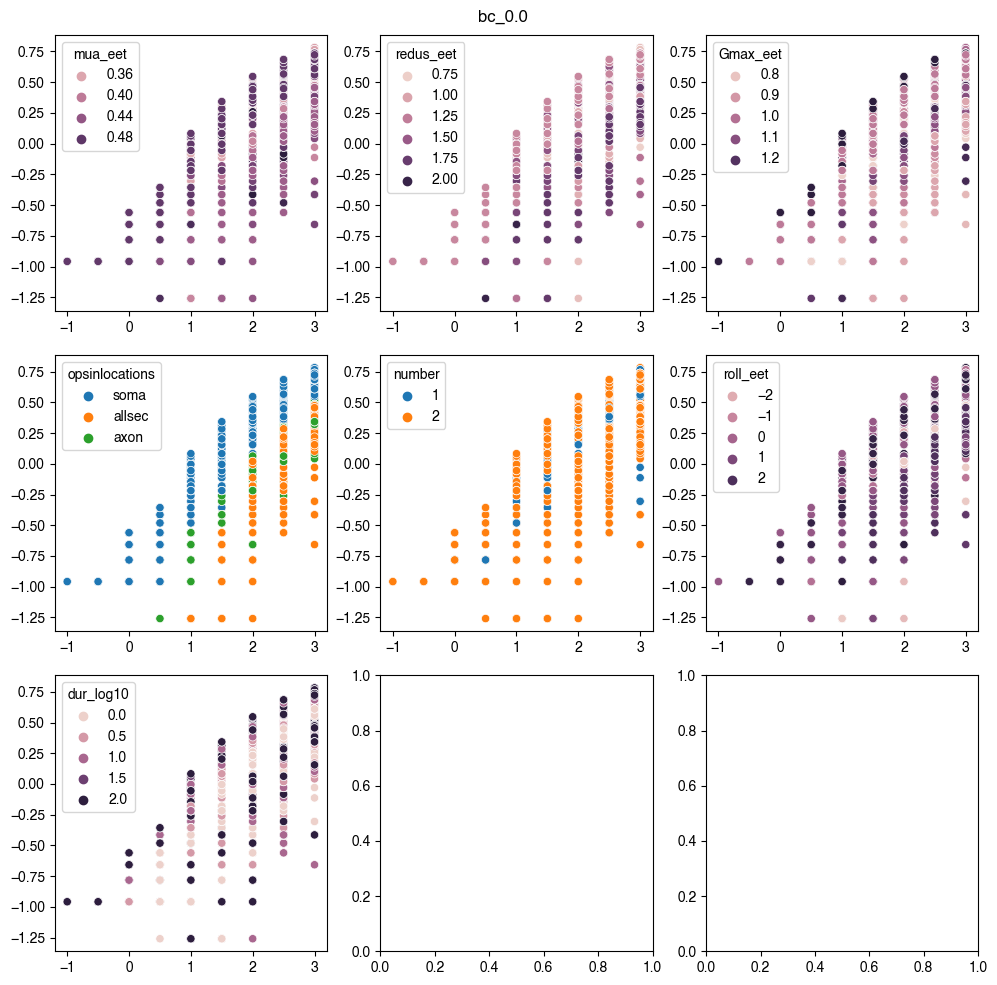

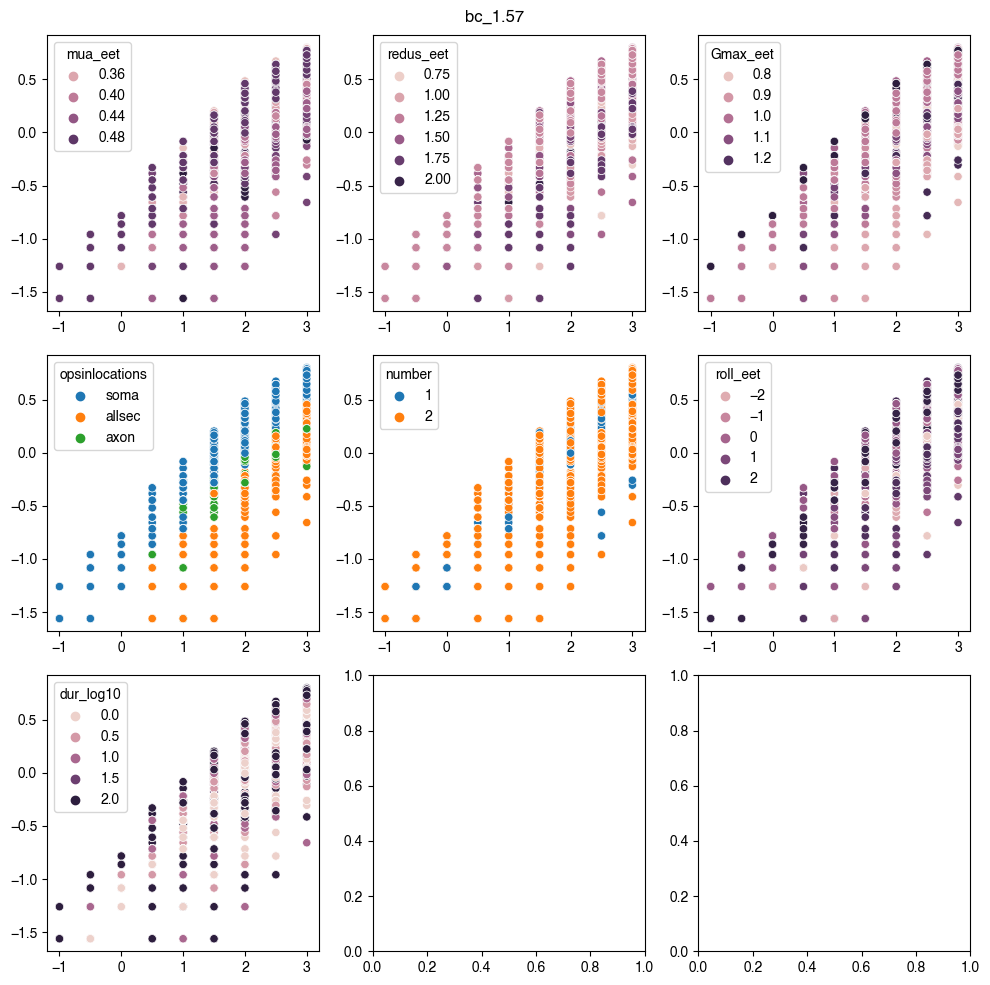

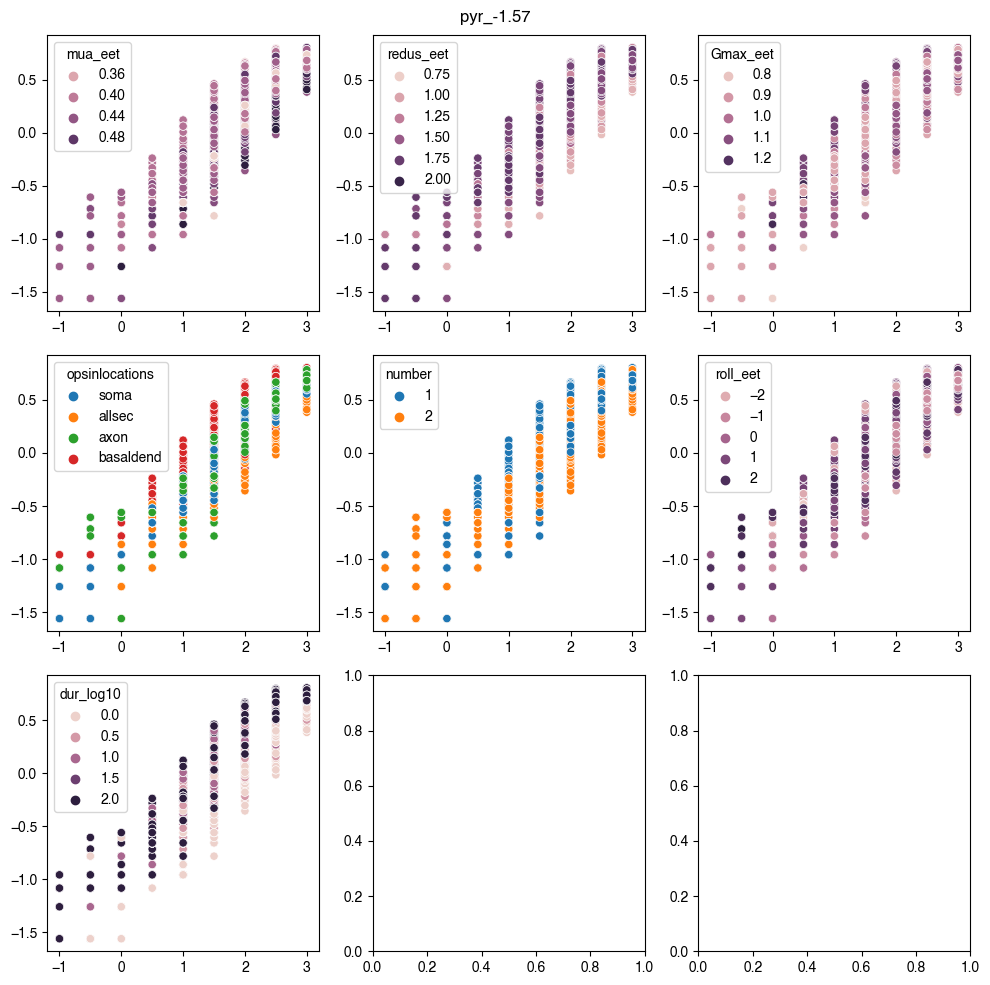

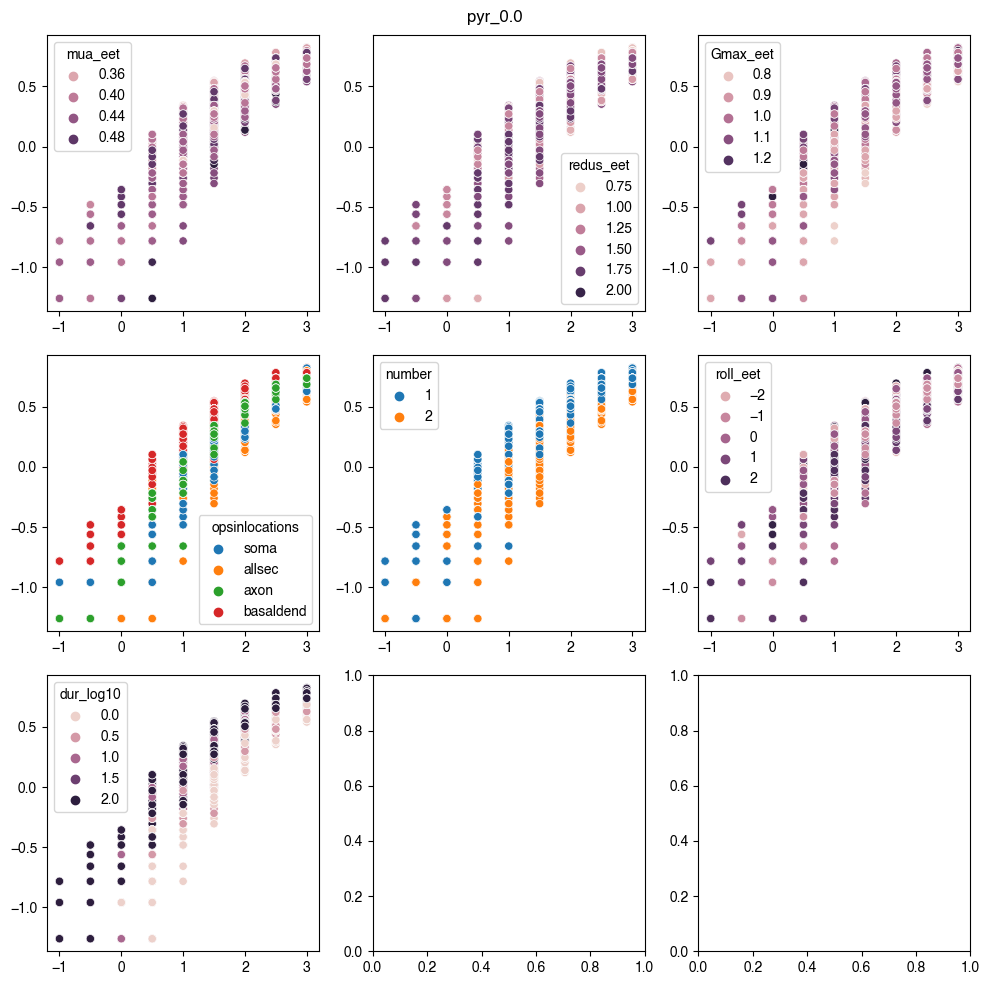

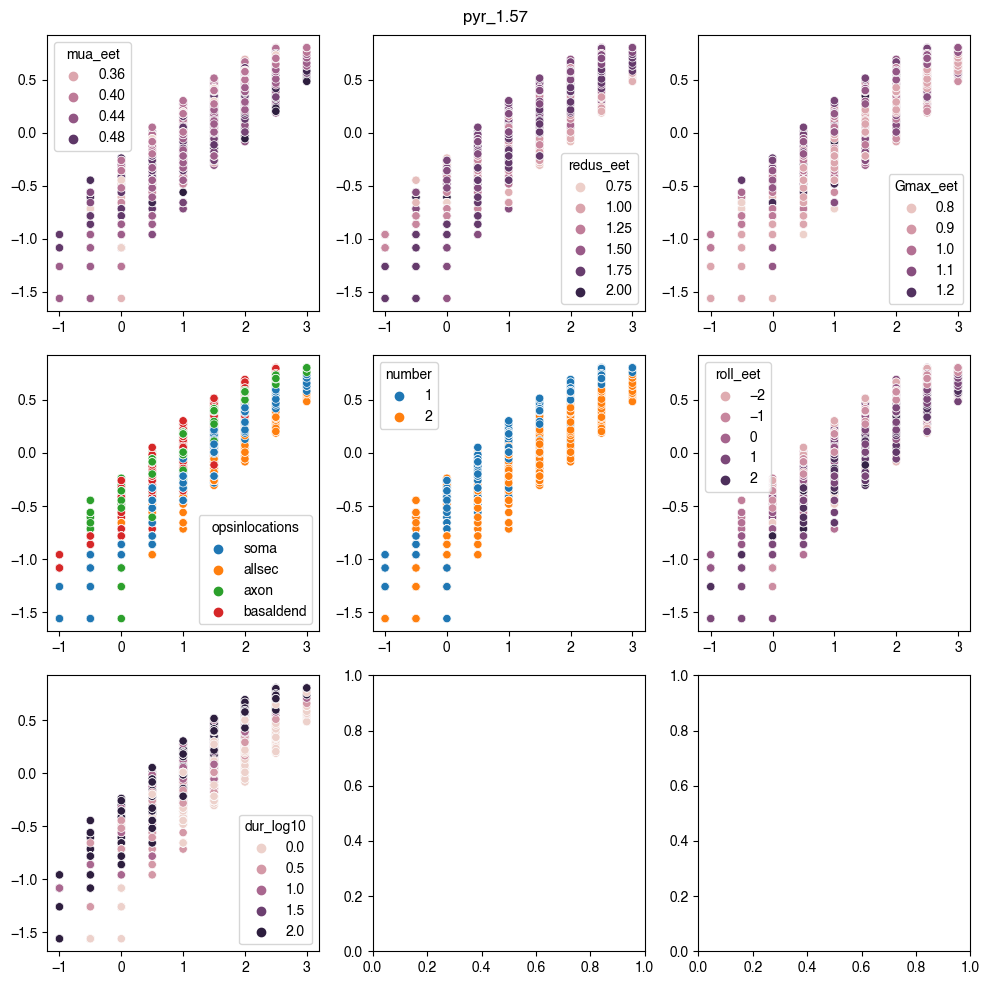

In [9]:
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['mua_eet', 'redus_eet', 'Gmax_eet',
            'opsinlocations', 'number', 'roll_eet', 'dur_log10']
for cth in uct_theta:
    fig, axs = plt.subplots(
        np.ceil(len(row_strs)/3).astype(int), 3, tight_layout=True, figsize=(10, 10))
    for r, ax in zip(row_strs, axs.ravel()):
        idx = (vta_df['ct_theta'] == cth)
        sns.scatterplot(data=vta_df[idx], x='level_log10',
                        y='surf_avg_log10', hue=r, ax=ax)

        ax.set_xlabel(None)
        ax.set_ylabel(None)
    fig.suptitle(cth)

## trajectory plots

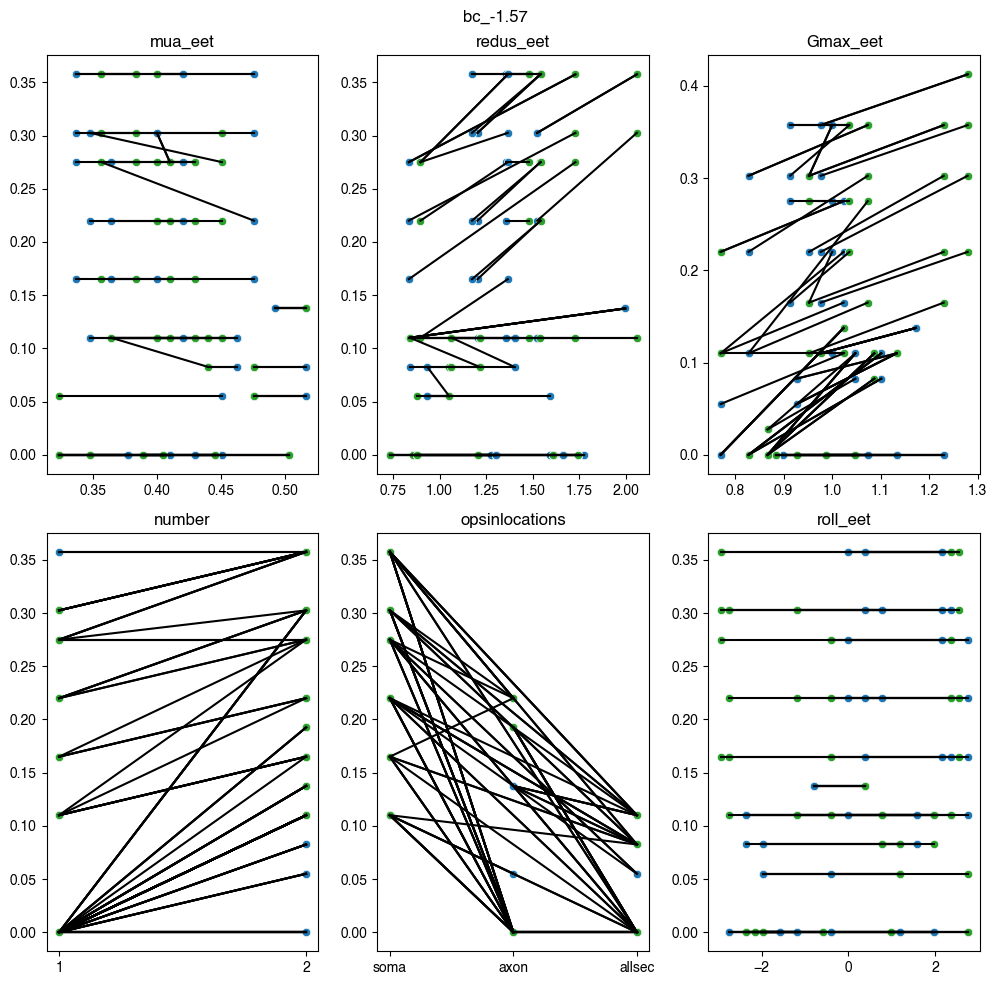

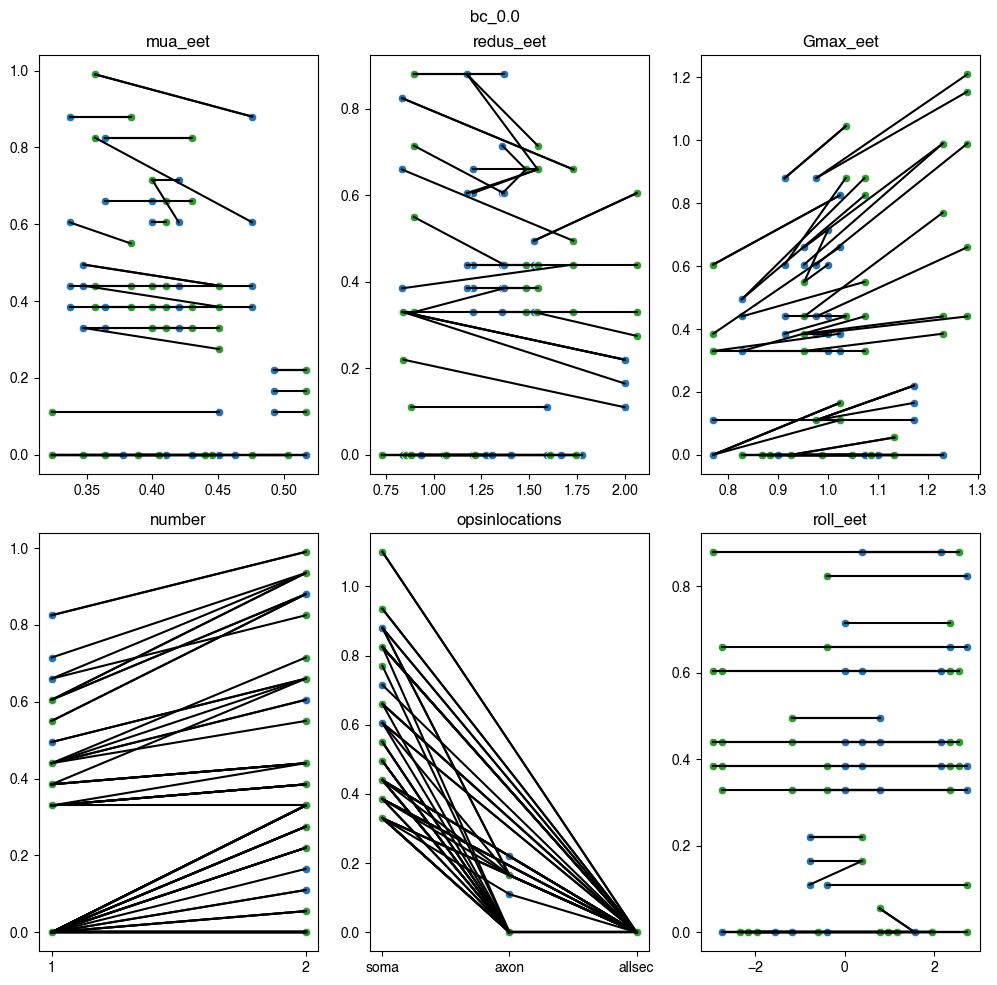

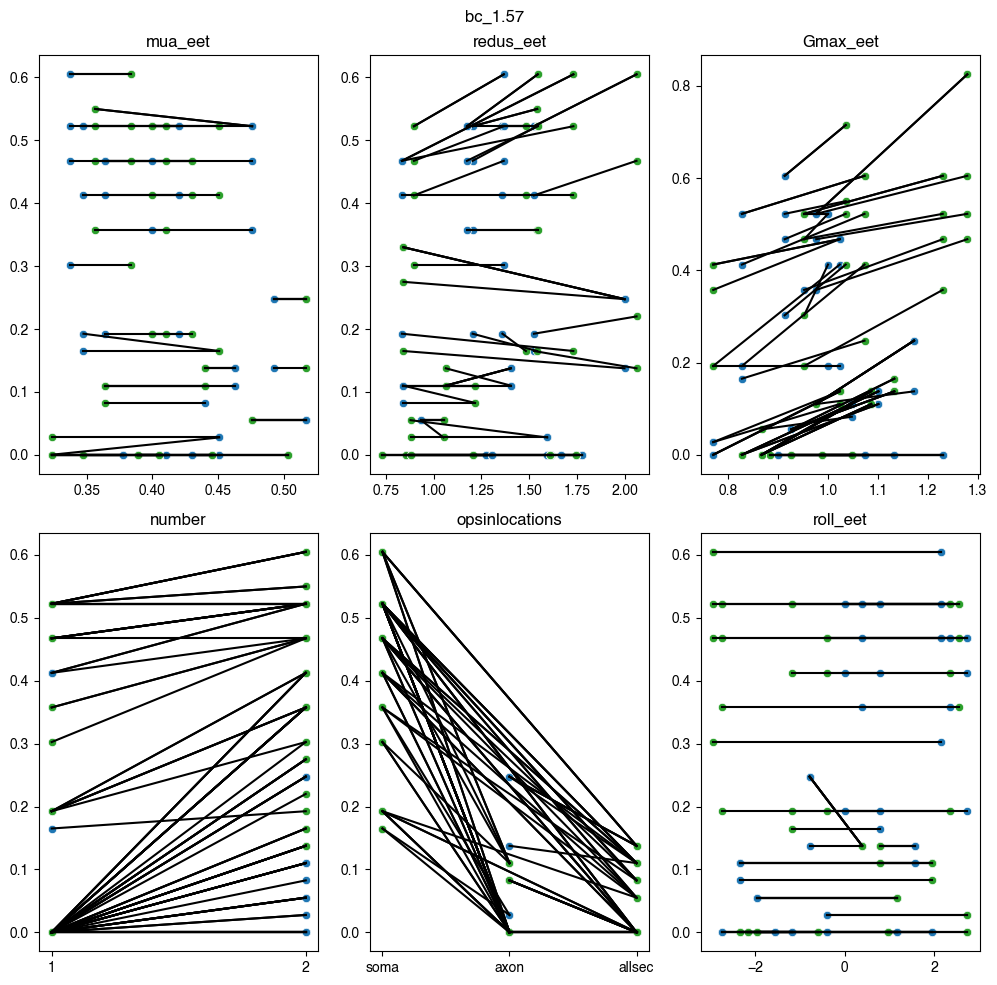

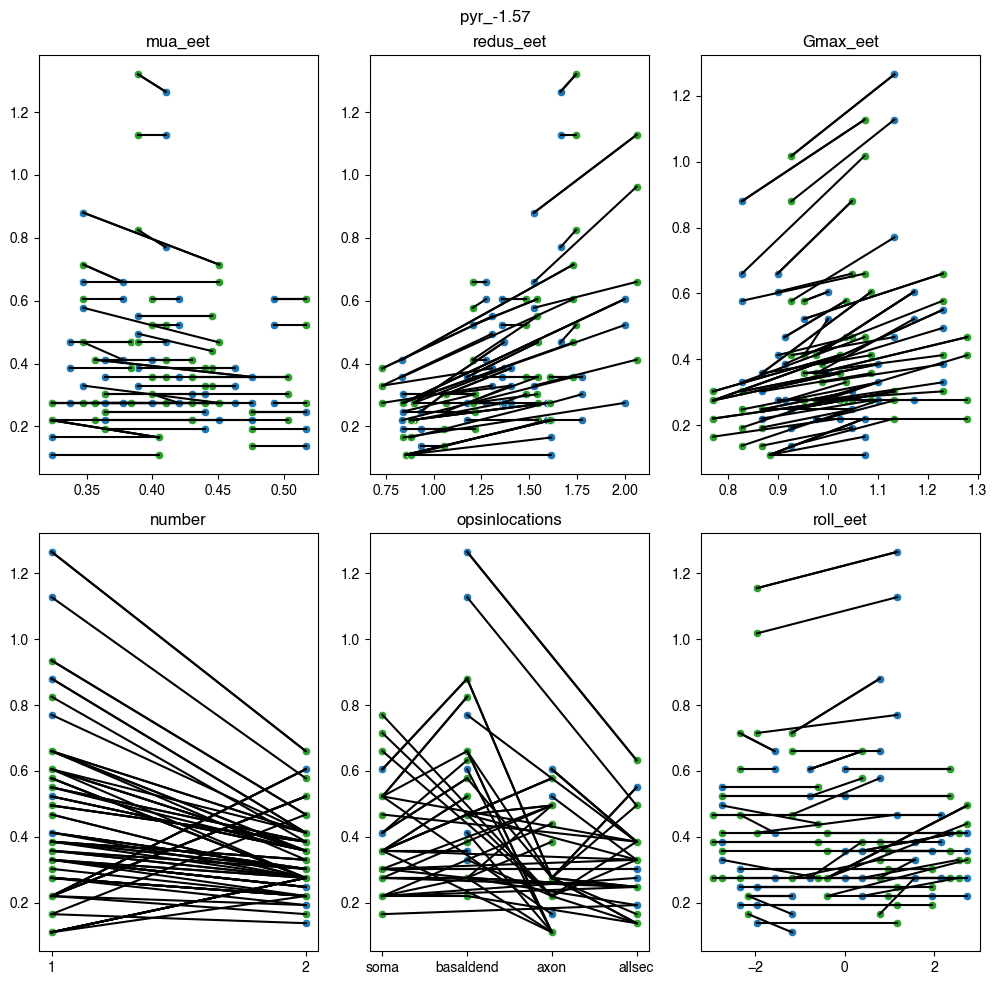

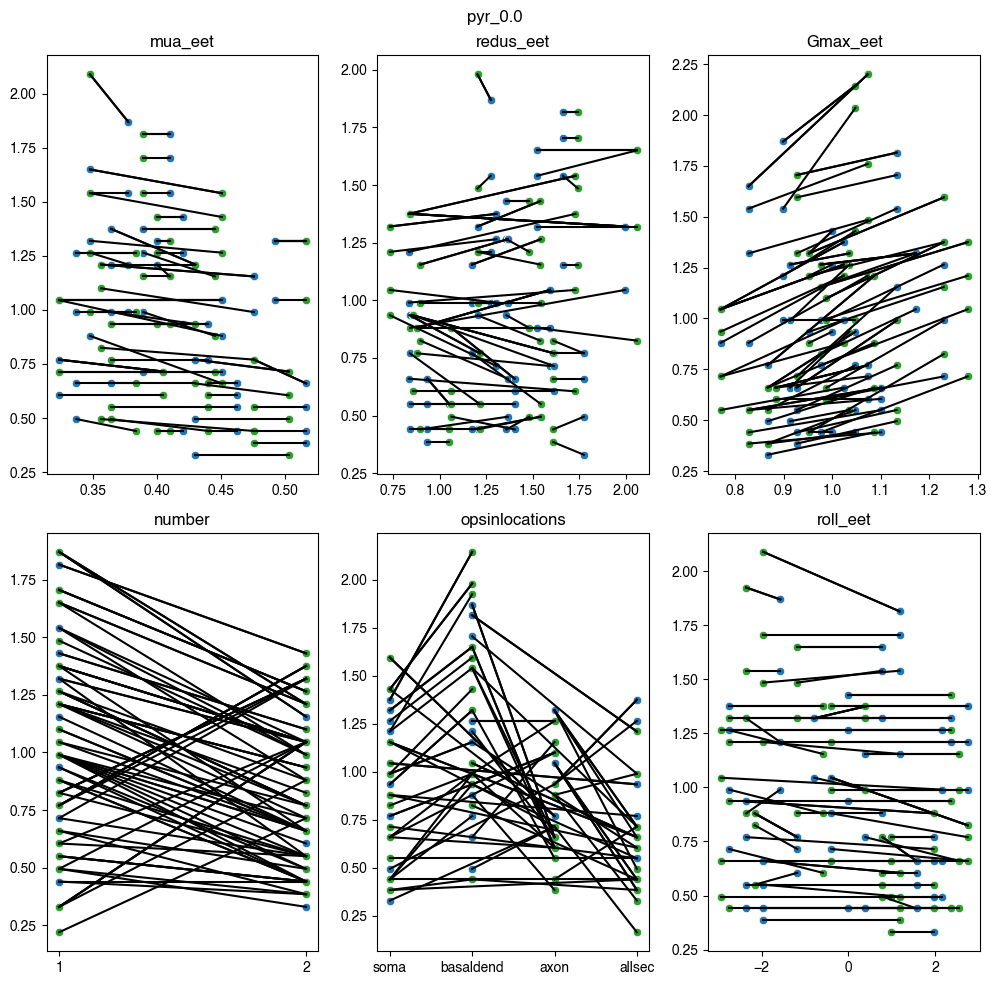

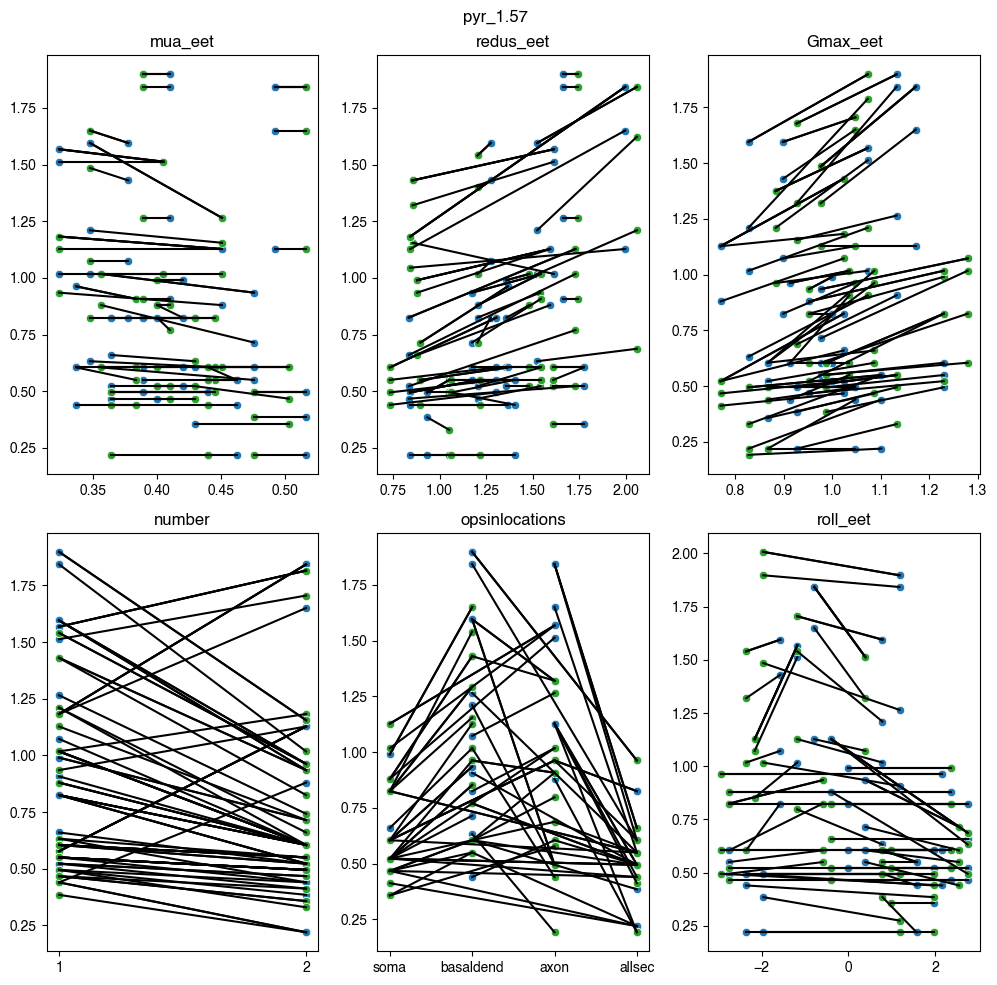

In [10]:
level = 10
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['mua_eet', 'redus_eet', 'Gmax_eet',
            'number', 'opsinlocations', 'roll_eet']

for cth in uct_theta:
    idx_m = (vta_df['ct_theta'] == cth) & (vta_df['level'] == level)
    fig, axs = plt.subplots(
        np.ceil(len(row_strs)/3).astype(int), 3, tight_layout=True, figsize=(10, 10))
    for i, (r, ax) in enumerate(zip(row_strs, axs.ravel())):
        idx = idx_m & ((vta_df['idx_incluster_eet'] == 0))
        intm_df1 = vta_df[idx].set_index(
            ['ct_theta', 'level', 'dur', 'cluster_eet'])
        sns.scatterplot(data=vta_df[idx], x=r,
                        y='surf_avg', color='tab:blue', ax=ax)

        idx_2 = idx_m & (vta_df['idx_incluster_eet'] == i+1)
        intm_df2 = vta_df[idx_2].set_index(
            ['ct_theta', 'level', 'dur', 'cluster_eet'])
        sns.scatterplot(data=vta_df[idx_2], x=r,
                        y='surf_avg', color='tab:green', ax=ax)
        m_df = pd.merge(intm_df1, intm_df2, left_index=True, right_index=True, suffixes=(
            '_0', '_1'), validate='one_to_many').reset_index()
        data = m_df[[r+'_0', r+'_1', 'surf_avg_0', 'surf_avg_1']].values
        for d in data:
            ax.plot(d[0:2], d[2:], 'k')

        ax.set_xlabel(None)
        ax.set_ylabel(None)
        ax.set_title(r)
    fig.suptitle(cth)

# Optimal/Worst Position Visualization

C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\3206026823.py:162: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk] / \
C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\3206026823.py:164: RuntimeWarning: invalid value encountered in true_divide
  w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk] / \
C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\3206026823.py:232: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk] / \
C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\3206026823.py:234: RuntimeWarning: invalid value encountered in true_divide
  w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk] / \
C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\3206026823.py:232: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk] / \
C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\3206026823.py:234: RuntimeWarning: invalid

,b_opt_pos_TAC,w_opt_pos_TAC,dur,opsinlocations,neurontemplate,theta_0,level,Gmax,selector
25200,NaN,NaN,1.0,soma,pyr_1,1.57,0.100,1.000,pyr_soma
25201,0.04,0.48,1.0,soma,pyr_1,1.57,0.316,1.000,pyr_soma
25202,0.04,0.48,1.0,soma,pyr_1,1.57,1.000,1.000,pyr_soma
25203,0.04,-0.40,1.0,soma,pyr_1,1.57,3.162,1.000,pyr_soma
25204,0.26,-0.40,1.0,soma,pyr_1,1.57,10.000,1.000,pyr_soma
...,...,...,...,...,...,...,...,...,...
30145,0.04,-0.29,100.0,soma,pyr_2,1.57,10.000,0.867,pyr_soma
30146,0.15,-0.40,100.0,soma,pyr_2,1.57,31.623,0.867,pyr_soma
30147,0.48,-0.29,100.0,soma,pyr_2,1.57,100.000,0.867,pyr_soma
30148,0.15,-0.29,100.0,soma,pyr_2,1.57,316.228,0.867,pyr_soma


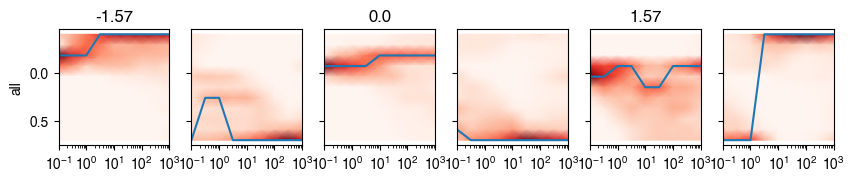

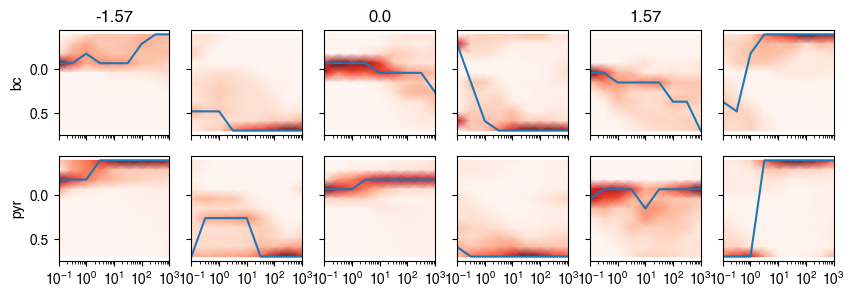

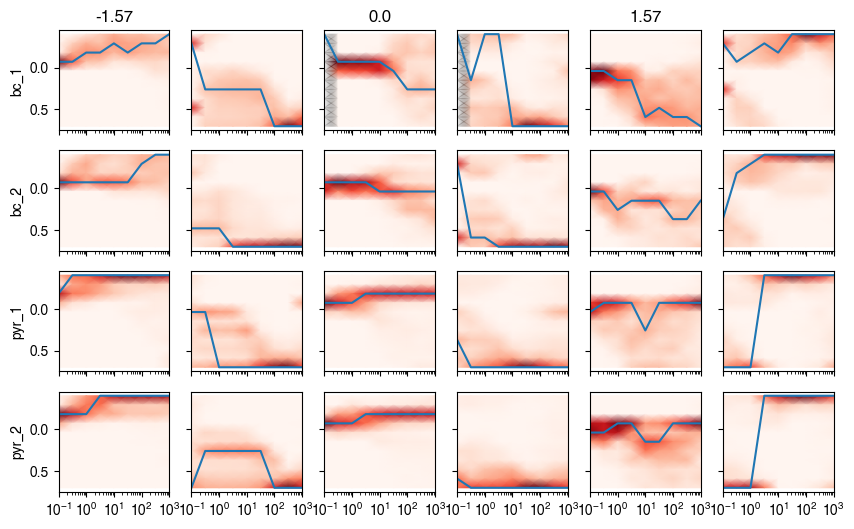

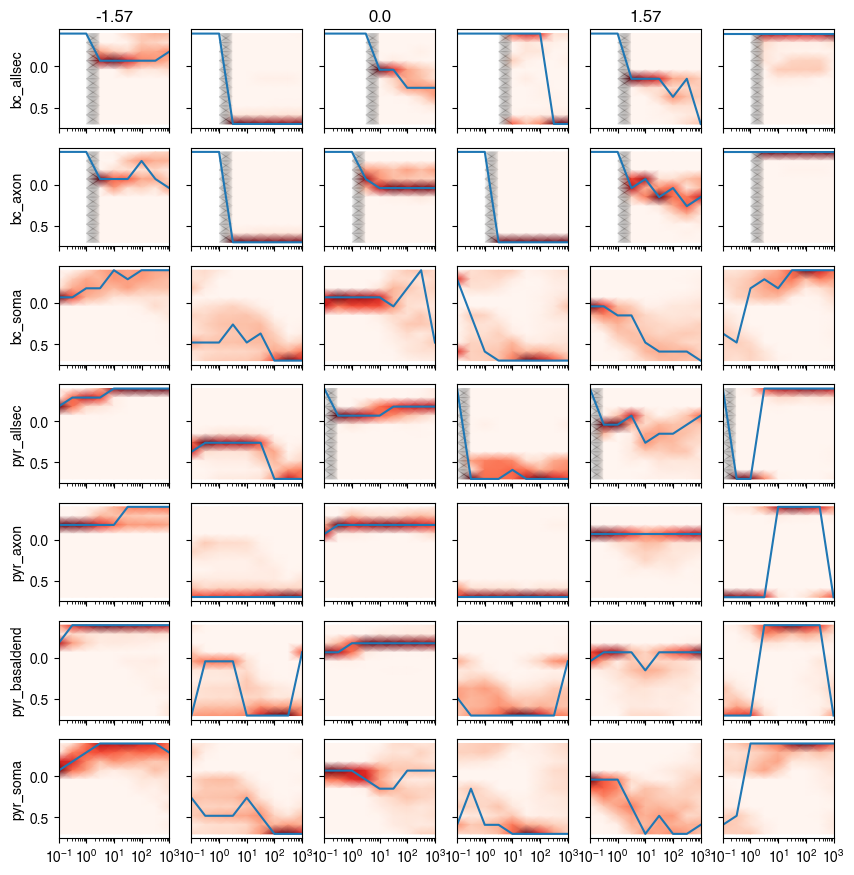

In [11]:
zpos = np.arange(-400, 810, 110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
ukeys = ['all']
columnsOI = ['b_opt_pos_TAC', 'w_opt_pos_TAC', 'dur',
             'opsinlocations', 'neurontemplate', 'theta_0', 'level', 'Gmax']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['theta_0'] == pitch)
        intm_df = vta_limit_df.loc[idx, columnsOI]
        b_opt_dict[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        w_opt_dict[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC'] == zp) & (
                    intm_df['level'] == ity)
                b_opt_dict[pitch][uk][i, j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC'] == zp) & (
                    intm_df['level'] == ity)
                w_opt_dict[pitch][uk][i, j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk] / \
            np.sum(b_opt_dict[pitch][uk], axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk] / \
            np.sum(w_opt_dict[pitch][uk], axis=0)

fig, axs = plt.subplots(len(ukeys), 6, figsize=(
    10, 1.5), sharex=True, sharey=True)
if len(ukeys) == 1:
    axs = np.array([axs])
xX, yY = np.meshgrid(intensities, zpos)
for uk, axrow in zip(ukeys, axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX, yY, b_opt_dict[theta]
                              [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk], axis=0)
        axrow[i*2].plot(intensities, zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45, 0.750])

        axrow[i*2+1].pcolormesh(xX, yY, w_opt_dict[theta]
                                [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk], axis=0)
        axrow[i*2+1].plot(intensities, zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45, 0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk == ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0, 0].invert_yaxis()

#################### celltype split#################################
####################################################################

zpos = np.arange(-400, 810, 110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
vta_limit_df['selector'] = vta_limit_df.apply(
    lambda x: f"{x['celltype']}", axis=1)
ukeys = vta_limit_df['selector'].unique()
columnsOI = ['b_opt_pos_TAC', 'w_opt_pos_TAC', 'dur', 'opsinlocations',
             'neurontemplate', 'theta_0', 'level', 'Gmax', 'selector']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['selector'] == uk) & (
            vta_limit_df['theta_0'] == pitch)
        intm_df = vta_limit_df.loc[idx, columnsOI]
        b_opt_dict[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        w_opt_dict[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC'] == zp) & (
                    intm_df['level'] == ity)
                b_opt_dict[pitch][uk][i, j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC'] == zp) & (
                    intm_df['level'] == ity)
                w_opt_dict[pitch][uk][i, j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk] / \
            np.sum(b_opt_dict[pitch][uk], axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk] / \
            np.sum(w_opt_dict[pitch][uk], axis=0)


vta_limit_df.drop(columns=['selector'])


fig, axs = plt.subplots(len(ukeys), 6, figsize=(10, 3),
                        sharex=True, sharey=True)
xX, yY = np.meshgrid(intensities, zpos)
for uk, axrow in zip(ukeys, axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX, yY, b_opt_dict[theta]
                              [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk], axis=0)
        axrow[i*2].plot(intensities, zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45, 0.750])

        axrow[i*2+1].pcolormesh(xX, yY, w_opt_dict[theta]
                                [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk], axis=0)
        axrow[i*2+1].plot(intensities, zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45, 0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk == ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0, 0].invert_yaxis()


#################### neuron type split #################################
####################################################################

zpos = np.arange(-400, 810, 110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
vta_limit_df['selector'] = vta_limit_df.apply(
    lambda x: f"{x['neurontemplate']}", axis=1)
ukeys = np.sort(vta_limit_df['selector'].unique())
columnsOI = ['b_opt_pos_TAC', 'w_opt_pos_TAC', 'dur', 'opsinlocations',
             'neurontemplate', 'theta_0', 'level', 'Gmax', 'selector']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['selector'] == uk) & (
            vta_limit_df['theta_0'] == pitch)
        intm_df = vta_limit_df.loc[idx, columnsOI]
        b_opt_dict[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        w_opt_dict[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC'] == zp) & (
                    intm_df['level'] == ity)
                b_opt_dict[pitch][uk][i, j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC'] == zp) & (
                    intm_df['level'] == ity)
                w_opt_dict[pitch][uk][i, j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk] / \
            np.sum(b_opt_dict[pitch][uk], axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk] / \
            np.sum(w_opt_dict[pitch][uk], axis=0)


vta_limit_df.drop(columns=['selector'])


fig, axs = plt.subplots(len(ukeys), 6, figsize=(10, 6),
                        sharex=True, sharey=True)
xX, yY = np.meshgrid(intensities, zpos)
for uk, axrow in zip(ukeys, axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX, yY, b_opt_dict[theta]
                              [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk], axis=0)
        axrow[i*2].plot(intensities, zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45, 0.750])

        axrow[i*2+1].pcolormesh(xX, yY, w_opt_dict[theta]
                                [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk], axis=0)
        axrow[i*2+1].plot(intensities, zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45, 0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk == ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0, 0].invert_yaxis()


#################### opsin and celltype split#################################
####################################################################

zpos = np.arange(-400, 810, 110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
vta_limit_df['selector'] = vta_limit_df.apply(
    lambda x: f"{x['celltype']}_{x['opsinlocations']}", axis=1)
# vta_limit_df['selector'] = vta_limit_df.apply(lambda x: f"{x['opsinlocations']}",axis=1)
ukeys = np.sort(vta_limit_df['selector'].unique())
columnsOI = ['b_opt_pos_TAC', 'w_opt_pos_TAC', 'dur', 'opsinlocations',
             'neurontemplate', 'theta_0', 'level', 'Gmax', 'selector']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['selector'] == uk) & (
            vta_limit_df['theta_0'] == pitch)
        intm_df = vta_limit_df.loc[idx, columnsOI]
        b_opt_dict[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        w_opt_dict[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC'] == zp) & (
                    intm_df['level'] == ity)
                b_opt_dict[pitch][uk][i, j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC'] == zp) & (
                    intm_df['level'] == ity)
                w_opt_dict[pitch][uk][i, j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk] / \
            np.sum(b_opt_dict[pitch][uk], axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk] / \
            np.sum(w_opt_dict[pitch][uk], axis=0)


fig, axs = plt.subplots(len(ukeys), 6, figsize=(
    10, 1.5*7), sharex=True, sharey=True)
xX, yY = np.meshgrid(intensities, zpos)
for uk, axrow in zip(ukeys, axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX, yY, b_opt_dict[theta]
                              [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk], axis=0)
        axrow[i*2].plot(intensities, zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45, 0.750])

        axrow[i*2+1].pcolormesh(xX, yY, w_opt_dict[theta]
                                [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk], axis=0)
        axrow[i*2+1].plot(intensities, zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45, 0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk == ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0, 0].invert_yaxis()
intm_df

### low mua vs high mua

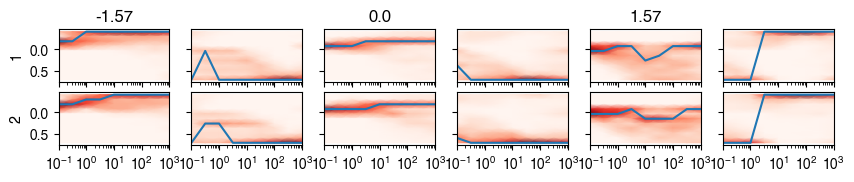

In [12]:
# compare low mua vs high mua
zpos = np.arange(-400, 810, 110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']

vta_limit_df['selector'] = 1+(vta_limit_df['mua_eet'] > 0.410089).astype(int)
ukeys = np.sort(vta_limit_df['selector'].unique())
columnsOI = ['b_opt_pos_TAC', 'w_opt_pos_TAC', 'dur', 'opsinlocations',
             'neurontemplate', 'theta_0', 'level', 'Gmax', 'mua_eet', 'mus_eet']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['theta_0'] == pitch) & (
            vta_limit_df['selector'] == uk)
        intm_df = vta_limit_df.loc[idx, columnsOI]
        b_opt_dict[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        w_opt_dict[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC'] == zp) & (
                    intm_df['level'] == ity)
                b_opt_dict[pitch][uk][i, j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC'] == zp) & (
                    intm_df['level'] == ity)
                w_opt_dict[pitch][uk][i, j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk] / \
            np.sum(b_opt_dict[pitch][uk], axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk] / \
            np.sum(w_opt_dict[pitch][uk], axis=0)

fig, axs = plt.subplots(len(ukeys), 6, figsize=(
    10, 1.5), sharex=True, sharey=True)
if len(ukeys) == 1:
    axs = np.array([axs])
xX, yY = np.meshgrid(intensities, zpos)
for uk, axrow in zip(ukeys, axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX, yY, b_opt_dict[theta]
                              [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk], axis=0)
        axrow[i*2].plot(intensities, zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45, 0.750])

        axrow[i*2+1].pcolormesh(xX, yY, w_opt_dict[theta]
                                [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk], axis=0)
        axrow[i*2+1].plot(intensities, zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45, 0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk == ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0, 0].invert_yaxis()

C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\3369386572.py:42: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict_low[pitch][uk] = b_opt_dict_low[pitch][uk] / \
C:\Users\rschoete\AppData\Local\Temp\ipykernel_18104\3369386572.py:44: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict_high[pitch][uk] = b_opt_dict_high[pitch][uk] / \


,b_opt_pos_TAC,w_opt_pos_TAC,dur,opsinlocations,neurontemplate,theta_0,level,Gmax,mua_eet,mus_eet
10080,NaN,NaN,1.0,soma,bc_1,1.57,0.100,1.000,0.420000,11.33000
10081,NaN,NaN,1.0,soma,bc_1,1.57,0.316,1.000,0.420000,11.33000
10082,0.15,0.48,1.0,soma,bc_1,1.57,1.000,1.000,0.420000,11.33000
10083,0.15,-0.40,1.0,soma,bc_1,1.57,3.162,1.000,0.420000,11.33000
10084,0.59,-0.40,1.0,soma,bc_1,1.57,10.000,1.000,0.420000,11.33000
...,...,...,...,...,...,...,...,...,...,...
30145,0.04,-0.29,100.0,soma,pyr_2,1.57,10.000,0.867,0.429911,11.06265
30146,0.15,-0.40,100.0,soma,pyr_2,1.57,31.623,0.867,0.429911,11.06265
30147,0.48,-0.29,100.0,soma,pyr_2,1.57,100.000,0.867,0.429911,11.06265
30148,0.15,-0.29,100.0,soma,pyr_2,1.57,316.228,0.867,0.429911,11.06265


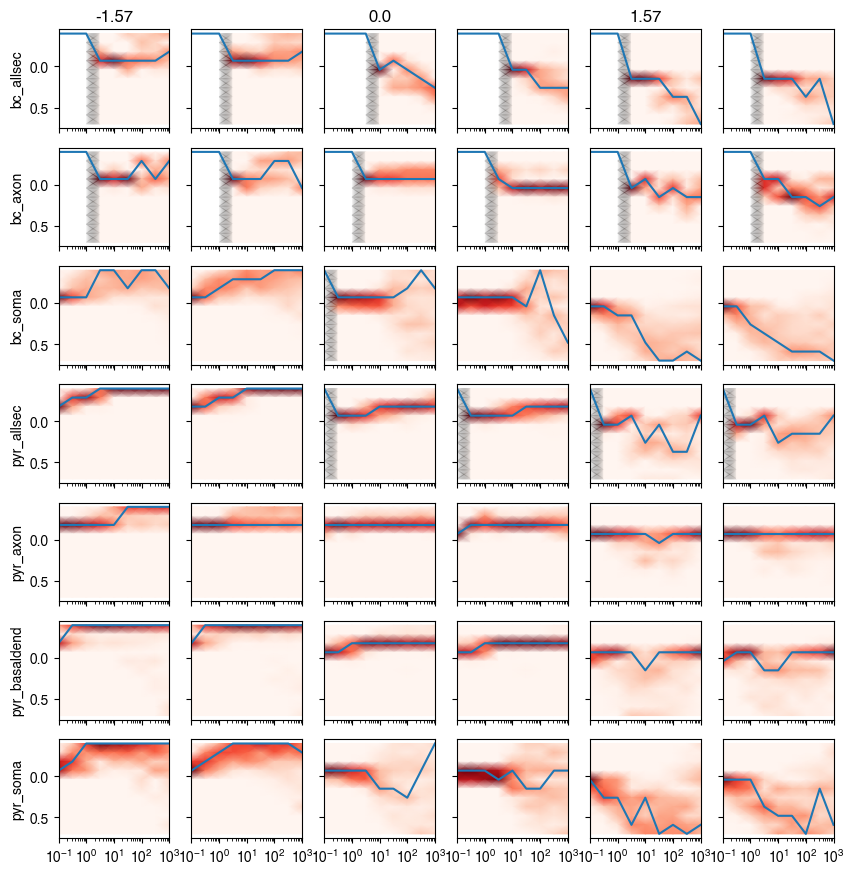

In [13]:
vta_limit_df['mua_group'] = 1+(vta_limit_df['mua_eet'] > 0.410089).astype(int)
vta_lowmua_df = vta_limit_df[vta_limit_df['mua_group'] == 1].copy()
vta_highmua_df = vta_limit_df[vta_limit_df['mua_group'] == 2].copy()
zpos = np.arange(-400, 810, 110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
vta_lowmua_df['selector'] = vta_lowmua_df.apply(
    lambda x: f"{x['celltype']}_{x['opsinlocations']}", axis=1)
vta_highmua_df['selector'] = vta_highmua_df.apply(
    lambda x: f"{x['celltype']}_{x['opsinlocations']}", axis=1)
# vta_limit_df['selector'] = vta_limit_df.apply(lambda x: f"{x['opsinlocations']}",axis=1)
ukeys = np.sort(vta_lowmua_df['selector'].unique())
ukeyshigh = np.sort(vta_highmua_df['selector'].unique())
columnsOI = ['b_opt_pos_TAC', 'w_opt_pos_TAC', 'dur', 'opsinlocations',
             'neurontemplate', 'theta_0', 'level', 'Gmax', 'selector']
b_opt_dict_low = {}
b_opt_dict_high = {}
for pitch in thetas:
    b_opt_dict_low[pitch] = {}
    b_opt_dict_high[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_lowmua_df['selector'] == uk) & (
            vta_lowmua_df['theta_0'] == pitch)
        intm_low_df = vta_lowmua_df.loc[idx, columnsOI]
        idx = (vta_highmua_df['selector'] == uk) & (
            vta_highmua_df['theta_0'] == pitch)
        intm_high_df = vta_highmua_df.loc[idx, columnsOI]
        b_opt_dict_low[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        b_opt_dict_high[pitch][uk] = np.zeros((len(zpos), len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_low_df['b_opt_pos_TAC'] == zp) & (
                    intm_low_df['level'] == ity)
                b_opt_dict_low[pitch][uk][i, j] = np.sum(idx)

                idx = (intm_high_df['b_opt_pos_TAC'] == zp) & (
                    intm_high_df['level'] == ity)
                b_opt_dict_high[pitch][uk][i, j] = np.sum(idx)

for pitch in thetas:
    for uk in ukeys[:]:
        b_opt_dict_low[pitch][uk] = b_opt_dict_low[pitch][uk] / \
            np.sum(b_opt_dict_low[pitch][uk], axis=0)
        b_opt_dict_high[pitch][uk] = b_opt_dict_high[pitch][uk] / \
            np.sum(b_opt_dict_high[pitch][uk], axis=0)


fig, axs = plt.subplots(len(ukeys), 6, figsize=(
    10, 1.5*7), sharex=True, sharey=True)
xX, yY = np.meshgrid(intensities, zpos)
for uk, axrow in zip(ukeys, axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX, yY, b_opt_dict_low[theta]
                              [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(b_opt_dict_low[theta][uk], axis=0)
        axrow[i*2].plot(intensities, zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45, 0.750])

        axrow[i*2+1].pcolormesh(xX, yY, b_opt_dict_high[theta]
                                [uk], shading='gouraud', alpha=1, cmap='Reds')
        idx_max = np.argmax(b_opt_dict_high[theta][uk], axis=0)
        axrow[i*2+1].plot(intensities, zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45, 0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk == ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0, 0].invert_yaxis()
intm_df

# EET

In [14]:
r = int(16)
# detect false calculated EET (check opsinloc and morpho)
columnsOI = ['surf_avg', 'EETsimidx', 'mua_eet', 'redus_eet', 'Gmax_eet', 'cell_eet',
             'loc_eet', 'roll_eet', 'opsinlocations', 'number', 'cluster_eet', 'idx_incluster_eet']
false_sims = {}
for celltype in ['pyr', 'bc']:
    for th in unique_values_columns_vta['theta_0']:
        false_sims[f"{celltype}_{th}"] = []
        intm_df = vta_df.loc[selection_generator(
            vta_df, unique_values_columns_vta, dur=10, level=10, ct_theta=f"{celltype}_{th}"), columnsOI].copy()

        intm_df = intm_df.sort_values(by=['EETsimidx'])
        print(celltype, th)
        for ic in range(r):
            mydata = intm_df[intm_df['cluster_eet'] ==
                             ic].copy().set_index('idx_incluster_eet')
            for i, param in enumerate(['mua_eet', 'redus_eet', 'Gmax_eet', 'cell_eet', 'loc_eet', 'roll_eet']):
                center_param = mydata.loc[0, param]
                step_param = mydata.loc[i+1, param]
                if center_param == step_param:
                    false_sims[f"{celltype}_{th}"].append(
                        mydata.loc[i+1, 'EETsimidx'])
false_sims

pyr -1.57
pyr 0.0
pyr 1.57
bc -1.57
bc 0.0
bc 1.57


{'pyr_-1.57': [],
 'pyr_0.0': [],
 'pyr_1.57': [],
 'bc_-1.57': [],
 'bc_0.0': [],
 'bc_1.57': []}

In [15]:
# exclude cell and location from EET
vta_df_nocellloc = vta_df.copy()
cellidx = 4+np.arange(r)*7
locidx = 5+np.arange(r)*7
vta_df_nocellloc = vta_df_nocellloc.set_index('EETsimidx')
vta_df_nocellloc = vta_df_nocellloc.drop(
    index=np.concatenate((cellidx, locidx)))
vta_df_nocellloc = vta_df_nocellloc.reset_index()
vta_df_nocellloc.drop(columns=['loc_eet', 'cell_eet'])
vta_df_nocellloc

,EETsimidx,vta_low,vta_up,surf_low,surf_up,b_opt_pos,b_opt_pos_TAC,w_opt_pos_TAC,b_opt_pos_TACamp,w_opt_pos_TACamp,...,surf_low_log10,surf_up_log10,dur_log10,Gmax_log10,level_log10,surf_avg_log10,ct_theta,redus_eet,cluster_eet,idx_incluster_eet
0,0.0,0.000000,0.000000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,...,-inf,-inf,0.0,0.0000,-1.0000,-inf,bc_-1.57,1.359600,0.0,0.0
1,0.0,0.000000,0.000000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,...,-inf,-inf,0.0,0.0000,-0.5003,-inf,bc_-1.57,1.359600,0.0,0.0
2,0.0,0.000000,0.064795,0.000,0.220,-0.07,-0.29,0.26,-0.29,-0.40,...,-inf,-0.6576,0.0,0.0000,0.0000,-1.0835,bc_-1.57,1.359600,0.0,0.0
3,0.0,0.000000,0.086394,0.000,0.275,-0.07,-0.29,0.26,-0.40,0.04,...,-inf,-0.5607,0.0,0.0000,0.5000,-0.9586,bc_-1.57,1.359600,0.0,0.0
4,0.0,0.000000,0.086394,0.000,0.275,-0.07,-0.29,0.26,-0.40,0.04,...,-inf,-0.5607,0.0,0.0000,1.0000,-0.9586,bc_-1.57,1.359600,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21595,99.0,1.274309,2.635011,1.100,1.980,0.15,0.04,-0.40,0.48,-0.29,...,0.0414,0.2967,2.0,0.0306,1.0000,0.1797,pyr_1.57,1.614587,14.0,1.0
21596,99.0,3.023783,5.421211,1.980,3.080,0.26,-0.07,-0.40,0.70,-0.40,...,0.2967,0.4886,2.0,0.0306,1.5000,0.3984,pyr_1.57,1.614587,14.0,1.0
21597,99.0,7.181484,11.457977,3.135,4.455,0.37,-0.07,-0.40,0.70,-0.18,...,0.4962,0.6488,2.0,0.0306,2.0000,0.5761,pyr_1.57,1.614587,14.0,1.0
21598,99.0,13.337043,19.730184,4.290,5.830,0.26,-0.07,-0.40,-0.18,-0.29,...,0.6325,0.7657,2.0,0.0306,2.5000,0.7018,pyr_1.57,1.614587,14.0,1.0


## calculate EET

d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code\Analyses\functionsAnalysis.py:590: RuntimeWarning: invalid value encountered in double_scalars
  relEE[i, j] = dy/ dx * Dr[j]/Y[ki]
d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code\Analyses\functionsAnalysis.py:590: RuntimeWarning: invalid value encountered in double_scalars
  relEE[i, j] = dy/ dx * Dr[j]/Y[ki]
d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code\Analyses\functionsAnalysis.py:590: RuntimeWarning: divide by zero encountered in double_scalars
  relEE[i, j] = dy/ dx * Dr[j]/Y[ki]
d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code\Analyses\functionsAnalysis.py:590: RuntimeWarning: invalid value encountered in double_scalars
  relEE[i, j] = dy/ dx * Dr[j]/Y[ki]
d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code\Analyses\functionsAnalysis.py:590: RuntimeWarning: divide by zero encountered in double_scalars
  relEE[i, j] = dy/ dx * 

                mi        sigma   order_mean    order_std          dur  \
count  1620.000000  1620.000000  1578.000000  1578.000000  1620.000000   
mean      0.445652     0.341734     2.400507     2.400507    29.157000   
std       0.851827     0.530499     1.786811     1.786811    37.052926   
min       0.000000     0.000000     0.000000     0.000000     1.000000   
25%       0.022226     0.043045     1.000000     1.000000     3.162000   
50%       0.151250     0.177148     2.000000     2.000000    10.000000   
75%       0.523359     0.420696     4.000000     4.000000    31.623000   
max       7.335625     4.317845     5.000000     5.000000   100.000000   

             level     mi_log10    std_log10  
count  1620.000000  1389.000000  1389.000000  
mean    162.492111    -0.749043    -0.693792  
std     311.629697     0.723866     0.539123  
min       0.100000    -2.764787    -2.176742  
25%       1.000000    -1.197561    -1.030614  
50%      10.000000    -0.658923    -0.611236  
75% 

d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code\Analyses\functionsAnalysis.py:590: RuntimeWarning: invalid value encountered in double_scalars
  relEE[i, j] = dy/ dx * Dr[j]/Y[ki]
d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code\Analyses\functionsAnalysis.py:590: RuntimeWarning: divide by zero encountered in double_scalars
  relEE[i, j] = dy/ dx * Dr[j]/Y[ki]
d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code\Analyses\functionsAnalysis.py:590: RuntimeWarning: invalid value encountered in double_scalars
  relEE[i, j] = dy/ dx * Dr[j]/Y[ki]
d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code\Analyses\functionsAnalysis.py:590: RuntimeWarning: divide by zero encountered in double_scalars
  relEE[i, j] = dy/ dx * Dr[j]/Y[ki]
d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code\Analyses\functionsAnalysis.py:590: RuntimeWarning: invalid value encountered in double_scalars
  relEE[i, j] = dy/ dx * 

,mi,sigma,EE,relEE,order_mean,order_std,label,dur,level,celltype,theta_0,number,mi_log10,std_log10
0,0.000000,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,NaN,mua_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
1,0.000000,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,NaN,redus_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
2,0.000000,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,NaN,Gmax_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
3,0.000000,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,NaN,cell_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
4,0.000000,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,NaN,loc_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1615,0.169557,0.379862,"[0.0, 0.21520672919716727, 0.0, 0.0, 0.0, 0.0,...","[0.0, 0.0423010769920722, 0.0, 0.0, 0.0, 0.0, ...",1.0,2.0,redus_eet,100.0,1000.0,pyr,1.57,1,-0.770684,-0.420374
1616,0.432772,0.487605,"[0.0, 1.2285590297858813, 0.0, 0.0, 0.71435569...","[0.0, 0.24148580438051728, 0.0, 0.0, 0.1124526...",3.0,3.0,Gmax_eet,100.0,1000.0,pyr,1.57,1,-0.363741,-0.311932
1617,0.323125,0.293539,"[0.3299999999999992, 0.5499999999999972, 0.0, ...","[0.051948051948051875, 0.10810810810810757, 0....",2.0,1.0,cell_eet,100.0,1000.0,pyr,1.57,1,-0.490629,-0.532334
1618,0.988281,1.091739,"[0.0, 2.144999999999989, 0.16499999999999915, ...","[0.0, 0.42162162162161954, 0.02597402597402586...",5.0,5.0,loc_eet,100.0,1000.0,pyr,1.57,1,-0.005119,0.038119


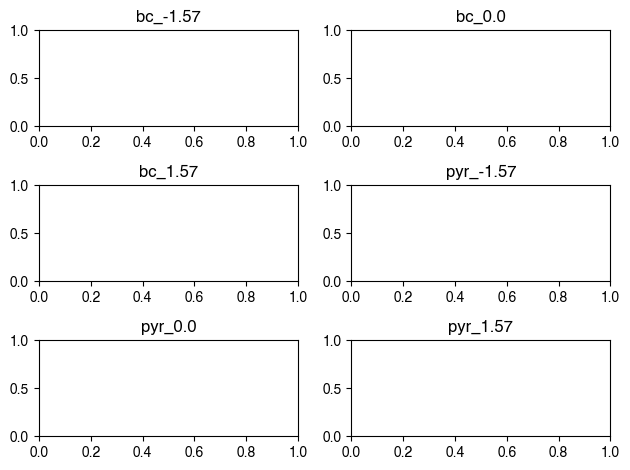

In [16]:

dfOI_str = 'vta_df'
if dfOI_str == 'vta_df':
    dfOI = vta_df
    columnsOI = ['surf_avg', 'EETsimidx', 'mua_eet', 'redus_eet', 'Gmax_eet', 'cell_eet',
                 'loc_eet', 'roll_eet', 'opsinlocations', 'number', 'celltype', 'theta_0', 'level', 'dur']
    labels_eet = ['mua_eet',	'redus_eet',	'Gmax_eet',
                  'cell_eet', 'loc_eet', 'roll_eet']
else:
    dfOI = vta_df_nocellloc  # vta_df
    columnsOI = ['surf_avg', 'EETsimidx', 'mua_eet', 'redus_eet', 'Gmax_eet',
                 'roll_eet', 'opsinlocations', 'number', 'celltype', 'theta_0', 'level', 'dur']
    labels_eet = ['mua_eet',	'redus_eet',	'Gmax_eet',	'roll_eet']

EETs = {}
idx = -1
Nboot = 0

fig, axs = plt.subplots(3, 2, tight_layout=True)
for ctth, ax in zip(unique_values_columns_vta['ct_theta'], axs.ravel()):
    for dur in unique_values_columns_vta['dur']:
        for lvl in unique_values_columns_vta['level']:

            intm_df = dfOI.loc[selection_generator(
                dfOI, unique_values_columns_vta, dur=dur, level=lvl, ct_theta=ctth), columnsOI].copy()
            intm_df = intm_df.sort_values(by=['EETsimidx'])

            X = intm_df[labels_eet].values
            Y = intm_df['surf_avg'].values
            xmin = np.min(X, axis=0)
            xmax = np.max(X, axis=0)
            if Nboot > 1:
                mi, sigma, EE, relEE, mi_sd, sigma_sd, mi_lb, sigma_lb, mi_ub, sigma_ub, mi_all, sigma_all = EET_indices(
                    r, xmin, xmax, X, Y, design_type='radial', Nboot=1000)
            else:
                mi, sigma, EE, relEE = EET_indices(
                    r, xmin, xmax, X, Y, design_type='radial', Nboot=0)

            order_mean = get_importance(mi)
            order_std = get_importance(sigma)

            for i, label in enumerate(labels_eet):
                idx += 1
                if Nboot > 1:
                    EETs[idx] = dict(mi=mi[i], sigma=sigma[i], EE=EE[:, i], relEE=relEE[:, i], mi_sd=mi_sd[i], sigma_sd=sigma_sd[i], mi_lb=mi_lb[i], sigma_lb=sigma_lb[i], mi_ub=mi_ub[i], sigma_ub=sigma_ub[i], mi_all=mi_all[i],
                                     sigma_all=sigma_all[i], order_mean=order_mean[i], order_std=order_std[i], label=label, dur=dur, level=lvl, celltype=intm_df['celltype'].iloc[0], theta_0=intm_df['theta_0'].iloc[0], number=intm_df['number'].iloc[0])
                else:
                    EETs[idx] = dict(mi=mi[i], sigma=sigma[i], EE=EE[:, i], relEE=relEE[:, i], order_mean=order_mean[i], order_std=order_std[i], label=label,
                                     dur=dur, level=lvl, celltype=intm_df['celltype'].iloc[0], theta_0=intm_df['theta_0'].iloc[0], number=intm_df['number'].iloc[0])
    if Nboot > 1:
        EET_plot(mi, sigma, labels_eet, mi_lb, mi_ub,
                 sigma_lb, sigma_ub, ax=ax, clrs=EET_pallete)
    ax.set_title(ctth)
EET_surfavgdf = pd.DataFrame(EETs).T
EET_surfavgdf = EET_surfavgdf.astype({'mi': 'float', 'sigma': 'float', 'order_mean': 'float',
                                     'order_std': 'float', 'label': 'str', 'dur': 'float', 'level': 'float'})
EET_surfavgdf['mi_log10'] = np.log10(EET_surfavgdf['mi'])
EET_surfavgdf['std_log10'] = np.log10(EET_surfavgdf['sigma'])
EET_surfavgdf[['mi_log10', 'std_log10']] = EET_surfavgdf[[
    'mi_log10', 'std_log10']].replace(-np.inf, np.nan)
print(EET_surfavgdf.describe())
EET_surfavgdf

### Pivot Tables

In [17]:
columns = ['mi', 'EE', 'relEE', 'label', 'dur', 'level', 'theta_0', 'celltype']
intm_df = EET_surfavgdf.loc[(EET_surfavgdf['label'] == 'mua_eet') | (
    EET_surfavgdf['label'] == 'redus_eet'), columns].copy()
intm_df['mirelEE'] = intm_df['relEE'].apply(np.nanmean)
table = pd.pivot_table(intm_df, index=['label'], values=[
                       'mirelEE', 'mi'], aggfunc=[np.mean, np.median, np.min, np.max])
table.T

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\apply.py:1137: RuntimeWarning: Mean of empty slice
  mapped = lib.map_infer(


label            mua_eet  redus_eet
mean   mi       0.202117   0.271620
       mirelEE  0.116464        NaN
median mi       0.041999   0.137589
       mirelEE  0.104975   0.310475
amin   mi       0.000000   0.000000
       mirelEE  0.000000   0.000000
amax   mi       1.192221   1.713901
       mirelEE  1.077785        inf

In [18]:
table = EET_surfavgdf.pivot_table(['mi', 'sigma'], index=['label'], aggfunc=[
                                  'mean', 'median', 'max', 'min', 'std'])
table

mean              median                 max            min  \
                 mi     sigma        mi     sigma        mi     sigma   mi   
label                                                                        
Gmax_eet   0.416170  0.291443  0.250746  0.223887  1.625935  1.587375  0.0   
cell_eet   0.341630  0.201216  0.175313  0.128148  1.557187  1.247576  0.0   
loc_eet    1.333830  0.850133  0.617461  0.415335  7.335625  4.317845  0.0   
mua_eet    0.202117  0.218178  0.041999  0.106926  1.192221  1.757353  0.0   
redus_eet  0.271620  0.287669  0.137589  0.217724  1.713901  2.349328  0.0   
roll_eet   0.108543  0.201768  0.069706  0.146631  0.501118  0.769803  0.0   

                      std            
          sigma        mi     sigma  
label                                
Gmax_eet    0.0  0.425926  0.305533  
cell_eet    0.0  0.376635  0.236706  
loc_eet     0.0  1.679498  1.001609  
mua_eet     0.0  0.295773  0.277149  
redus_eet   0.0  0.337738  0.326013  
roll_eet    0.0  0.118703  0.195962

## Ordered EET
Multiple visualization strategies

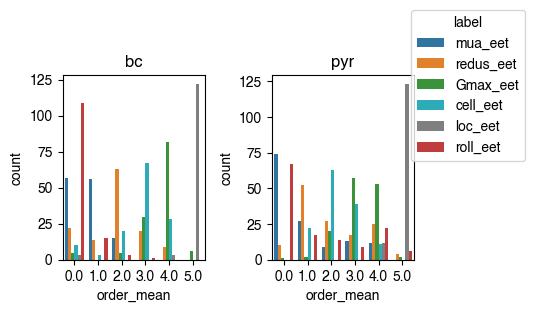

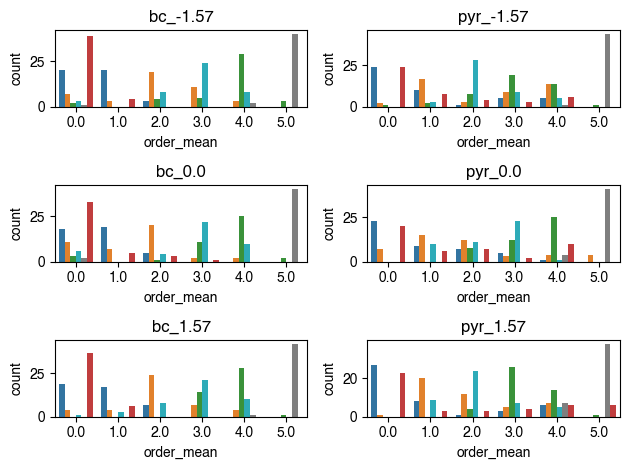

In [19]:
EET_surfavgdf['ct_theta'] = EET_surfavgdf.apply(
    lambda row: f"{row['celltype']}_{row['theta_0']}", axis=1)
EET_surfavgdf['help_val'] = np.ones(len(EET_surfavgdf))
fig, axs = plt.subplots(1, 2, figsize=(6, 3))
for celltype, ax in zip(np.sort(unique_values_columns_vta['celltype']), axs.ravel()):
    idx = EET_surfavgdf['celltype'] == celltype
    sns.countplot(EET_surfavgdf[idx], x='order_mean',
                  hue='label', palette=EET_pallete, ax=ax)
    ax.set_title(celltype)
for ax in axs.ravel()[:-1]:
    ax.get_legend().remove()
lgnd = axs[-1].get_legend()
lgnd.set_bbox_to_anchor((0.93, 0.5))


fig.tight_layout(rect=[0, 0, 0.9, 1])

fig, axs = plt.subplots(3, 2, tight_layout=True)
for ctth, ax in zip(np.sort(unique_values_columns_vta['ct_theta']), axs.T.ravel()):
    idx = EET_surfavgdf['ct_theta'] == ctth
    sns.countplot(EET_surfavgdf[idx], x='order_mean',
                  hue='label', palette=EET_pallete, ax=ax)
    ax.set_title(ctth)
for ax in axs.ravel():
    ax.get_legend().remove()

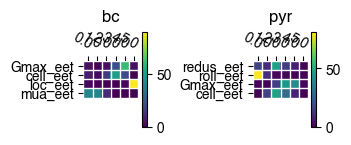

In [20]:
table = EET_surfavgdf.pivot_table('help_val', index=['celltype', 'label'], columns=[
                                  'order_mean'], aggfunc=lambda x: np.round(np.sum(x)/(45*3)*100))
data = table.values
data[np.isnan(data)] = 0
row_labels = [f"{y}" for x, y in table.index.values]
titles = pd.unique([x for x, y in table.index.values])
column_labels = list(table.columns)
fig, axs = plt.subplots(1, 2, figsize=(9/2.54, 4/2.54))
axs = np.array([axs])
for i, axrow in enumerate(axs):
    i0 = i*4
    i1 = (i+1)*4
    i0pr = i*4+4
    i1pr = (i+1)*4+4
    heatmap(data=data[i0:i1, :], row_labels=row_labels[i0:i1],
            col_labels=column_labels, ax=axrow[0])
    heatmap(data=data[i0pr:i1pr, :], row_labels=row_labels[i0pr:i1pr],
            col_labels=column_labels, ax=axrow[1])
    axrow[0].set_title(titles[0])
    axrow[1].set_title(titles[1])
fig.tight_layout()

## CNS2023 Figure

[152.  64.  79.  88.  nan  nan]
[71. 53. 77. 87. 91. nan]
[55. 43. 30. nan nan nan]
[13. nan nan nan 84. 94.]
[11.  2. 19. 72. 82. nan]
[ 4. nan  4. 22. 61.  4.]


order_mean           0.0   1.0   2.0   3.0   4.0   5.0
celltype label                                        
bc       Gmax_eet    4.0   NaN   4.0  22.0  61.0   4.0
         cell_eet    7.0   2.0  15.0  50.0  21.0   NaN
         loc_eet     2.0   NaN   NaN   NaN   2.0  90.0
         mua_eet    42.0  41.0  11.0   NaN   NaN   NaN
         redus_eet  16.0  10.0  47.0  15.0   7.0   NaN
         roll_eet   81.0  11.0   2.0   1.0   NaN   NaN
pyr      Gmax_eet    1.0   1.0  15.0  42.0  39.0   1.0
         cell_eet    NaN  16.0  47.0  29.0   8.0   NaN
         loc_eet     NaN   NaN   NaN   NaN   9.0  91.0
         mua_eet    55.0  20.0   7.0  10.0   9.0   NaN
         redus_eet   7.0  39.0  20.0  13.0  19.0   3.0
         roll_eet   50.0  13.0  10.0   7.0  16.0   4.0

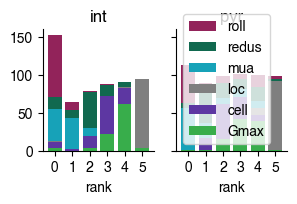

In [21]:

table = EET_surfavgdf.pivot_table('help_val', index=['celltype', 'label'], columns=[
                                  'order_mean'], aggfunc=lambda x: np.round(np.sum(x)/(45*3)*100))
# stacked bar
tablebc = table.T['bc'].T
tablepyr = table.T['pyr'].T
databc = tablebc.cumsum()
datapyr = tablepyr.cumsum()

bclabels = databc.index
pyrlabels = datapyr.index
fig, axs = plt.subplots(1, 2, sharey=True, figsize=(8/2.54, 4/2.54))
for vals, label in zip(databc.values[-1::-1, :], bclabels[-1::-1]):
    print(vals)
    axs[0].bar(np.arange(6), vals, color=EET_pallete_paper[label])
axs[0].set_title('int')
for vals, label in zip(datapyr.values[-1::-1, :], pyrlabels[-1::-1]):
    legendlabel = label.split('_', 1)[0]
    axs[1].bar(np.arange(6), vals,
               color=EET_pallete_paper[label], label=legendlabel)
axs[1].set_title('pyr')
for ax in axs:
    ax.spines[['top', 'right']].set_visible(False)
axs[-1].legend()
axs[0].set_xticks([0, 1, 2, 3, 4, 5])
axs[1].set_xticks([0, 1, 2, 3, 4, 5])
axs[0].set_xlabel('rank')
axs[-1].set_xlabel('rank')
fig.savefig('EET_CNS2023.svg', dpi=300)
table

## Paper plot

### u* measure

order_mean            0.0   1.0   2.0   3.0   4.0   5.0
ct_theta  label                                        
bc_-1.57  Gmax_eet    4.0   NaN   9.0  11.0  64.0   7.0
          cell_eet    7.0   NaN  18.0  53.0  18.0   NaN
          loc_eet     2.0   NaN   NaN   NaN   4.0  89.0
          mua_eet    44.0  44.0   7.0   NaN   NaN   NaN
          redus_eet  16.0   7.0  42.0  24.0   7.0   NaN
          roll_eet   87.0   9.0   NaN   NaN   NaN   NaN
bc_0.0    Gmax_eet    7.0   NaN   2.0  24.0  56.0   4.0
          cell_eet   13.0   NaN   9.0  49.0  22.0   NaN
          loc_eet     4.0   NaN   NaN   NaN   NaN  89.0
          mua_eet    40.0  42.0  11.0   NaN   NaN   NaN
          redus_eet  24.0  16.0  44.0   4.0   4.0   NaN
          roll_eet   73.0  11.0   7.0   2.0   NaN   NaN
bc_1.57   Gmax_eet    NaN   NaN   NaN  31.0  62.0   2.0
          cell_eet    2.0   7.0  18.0  47.0  22.0   NaN
          loc_eet     NaN   NaN   NaN   NaN   2.0  93.0
          mua_eet    42.0  38.0  16.0   NaN   NaN   NaN
          redus_eet   9.0   9.0  53.0  16.0   9.0   NaN
          roll_eet   82.0  13.0   NaN   NaN   NaN   NaN
pyr_-1.57 Gmax_eet    2.0   4.0  18.0  42.0  31.0   2.0
          cell_eet    NaN   7.0  62.0  20.0  11.0   NaN
          loc_eet     NaN   NaN   NaN   NaN   2.0  98.0
          mua_eet    53.0  22.0   2.0  11.0  11.0   NaN
          redus_eet   4.0  38.0   7.0  20.0  31.0   NaN
          roll_eet   53.0  18.0   9.0   7.0  13.0   NaN
pyr_0.0   Gmax_eet    NaN   NaN  18.0  27.0  56.0   NaN
          cell_eet    NaN  22.0  24.0  51.0   2.0   NaN
          loc_eet     NaN   NaN   NaN   NaN   9.0  91.0
          mua_eet    51.0  20.0  16.0  11.0   2.0   NaN
          redus_eet  16.0  33.0  27.0   7.0   9.0   9.0
          roll_eet   44.0  13.0  16.0   4.0  22.0   NaN
pyr_1.57  Gmax_eet    NaN   NaN   9.0  58.0  31.0   2.0
          cell_eet    NaN  20.0  53.0  16.0  11.0   NaN
          loc_eet     NaN   NaN   NaN   NaN  16.0  84.0
          mua_eet    60.0  18.0   2.0   7.0  13.0   NaN
          redus_eet   2.0  44.0  27.0  11.0  16.0   NaN
          roll_eet   51.0   7.0   7.0   9.0  13.0  13.0

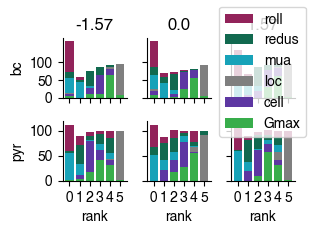

In [22]:

table = EET_surfavgdf.pivot_table('help_val', index=['ct_theta', 'label'], columns=[
                                  'order_mean'], aggfunc=lambda x: np.round(np.sum(x)/(45)*100))
idx = table.index.names == 'theta_0'
titles = pd.unique([x[idx] for x in table.index.values])
fig, axs = plt.subplots(2, 3, sharey='row', sharex=True,
                        figsize=(8/2.54, 6/2.54), tight_layout=True)
for i, (title, ax) in enumerate(zip(titles, axs.ravel())):
    table_intm = table.T[title].T
    data_intm = table_intm.cumsum()
    labels = databc.index.values
    for vals, label in zip(data_intm.values[-1::-1, :], labels[-1::-1]):
        if i == 0:
            legendlabel = label.split('_', 1)[0]
            ax.bar(np.arange(6), vals,
                   color=EET_pallete_paper[label], label=legendlabel)
        else:
            ax.bar(np.arange(6), vals, color=EET_pallete_paper[label])

    ax.spines[['top', 'right']].set_visible(False)
    ax.set_yticks([0, 50, 100])
    ax.set_xticks([0, 1, 2, 3, 4, 5])
    if i > 2:
        ax.set_xlabel('rank')
    if i < 3:
        ax.set_title(title.split('_')[-1])
    if i in [0, 3]:
        ax.set_ylabel(title.split('_')[0])
fig.legend()
fig.savefig('EET_rank.svg', dpi=300)
table

### three trajectories

,mi,sigma,order_mean,order_std,label,setnr
1470,0.000000,0.000000,0.0,0.0,mua_eet,1
1471,0.095588,0.121675,1.0,2.0,redus_eet,1
1472,0.158512,0.216962,3.0,4.0,Gmax_eet,1
1473,0.099687,0.108213,2.0,1.0,cell_eet,1
1474,0.199375,0.157751,4.0,3.0,loc_eet,1
1475,0.245896,0.422056,5.0,5.0,roll_eet,1
1236,0.386218,0.565645,2.0,2.0,mua_eet,2
1237,1.179093,1.161118,5.0,5.0,redus_eet,2
1238,0.495253,0.665127,3.0,3.0,Gmax_eet,2
1239,0.350625,0.257881,1.0,0.0,cell_eet,2


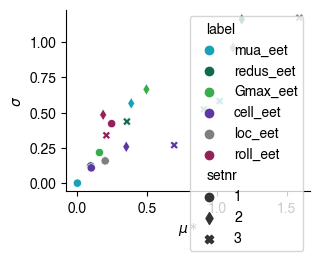

In [23]:
idx1 = (EET_surfavgdf['ct_theta'] == 'pyr_1.57') & (
    EET_surfavgdf['dur'] == 10) & (EET_surfavgdf['level'] == 1)
set1 = EET_surfavgdf.loc[idx1, [
    'mi', 'sigma', 'order_mean', 'order_std', 'label']]
set1['setnr'] = 1
idx2 = (EET_surfavgdf['ct_theta'] == 'pyr_0.0') & (
    EET_surfavgdf['dur'] == 10) & (EET_surfavgdf['level'] == 1000)
set2 = EET_surfavgdf.loc[idx2, [
    'mi', 'sigma', 'order_mean', 'order_std', 'label']]
set2['setnr'] = 2
idx3 = (EET_surfavgdf['ct_theta'] == 'pyr_-1.57') & (EET_surfavgdf['dur']
                                                     == 10) & (EET_surfavgdf['level'] == 1000)
set3 = EET_surfavgdf.loc[idx3, [
    'mi', 'sigma', 'order_mean', 'order_std', 'label']]
set3['setnr'] = 3
intm_df = pd.concat([set1, set2, set3])
fig, ax = plt.subplots(1, 1, figsize=[8/2.54, 6/2.54])
sns.scatterplot(intm_df, x='mi', y='sigma', hue='label',
                palette=EET_pallete_paper, style='setnr', markers=['o', 'd', 'X'], ax=ax)
ax.set_ylabel('$\sigma$')
ax.set_xlabel('$\mu*$')
ax.spines[['top', 'right']].set_visible(False)
fig.savefig('eet_plot_3cases.svg', dpi=300)
intm_df

### std measure

order_std             0.0   1.0   2.0   3.0   4.0   5.0
ct_theta  label                                        
bc_-1.57  Gmax_eet    7.0   NaN   7.0  29.0  47.0   7.0
          cell_eet   18.0  29.0  16.0  31.0   2.0   NaN
          loc_eet     2.0   NaN   NaN   NaN   4.0  89.0
          mua_eet    44.0   7.0  24.0  16.0   4.0   NaN
          redus_eet  16.0  13.0  22.0  11.0  33.0   NaN
          roll_eet   73.0  11.0   7.0   2.0   2.0   NaN
bc_0.0    Gmax_eet    7.0   NaN   2.0  11.0  69.0   4.0
          cell_eet   13.0   9.0  31.0  38.0   2.0   NaN
          loc_eet     4.0   NaN   NaN   NaN   NaN  89.0
          mua_eet    47.0  27.0  13.0   4.0   2.0   NaN
          redus_eet  22.0  24.0  18.0  22.0   7.0   NaN
          roll_eet   69.0   9.0   9.0   4.0   2.0   NaN
bc_1.57   Gmax_eet    NaN   2.0   4.0  24.0  60.0   4.0
          cell_eet    4.0  20.0  38.0  29.0   4.0   NaN
          loc_eet     NaN   NaN   NaN   2.0   2.0  91.0
          mua_eet    49.0  18.0  24.0   2.0   2.0   NaN
          redus_eet  22.0  13.0  13.0  24.0  22.0   NaN
          roll_eet   60.0  13.0   7.0  11.0   4.0   NaN
pyr_-1.57 Gmax_eet   18.0  20.0  20.0  29.0  11.0   2.0
          cell_eet   22.0  27.0  29.0  16.0   7.0   NaN
          loc_eet     NaN   NaN   2.0   7.0  13.0  78.0
          mua_eet    49.0  11.0  16.0  11.0  13.0   NaN
          redus_eet   9.0  22.0   9.0   9.0  36.0  16.0
          roll_eet   16.0   9.0  22.0  29.0  20.0   4.0
pyr_0.0   Gmax_eet    NaN  11.0  31.0  38.0  20.0   NaN
          cell_eet   40.0  31.0  29.0   NaN   NaN   NaN
          loc_eet     NaN   NaN   NaN  13.0  16.0  71.0
          mua_eet    47.0   9.0  20.0   7.0  16.0   2.0
          redus_eet  16.0  18.0  11.0  11.0  24.0  20.0
          roll_eet    9.0  20.0   9.0  31.0  24.0   7.0
pyr_1.57  Gmax_eet    4.0  13.0  36.0  29.0  16.0   2.0
          cell_eet   29.0  31.0  27.0  13.0   NaN   NaN
          loc_eet     NaN   NaN   NaN  20.0  24.0  56.0
          mua_eet    56.0  11.0   9.0  11.0  13.0   NaN
          redus_eet   4.0  24.0  16.0   9.0  40.0   7.0
          roll_eet   20.0   9.0  11.0  18.0   7.0  36.0

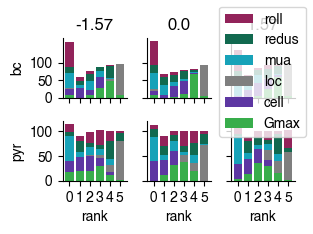

In [24]:
# std measure
table = EET_surfavgdf.pivot_table('help_val', index=['ct_theta', 'label'], columns=[
                                  'order_std'], aggfunc=lambda x: np.round(np.sum(x)/(45)*100))
idx = table.index.names == 'theta_0'
titles = pd.unique([x[idx] for x in table.index.values])
fig, axs = plt.subplots(2, 3, sharey='row', sharex=True,
                        figsize=(8/2.54, 6/2.54), tight_layout=True)
for i, (title, ax) in enumerate(zip(titles, axs.ravel())):
    table_intm = table.T[title].T
    data_intm = table_intm.cumsum()
    labels = databc.index.values
    for vals, label in zip(data_intm.values[-1::-1, :], labels[-1::-1]):
        if i == 0:
            legendlabel = label.split('_', 1)[0]
            ax.bar(np.arange(6), vals,
                   color=EET_pallete_paper[label], label=legendlabel)
        else:
            ax.bar(np.arange(6), vals, color=EET_pallete_paper[label])

    ax.spines[['top', 'right']].set_visible(False)
    ax.set_yticks([0, 50, 100])
    ax.set_xticks([0, 1, 2, 3, 4, 5])
    if i > 2:
        ax.set_xlabel('rank')
    if i < 3:
        ax.set_title(title.split('_')[-1])
    if i in [0, 3]:
        ax.set_ylabel(title.split('_')[0])
fig.legend()
table

## Alternative plots

order_mean            0.0   1.0   2.0   3.0   4.0   5.0
ct_theta  label                                        
bc_-1.57  Gmax_eet    4.0   0.0   9.0  11.0  64.0   7.0
          cell_eet    7.0   0.0  18.0  53.0  18.0   0.0
          loc_eet     2.0   0.0   0.0   0.0   4.0  89.0
          mua_eet    44.0  44.0   7.0   0.0   0.0   0.0
          redus_eet  16.0   7.0  42.0  24.0   7.0   0.0
          roll_eet   87.0   9.0   0.0   0.0   0.0   0.0
bc_0.0    Gmax_eet    7.0   0.0   2.0  24.0  56.0   4.0
          cell_eet   13.0   0.0   9.0  49.0  22.0   0.0
          loc_eet     4.0   0.0   0.0   0.0   0.0  89.0
          mua_eet    40.0  42.0  11.0   0.0   0.0   0.0
          redus_eet  24.0  16.0  44.0   4.0   4.0   0.0
          roll_eet   73.0  11.0   7.0   2.0   0.0   0.0
bc_1.57   Gmax_eet    0.0   0.0   0.0  31.0  62.0   2.0
          cell_eet    2.0   7.0  18.0  47.0  22.0   0.0
          loc_eet     0.0   0.0   0.0   0.0   2.0  93.0
          mua_eet    42.0  38.0  16.0   0.0   0.0   0.0
          redus_eet   9.0   9.0  53.0  16.0   9.0   0.0
          roll_eet   82.0  13.0   0.0   0.0   0.0   0.0
pyr_-1.57 Gmax_eet    2.0   4.0  18.0  42.0  31.0   2.0
          cell_eet    0.0   7.0  62.0  20.0  11.0   0.0
          loc_eet     0.0   0.0   0.0   0.0   2.0  98.0
          mua_eet    53.0  22.0   2.0  11.0  11.0   0.0
          redus_eet   4.0  38.0   7.0  20.0  31.0   0.0
          roll_eet   53.0  18.0   9.0   7.0  13.0   0.0
pyr_0.0   Gmax_eet    0.0   0.0  18.0  27.0  56.0   0.0
          cell_eet    0.0  22.0  24.0  51.0   2.0   0.0
          loc_eet     0.0   0.0   0.0   0.0   9.0  91.0
          mua_eet    51.0  20.0  16.0  11.0   2.0   0.0
          redus_eet  16.0  33.0  27.0   7.0   9.0   9.0
          roll_eet   44.0  13.0  16.0   4.0  22.0   0.0
pyr_1.57  Gmax_eet    0.0   0.0   9.0  58.0  31.0   2.0
          cell_eet    0.0  20.0  53.0  16.0  11.0   0.0
          loc_eet     0.0   0.0   0.0   0.0  16.0  84.0
          mua_eet    60.0  18.0   2.0   7.0  13.0   0.0
          redus_eet   2.0  44.0  27.0  11.0  16.0   0.0
          roll_eet   51.0   7.0   7.0   9.0  13.0  13.0

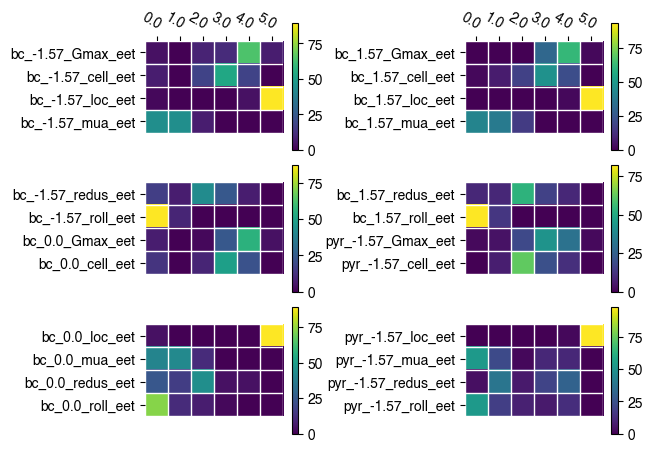

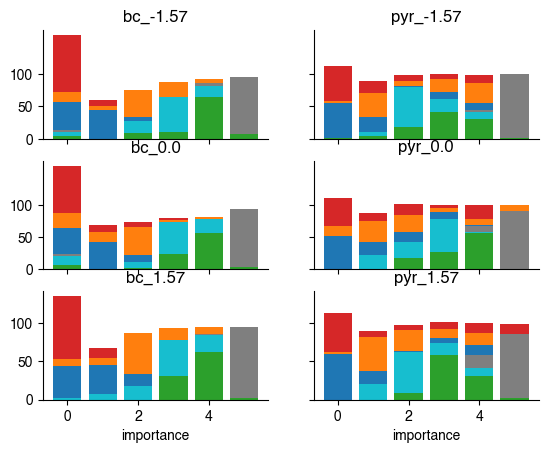

In [25]:


table = EET_surfavgdf.pivot_table('help_val', index=['ct_theta', 'label'], columns=[
                                  'order_mean'], aggfunc=lambda x: np.round(np.sum(x)/45*100))
data = table.values
data[np.isnan(data)] = 0
row_labels = [f"{x}_{y}" for x, y in table.index.values]
column_labels = list(table.columns)
fig, axs = plt.subplots(3, 2)
for i, axrow in enumerate(axs):
    i0 = i*4
    i1 = (i+1)*4
    i0pr = i*4+12
    i1pr = (i+1)*4+12
    heatmap(data=data[i0:i1, :], row_labels=row_labels[i0:i1],
            col_labels=column_labels, ax=axrow[0])
    heatmap(data=data[i0pr:i1pr, :], row_labels=row_labels[i0pr:i1pr],
            col_labels=column_labels, ax=axrow[1])
table
for ax in axs.ravel()[2:]:
    ax.set_xticks([])
fig.tight_layout(h_pad=0.5, w_pad=2)


idx = table.index.names == 'ct_theta'
titles = pd.unique([x[idx] for x in table.index.values])
fig, axs = plt.subplots(3, 2, sharey='row', sharex=True)
for i, (title, ax) in enumerate(zip(titles, axs.T.ravel())):
    table_intm = table.T[title].T
    data_intm = table_intm.cumsum()
    labels = databc.index.values
    for vals, label in zip(data_intm.values[-1::-1, :], labels[-1::-1]):

        ax.bar(np.arange(6), vals, color=EET_pallete[label])
    ax.set_title(title)
    ax.spines[['top', 'right']].set_visible(False)
    ax.set_yticks([0, 50, 100])
axs[-1, 0].set_xlabel('importance')
axs[-1, -1].set_xlabel('importance')
table

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


Text(0.5, 215.55714129483817, '')

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 6.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


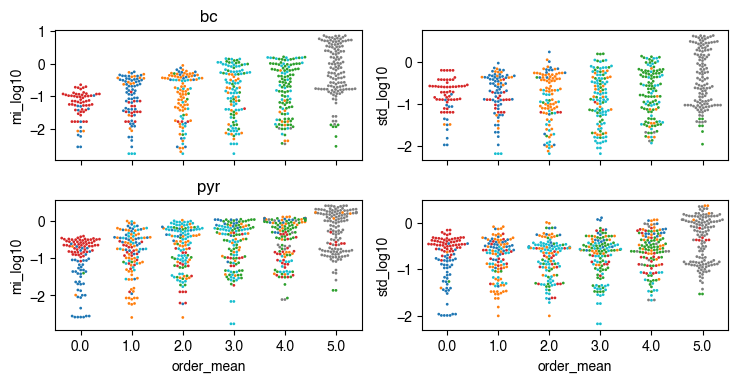

In [26]:
w = 2
# When it is important what is it contribution
fig, axs = plt.subplots(2, 2, tight_layout=True,
                        figsize=(19/2.54, 10/2.54), sharex=True)
for ctth, axrow in zip(np.sort(unique_values_columns_vta['celltype']), axs):
    idx = EET_surfavgdf['celltype'] == ctth
    sns.swarmplot(data=EET_surfavgdf[idx], x='order_mean', y='mi_log10',
                  hue='label', ax=axrow[0], size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_surfavgdf[idx], x='order_mean', y='std_log10',
                  hue='label', ax=axrow[1], size=w, palette=EET_pallete)
    axrow[0].set_title(ctth)
    axrow[0].set_xlim([-0.5, 5.5])
    axrow[1].set_xlim([-0.5, 5.5])
try:
    for ax in axs.ravel():
        ax.get_legend().remove()
except:
    pass
axs[0, 0].set_xlabel(None)
axs[0, 1].set_xlabel(None)

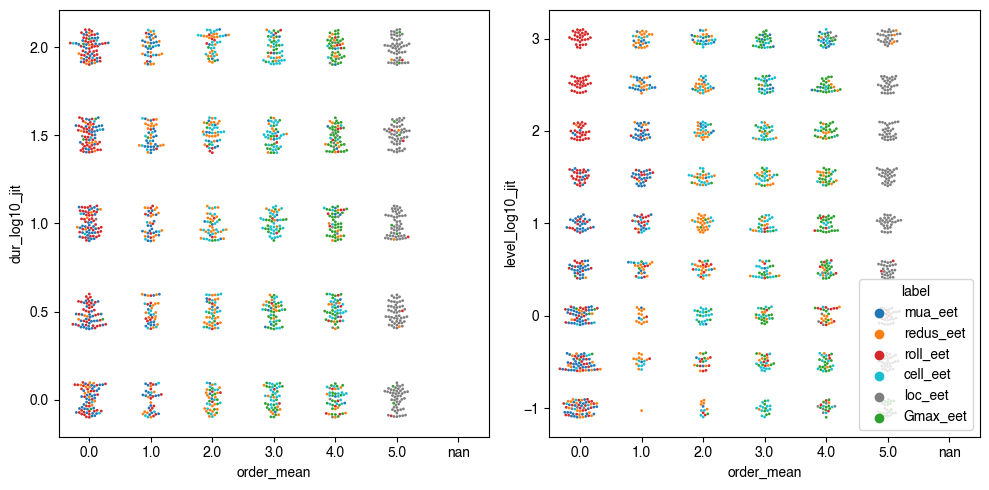

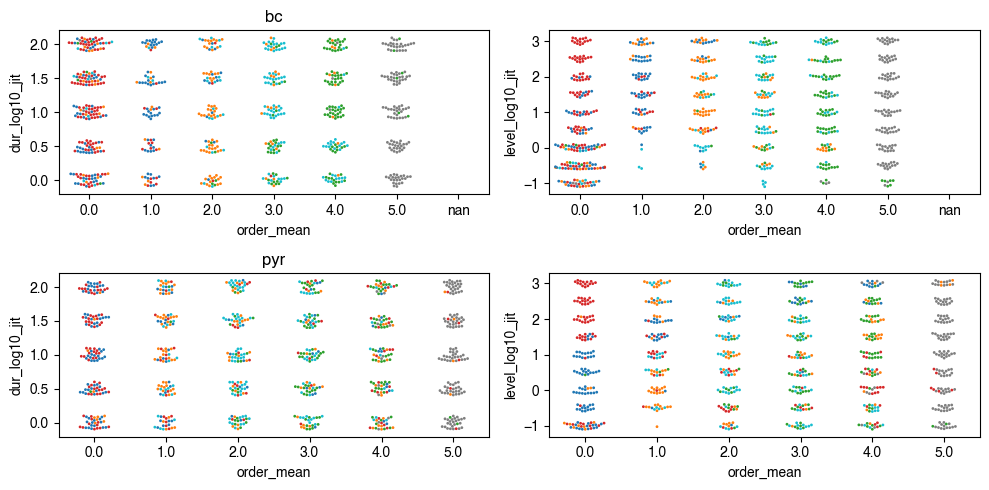

In [27]:
EET_surfavgdf['dur_log10'] = np.log10(EET_surfavgdf['dur'])
EET_surfavgdf['level_log10'] = np.log10(EET_surfavgdf['level'])
w = 2
EET_surfavgdf['dur_log10_jit'] = EET_surfavgdf['dur_log10'] + \
    (np.random.rand(len(EET_surfavgdf['dur_log10']))-0.5)*0.2
EET_surfavgdf['level_log10_jit'] = EET_surfavgdf['level_log10'] + \
    (np.random.rand(len(EET_surfavgdf['level_log10']))-0.5)*0.2
fig, axs = plt.subplots(1, 2, tight_layout=True, figsize=(10, 5))
axs = np.array([axs])
for ctth, axrow in zip(np.sort(unique_values_columns_vta['ct_theta']), axs):
    sns.swarmplot(data=EET_surfavgdf, x='order_mean', y='dur_log10_jit',
                  hue='label', ax=axrow[0], size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_surfavgdf, x='order_mean', y='level_log10_jit',
                  hue='label', ax=axrow[1], size=w, palette=EET_pallete)
try:
    for ax in axs.ravel()[:-1]:
        ax.get_legend().remove()
except:
    pass

w = 2
fig, axs = plt.subplots(2, 2, tight_layout=True, figsize=(10, 5))
for ctth, axrow in zip(np.sort(unique_values_columns_vta['celltype']), axs):
    idx = EET_surfavgdf['celltype'] == ctth
    sns.swarmplot(data=EET_surfavgdf[idx], x='order_mean', y='dur_log10_jit',
                  hue='label', ax=axrow[0], size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_surfavgdf[idx], x='order_mean', y='level_log10_jit',
                  hue='label', ax=axrow[1], size=w, palette=EET_pallete)
    axrow[0].set_title(ctth)
try:
    for ax in axs.ravel():
        ax.get_legend().remove()
except:
    pass

# EET _bestpos

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,mi,sigma,order_mean,order_std,label,dur,level,celltype,theta_0,number,mi_log10,std_log10
0,0.000000,0.000000,NaN,NaN,mua_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
1,0.000000,0.000000,NaN,NaN,redus_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
2,0.000000,0.000000,NaN,NaN,Gmax_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
3,0.000000,0.000000,NaN,NaN,cell_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
4,0.000000,0.000000,NaN,NaN,loc_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1615,1.550312,2.268477,5.0,5.0,redus_eet,100.0,1000.0,pyr,1.57,1,0.190419,0.355734
1616,0.798998,1.660674,3.0,3.0,Gmax_eet,100.0,1000.0,pyr,1.57,1,-0.097454,0.220284
1617,0.158125,0.236464,0.0,0.0,cell_eet,100.0,1000.0,pyr,1.57,1,-0.800999,-0.626235
1618,0.646250,0.734435,2.0,2.0,loc_eet,100.0,1000.0,pyr,1.57,1,-0.189599,-0.134046


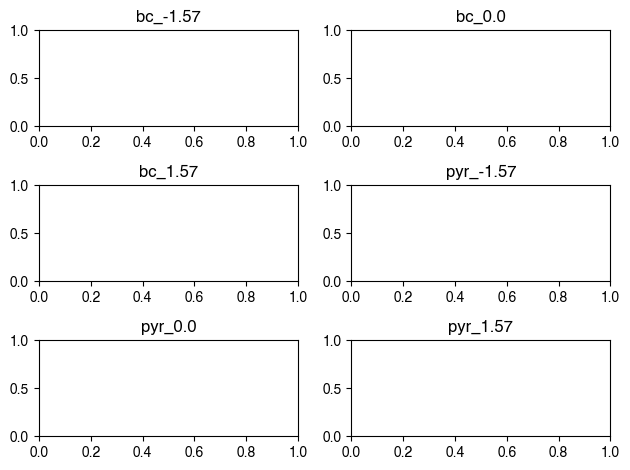

In [28]:
dfOI_str = 'vta_df'
if dfOI_str == 'vta_df':
    dfOI = vta_df
    columnsOI = ['b_opt_pos_TAC', 'EETsimidx', 'mua_eet', 'redus_eet', 'Gmax_eet', 'cell_eet',
                 'loc_eet', 'roll_eet', 'opsinlocations', 'number', 'celltype', 'theta_0', 'level', 'dur']
    labels_eet = ['mua_eet',	'redus_eet',	'Gmax_eet',
                  'cell_eet', 'loc_eet', 'roll_eet']
else:
    dfOI = vta_df_nocellloc  # vta_df
    columnsOI = ['b_opt_pos_TAC', 'EETsimidx', 'mua_eet', 'redus_eet', 'Gmax_eet',
                 'roll_eet', 'opsinlocations', 'number', 'celltype', 'theta_0', 'level', 'dur']
    labels_eet = ['mua_eet',	'redus_eet',	'Gmax_eet',	'roll_eet']

EETs = {}
idx = -1
Nboot = 0
fig, axs = plt.subplots(3, 2, tight_layout=True)
for ctth, ax in zip(unique_values_columns_vta['ct_theta'], axs.ravel()):
    for dur in unique_values_columns_vta['dur']:
        for lvl in unique_values_columns_vta['level']:

            intm_df = dfOI.loc[selection_generator(
                dfOI, unique_values_columns_vta, dur=dur, level=lvl, ct_theta=ctth), columnsOI].copy()
            intm_df = intm_df.sort_values(by=['EETsimidx'])

            X = intm_df[labels_eet].values
            Y = intm_df['b_opt_pos_TAC'].values
            Y[np.isnan(Y)] = -2
            xmin = np.min(X, axis=0)
            xmax = np.max(X, axis=0)
            if Nboot > 1:
                mi, sigma, EE, relEE, mi_sd, sigma_sd, mi_lb, sigma_lb, mi_ub, sigma_ub, mi_all, sigma_all = EET_indices(
                    r, xmin, xmax, X, Y, design_type='radial', Nboot=1000)
            else:
                mi, sigma, EE, relEE, = EET_indices(
                    r, xmin, xmax, X, Y, design_type='radial', Nboot=0)

            order_mean = get_importance(mi)
            order_std = get_importance(sigma)

            for i, label in enumerate(labels_eet):
                idx += 1
                if Nboot > 1:
                    EETs[idx] = dict(mi=mi[i], sigma=sigma[i], mi_sd=mi_sd[i], sigma_sd=sigma_sd[i], mi_lb=mi_lb[i], sigma_lb=sigma_lb[i], mi_ub=mi_ub[i], sigma_ub=sigma_ub[i], order_mean=order_mean[i],
                                     order_std=order_std[i], label=label, dur=dur, level=lvl, celltype=intm_df['celltype'].iloc[0], theta_0=intm_df['theta_0'].iloc[0], number=intm_df['number'].iloc[0])
                else:
                    EETs[idx] = dict(mi=mi[i], sigma=sigma[i], order_mean=order_mean[i], order_std=order_std[i], label=label, dur=dur,
                                     level=lvl, celltype=intm_df['celltype'].iloc[0], theta_0=intm_df['theta_0'].iloc[0], number=intm_df['number'].iloc[0])
    if Nboot > 1:
        EET_plot(mi, sigma, labels_eet, mi_lb, mi_ub,
                 sigma_lb, sigma_ub, ax=ax, clrs=EET_pallete)
    ax.set_title(ctth)
EET_bestposdf = pd.DataFrame(EETs).T
EET_bestposdf = EET_bestposdf.astype({'mi': 'float', 'sigma': 'float', 'order_mean': 'float',
                                     'order_std': 'float', 'label': 'str', 'dur': 'float', 'level': 'float'})
EET_bestposdf['mi_log10'] = np.log10(EET_bestposdf['mi'])
EET_bestposdf['std_log10'] = np.log10(EET_bestposdf['sigma'])
EET_bestposdf[['mi_log10', 'std_log10']] = EET_bestposdf[[
    'mi_log10', 'std_log10']].replace(-np.inf, np.nan)
EET_bestposdf

## Rank count

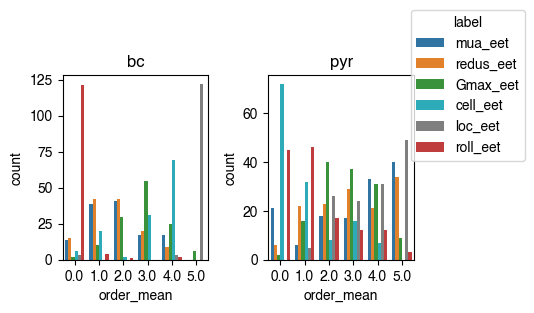

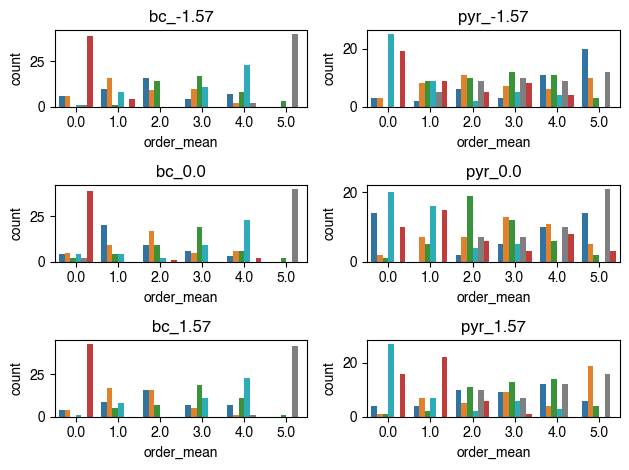

In [29]:
EET_bestposdf['ct_theta'] = EET_bestposdf.apply(
    lambda row: f"{row['celltype']}_{row['theta_0']}", axis=1)
EET_bestposdf['help_val'] = np.ones(len(EET_bestposdf))
fig, axs = plt.subplots(1, 2, figsize=(6, 3))
for celltype, ax in zip(np.sort(unique_values_columns_vta['celltype']), axs.ravel()):
    idx = EET_bestposdf['celltype'] == celltype
    sns.countplot(EET_bestposdf[idx], x='order_mean',
                  hue='label', palette=EET_pallete, ax=ax)
    ax.set_title(celltype)
for ax in axs.ravel()[:-1]:
    ax.get_legend().remove()
lgnd = axs[-1].get_legend()
lgnd.set_bbox_to_anchor((0.93, 0.5))


fig.tight_layout(rect=[0, 0, 0.9, 1])

fig, axs = plt.subplots(3, 2, tight_layout=True)
for ctth, ax in zip(np.sort(unique_values_columns_vta['ct_theta']), axs.T.ravel()):
    idx = EET_bestposdf['ct_theta'] == ctth
    sns.countplot(EET_bestposdf[idx], x='order_mean',
                  hue='label', palette=EET_pallete, ax=ax)
    ax.set_title(ctth)
for ax in axs.ravel():
    ax.get_legend().remove()

## Paper plot

order_mean            0.0   1.0   2.0   3.0   4.0   5.0
ct_theta  label                                        
bc_-1.57  Gmax_eet    NaN   2.0  31.0  38.0  18.0   7.0
          cell_eet    2.0  18.0   NaN  24.0  51.0   NaN
          loc_eet     2.0   NaN   NaN   NaN   4.0  89.0
          mua_eet    13.0  22.0  36.0   9.0  16.0   NaN
          redus_eet  13.0  36.0  20.0  22.0   4.0   NaN
          roll_eet   87.0   9.0   NaN   NaN   NaN   NaN
bc_0.0    Gmax_eet    4.0   9.0  20.0  42.0  13.0   4.0
          cell_eet    9.0   9.0   4.0  20.0  51.0   NaN
          loc_eet     4.0   NaN   NaN   NaN   NaN  89.0
          mua_eet     9.0  44.0  20.0  13.0   7.0   NaN
          redus_eet  11.0  20.0  38.0  11.0  13.0   NaN
          roll_eet   87.0   NaN   2.0   NaN   4.0   NaN
bc_1.57   Gmax_eet    NaN  11.0  16.0  42.0  24.0   2.0
          cell_eet    2.0  18.0   NaN  24.0  51.0   NaN
          loc_eet     NaN   NaN   NaN   NaN   2.0  93.0
          mua_eet     9.0  20.0  36.0  16.0  16.0   NaN
          redus_eet   9.0  38.0  36.0  11.0   2.0   NaN
          roll_eet   96.0   NaN   NaN   NaN   NaN   NaN
pyr_-1.57 Gmax_eet    NaN  20.0  22.0  27.0  24.0   7.0
          cell_eet   56.0  20.0   4.0  11.0   9.0   NaN
          loc_eet     NaN  11.0  20.0  22.0  20.0  27.0
          mua_eet     7.0   4.0  13.0   7.0  24.0  44.0
          redus_eet   7.0  18.0  24.0  16.0  13.0  22.0
          roll_eet   42.0  20.0  11.0  18.0   9.0   NaN
pyr_0.0   Gmax_eet    2.0  11.0  42.0  27.0  13.0   4.0
          cell_eet   44.0  36.0   9.0  11.0   NaN   NaN
          loc_eet     NaN   NaN  16.0  16.0  22.0  47.0
          mua_eet    31.0   NaN   4.0  11.0  22.0  31.0
          redus_eet   4.0  16.0  16.0  29.0  24.0  11.0
          roll_eet   22.0  33.0  13.0   7.0  18.0   7.0
pyr_1.57  Gmax_eet    2.0   4.0  24.0  29.0  31.0   9.0
          cell_eet   60.0  16.0   4.0  13.0   7.0   NaN
          loc_eet     NaN   NaN  22.0  16.0  27.0  36.0
          mua_eet     9.0   9.0  22.0  20.0  27.0  13.0
          redus_eet   2.0  16.0  11.0  20.0   9.0  42.0
          roll_eet   36.0  49.0  13.0   2.0   NaN   NaN

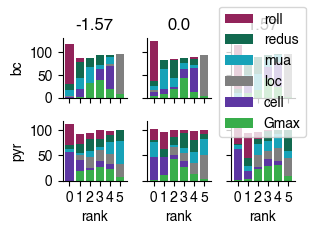

In [30]:

EET_pallete_plot = EET_pallete_paper
table = EET_bestposdf.pivot_table('help_val', index=['ct_theta', 'label'], columns=[
                                  'order_mean'], aggfunc=lambda x: np.round(np.sum(x)/(45)*100))
idx = table.index.names == 'theta_0'
titles = pd.unique([x[idx] for x in table.index.values])
fig, axs = plt.subplots(2, 3, sharey='row', sharex=True,
                        figsize=(8/2.54, 6/2.54), tight_layout=True)
for i, (title, ax) in enumerate(zip(titles, axs.ravel())):
    table_intm = table.T[title].T
    data_intm = table_intm.cumsum()
    labels = data_intm.index.values
    for vals, label in zip(data_intm.values[-1::-1, :], labels[-1::-1]):
        if i == 0:
            legendlabel = label.split('_', 1)[0]
            ax.bar(np.arange(6), vals,
                   color=EET_pallete_plot[label], label=legendlabel)
        else:
            ax.bar(np.arange(6), vals, color=EET_pallete_plot[label])

    ax.spines[['top', 'right']].set_visible(False)
    ax.set_yticks([0, 50, 100])
    ax.set_xticks([0, 1, 2, 3, 4, 5])
    if i > 2:
        ax.set_xlabel('rank')
    if i < 3:
        ax.set_title(title.split('_')[-1])
    if i in [0, 3]:
        ax.set_ylabel(title.split('_')[0])
fig.legend()
fig.savefig('EET_bestposrank.svg', dpi=300)
table

### allsec only

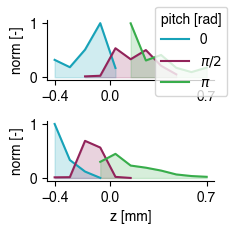

In [31]:
lgdmap = {1.57: '$\pi$', -1.57: '$\pi/2$', 0.0: '0'}
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['bc', 'pyr']
vta_df['helper_val'] = 1
clrs = [EET_pallete_paper['mua_eet'],
        EET_pallete_paper['roll_eet'], EET_pallete_paper['Gmax_eet']]
fig, axs = plt.subplots(2, 1, tight_layout=True, figsize=(6/2.54, 6/2.54))
idx_allsec = vta_df['opsinlocations'] == 'allsec'
for i, (r, ax) in enumerate(zip(row_strs, axs.ravel())):
    # idx = (((vta_df['idx_incluster_eet']==0)) | (vta_df['idx_incluster_eet']==i+1))
    idx = vta_df['celltype'] == r
    data_viz = vta_df[idx & idx_allsec].copy()
    data_viz = data_viz.groupby(['theta_0', 'b_opt_pos_TAC'], as_index=False)[
        'helper_val'].sum()
    mymax = data_viz['helper_val'].max()
    for th, clr in zip(unique_values_columns_vta['theta_0'], clrs):
        idx = data_viz['theta_0'] == th
        viz = data_viz[idx]
        ax.plot(viz['b_opt_pos_TAC'], viz['helper_val']/mymax, color=clr)
        ax.fill_between(viz['b_opt_pos_TAC'],
                        viz['helper_val']/mymax, alpha=0.2, color=clr)
        ax.spines[['top', 'right']].set_visible(False)

        ax.set_xticks([-0.4, 0, 0.7])
    ax.set_ylabel('norm [-]')
ax.set_xlabel('z [mm]')
for th, clr, lgd in zip(unique_values_columns_vta['theta_0'], clrs, [0, '$\pi/2$', '$\pi$']):
    axs[0].plot(np.nan, np.nan, label=lgd, color=clr)
fig.legend(title='pitch [rad]')
fig.savefig('optimalposition_variance_allsec_eet.svg', dpi=300)

### pooled all

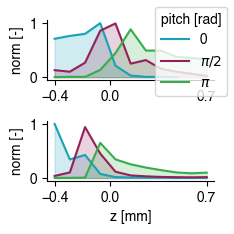

In [32]:
lgdmap = {1.57: '$\pi$', -1.57: '$\pi/2$', 0.0: '0'}
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['bc', 'pyr']
vta_df['helper_val'] = 1
clrs = [EET_pallete_paper['mua_eet'],
        EET_pallete_paper['roll_eet'], EET_pallete_paper['Gmax_eet']]
fig, axs = plt.subplots(2, 1, tight_layout=True, figsize=(6/2.54, 6/2.54))
for i, (r, ax) in enumerate(zip(row_strs, axs.ravel())):
    # idx = (((vta_df['idx_incluster_eet']==0)) | (vta_df['idx_incluster_eet']==i+1))
    idx = vta_df['celltype'] == r
    data_viz = vta_df[idx].copy()
    data_viz = data_viz.groupby(['theta_0', 'b_opt_pos_TAC'], as_index=False)[
        'helper_val'].sum()
    mymax = data_viz['helper_val'].max()
    for th, clr in zip(unique_values_columns_vta['theta_0'], clrs):
        idx = data_viz['theta_0'] == th
        viz = data_viz[idx]
        ax.plot(viz['b_opt_pos_TAC'], viz['helper_val']/mymax, color=clr)
        ax.fill_between(viz['b_opt_pos_TAC'],
                        viz['helper_val']/mymax, alpha=0.2, color=clr)
        ax.spines[['top', 'right']].set_visible(False)

        ax.set_xticks([-0.4, 0, 0.7])
    ax.set_ylabel('norm [-]')
ax.set_xlabel('z [mm]')
for th, clr, lgd in zip(unique_values_columns_vta['theta_0'], clrs, [0, '$\pi/2$', '$\pi$']):
    axs[0].plot(np.nan, np.nan, label=lgd, color=clr)
fig.legend(title='pitch [rad]')
fig.savefig('optimalposition_variance_eet.svg', dpi=300)

## Alternative plots

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 5.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


Text(0.5, 507.97320647419065, '')

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 6.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


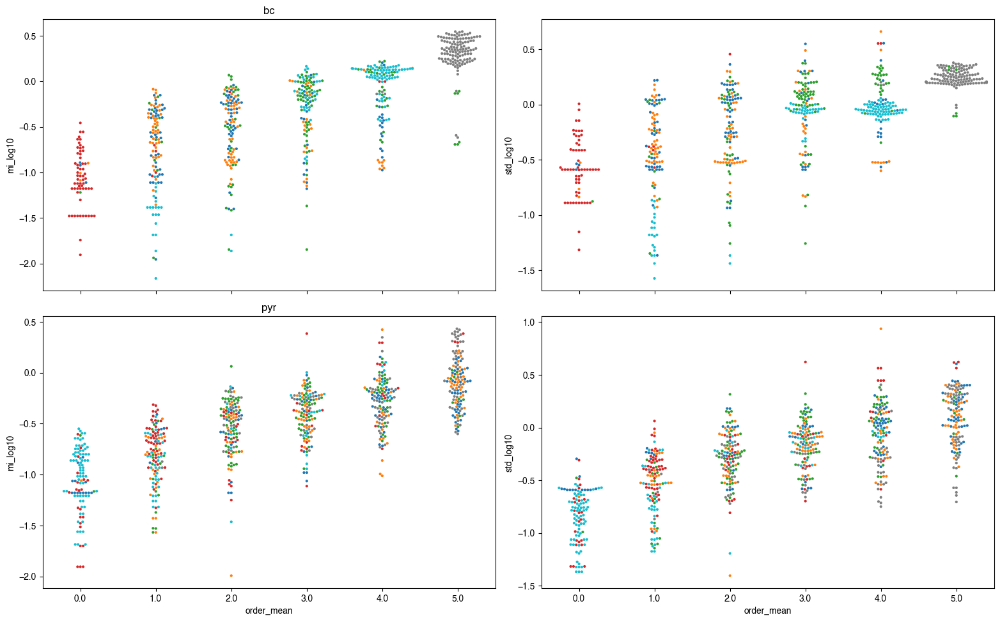

In [33]:

w = 3
# When it is important what is it contribution
fig, axs = plt.subplots(2, 2, tight_layout=True,
                        figsize=(40/2.54, 25/2.54), sharex=True)
for ctth, axrow in zip(np.sort(unique_values_columns_vta['celltype']), axs):
    idx = EET_bestposdf['celltype'] == ctth
    sns.swarmplot(data=EET_bestposdf[idx], x='order_mean', y='mi_log10',
                  hue='label', ax=axrow[0], size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_bestposdf[idx], x='order_mean', y='std_log10',
                  hue='label', ax=axrow[1], size=w, palette=EET_pallete)
    axrow[0].set_title(ctth)
    axrow[0].set_xlim([-0.5, 5.5])
    axrow[1].set_xlim([-0.5, 5.5])
try:
    for ax in axs.ravel():
        ax.get_legend().remove()
except:
    pass
axs[0, 0].set_xlabel(None)
axs[0, 1].set_xlabel(None)

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 10.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 9.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 9.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


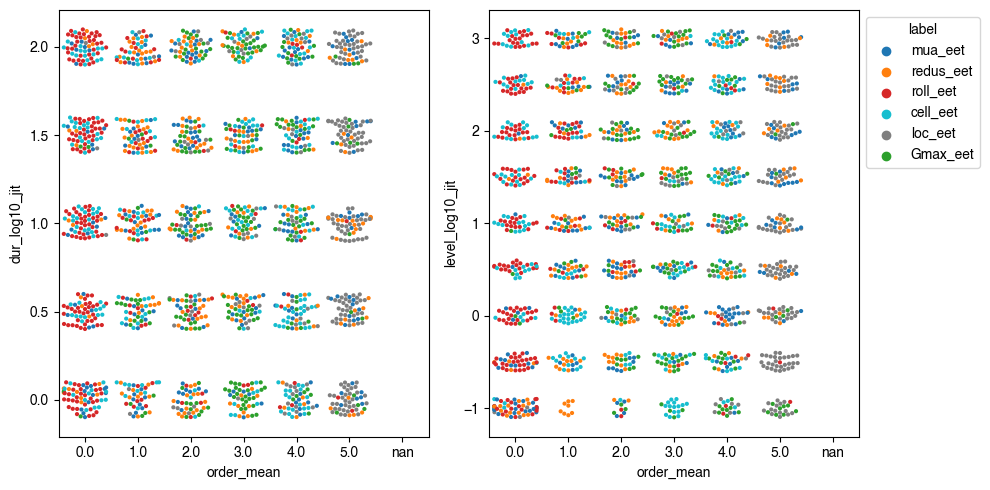

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 5.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 12.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


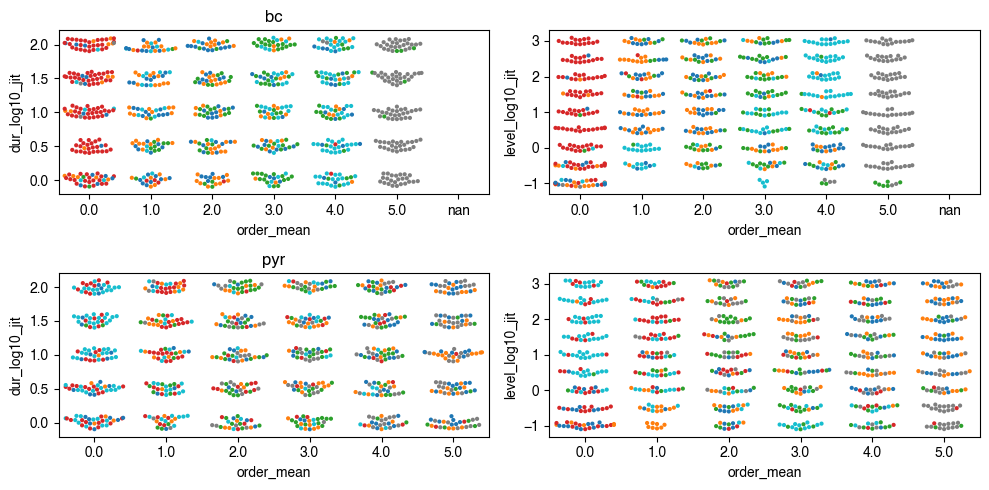

In [34]:
EET_bestposdf['dur_log10'] = np.log10(EET_bestposdf['dur'])
EET_bestposdf['level_log10'] = np.log10(EET_bestposdf['level'])
w = 3
EET_bestposdf['dur_log10_jit'] = EET_bestposdf['dur_log10'] + \
    (np.random.rand(len(EET_bestposdf['dur_log10']))-0.5)*0.2
EET_bestposdf['level_log10_jit'] = EET_bestposdf['level_log10'] + \
    (np.random.rand(len(EET_bestposdf['level_log10']))-0.5)*0.2
fig, axs = plt.subplots(1, 2, tight_layout=True, figsize=(10, 5))
axs = np.array([axs])
for ctth, axrow in zip(np.sort(unique_values_columns_vta['ct_theta']), axs):
    sns.swarmplot(data=EET_bestposdf, x='order_mean', y='dur_log10_jit',
                  hue='label', ax=axrow[0], size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_bestposdf, x='order_mean', y='level_log10_jit',
                  hue='label', ax=axrow[1], size=w, palette=EET_pallete)
try:
    for ax in axs.ravel()[:-1]:
        ax.get_legend().remove()
except:
    pass
lgd = axs[0, -1].get_legend()
lgd.set_bbox_to_anchor([1, 1])

w = 3
fig, axs = plt.subplots(2, 2, tight_layout=True, figsize=(10, 5))
for ctth, axrow in zip(np.sort(unique_values_columns_vta['celltype']), axs):
    idx = EET_bestposdf['celltype'] == ctth
    sns.swarmplot(data=EET_bestposdf[idx], x='order_mean', y='dur_log10_jit',
                  hue='label', ax=axrow[0], size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_bestposdf[idx], x='order_mean', y='level_log10_jit',
                  hue='label', ax=axrow[1], size=w, palette=EET_pallete)
    axrow[0].set_title(ctth)
try:
    for ax in axs.ravel():
        ax.get_legend().remove()
except:
    pass

## extra analysis

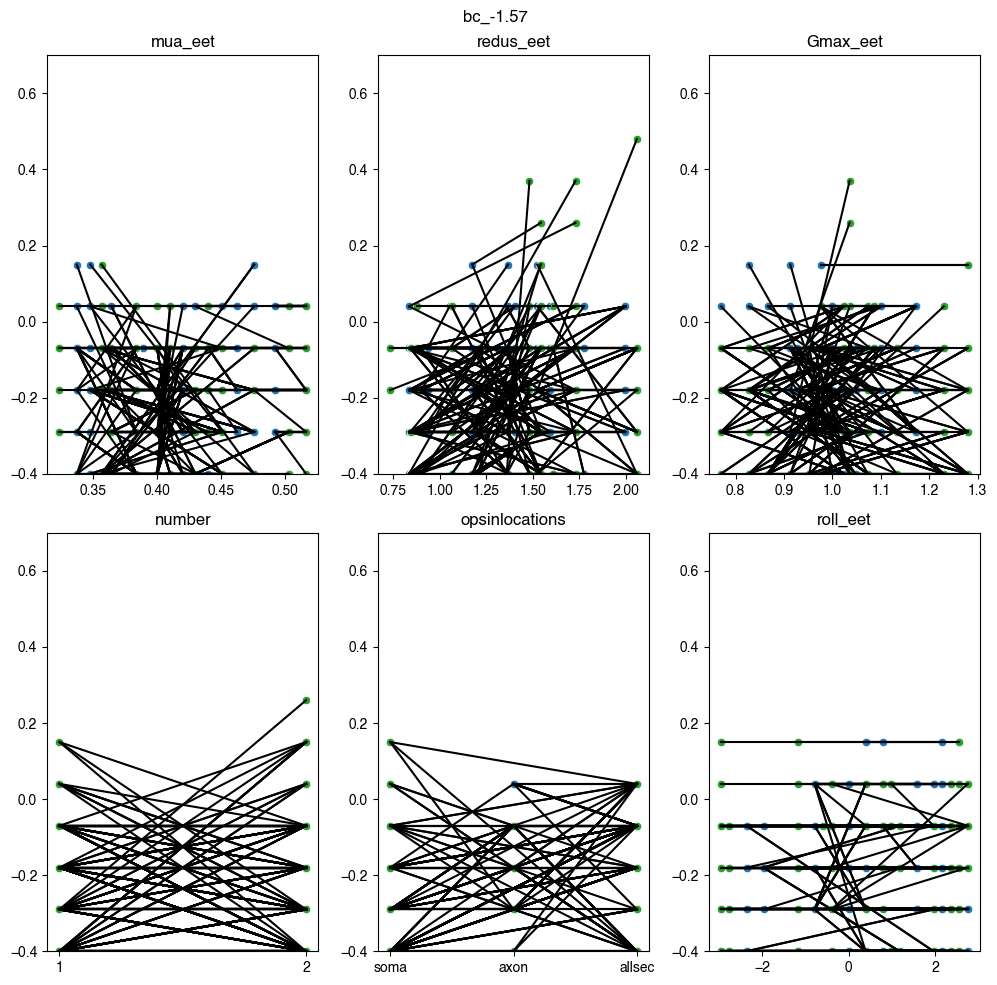

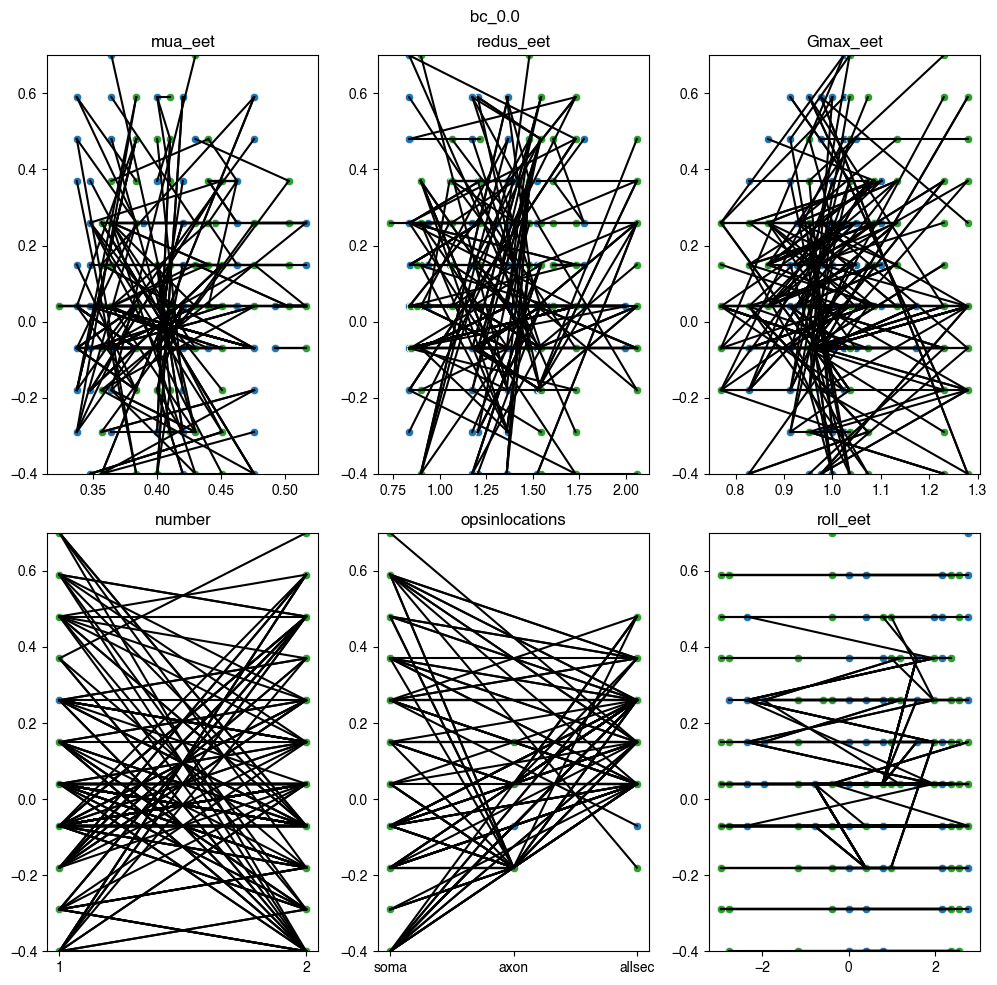

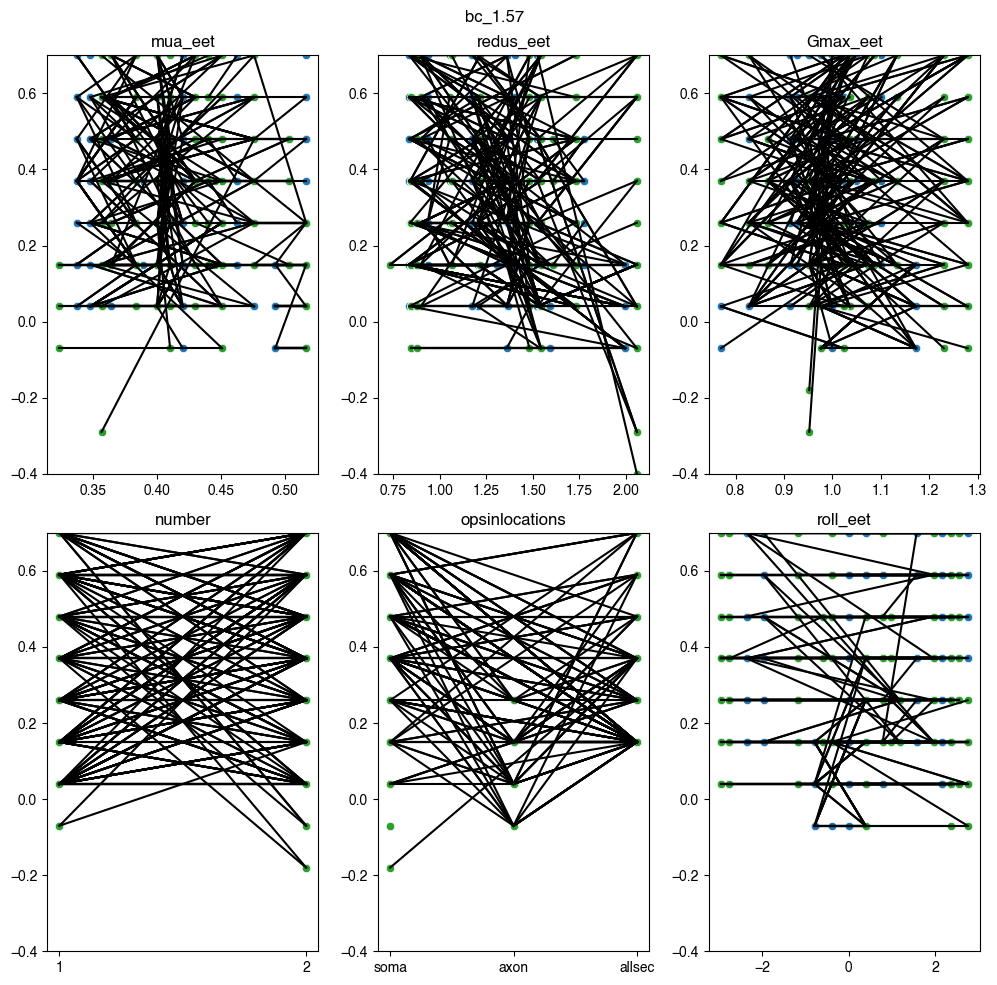

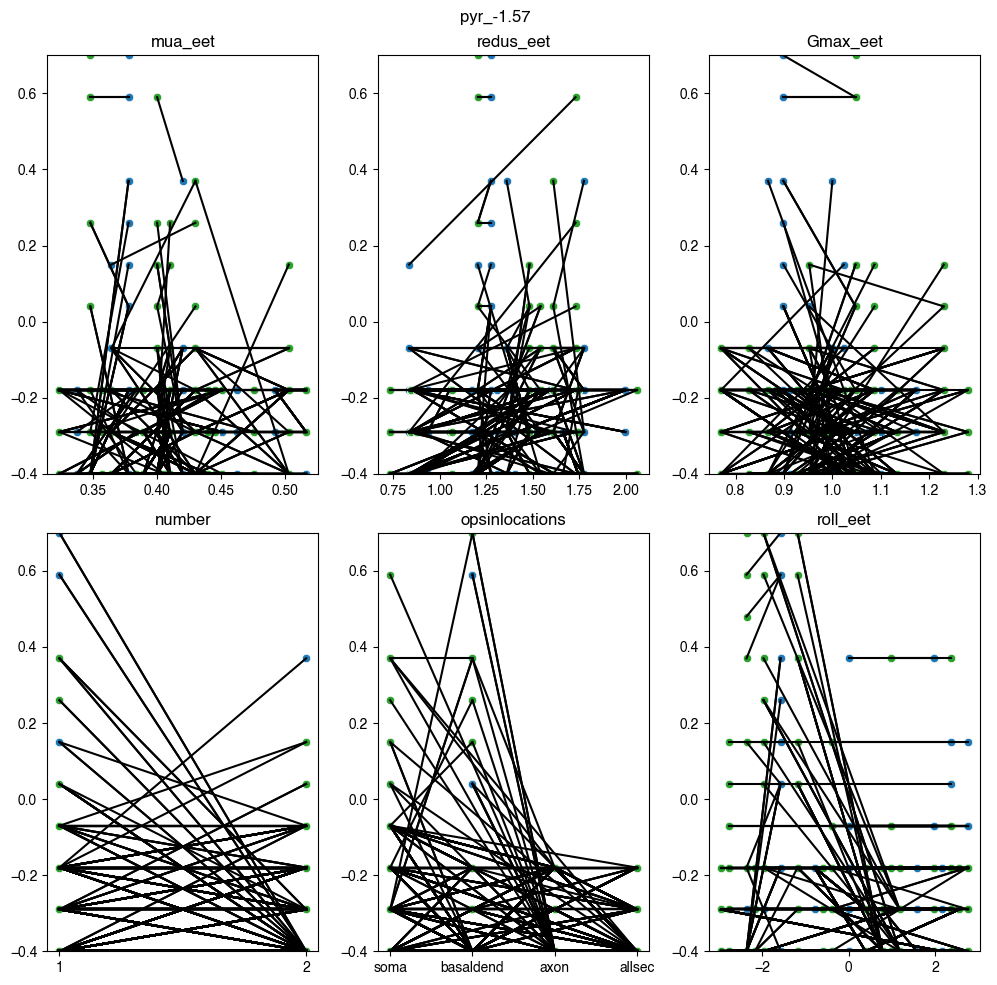

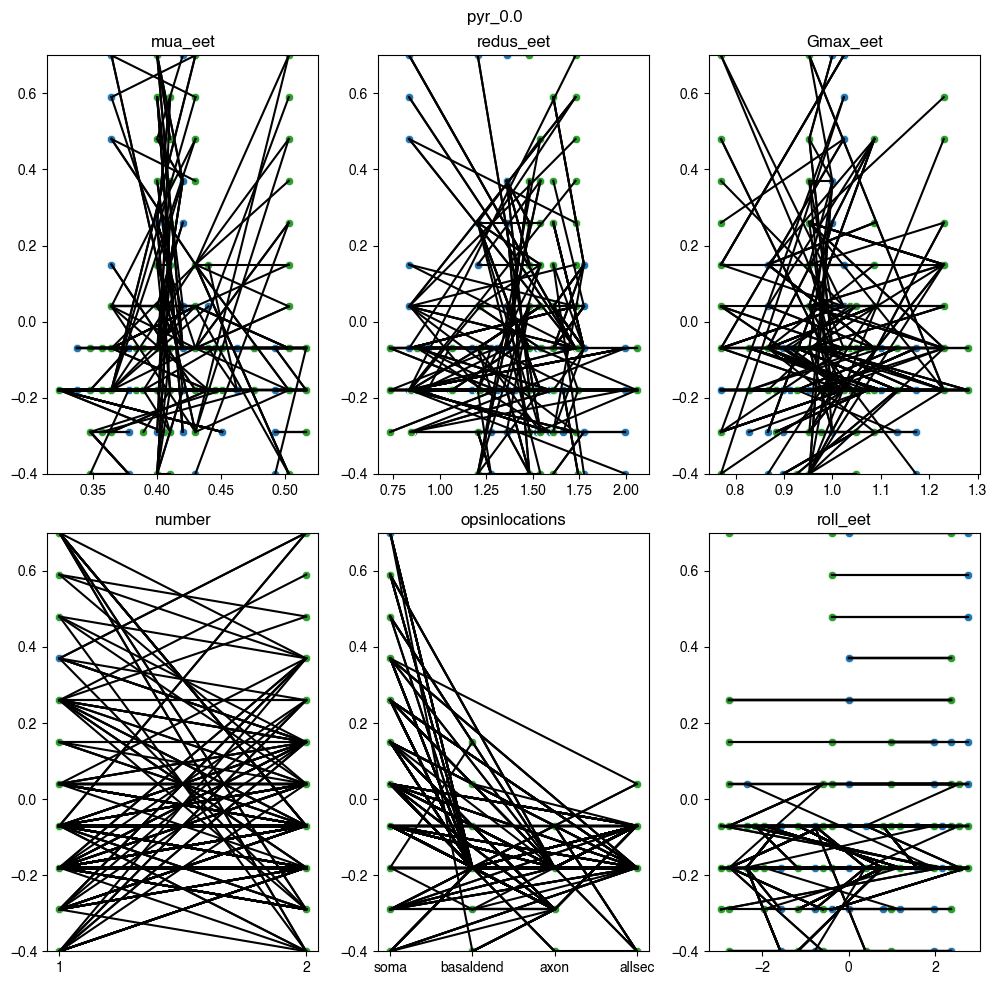

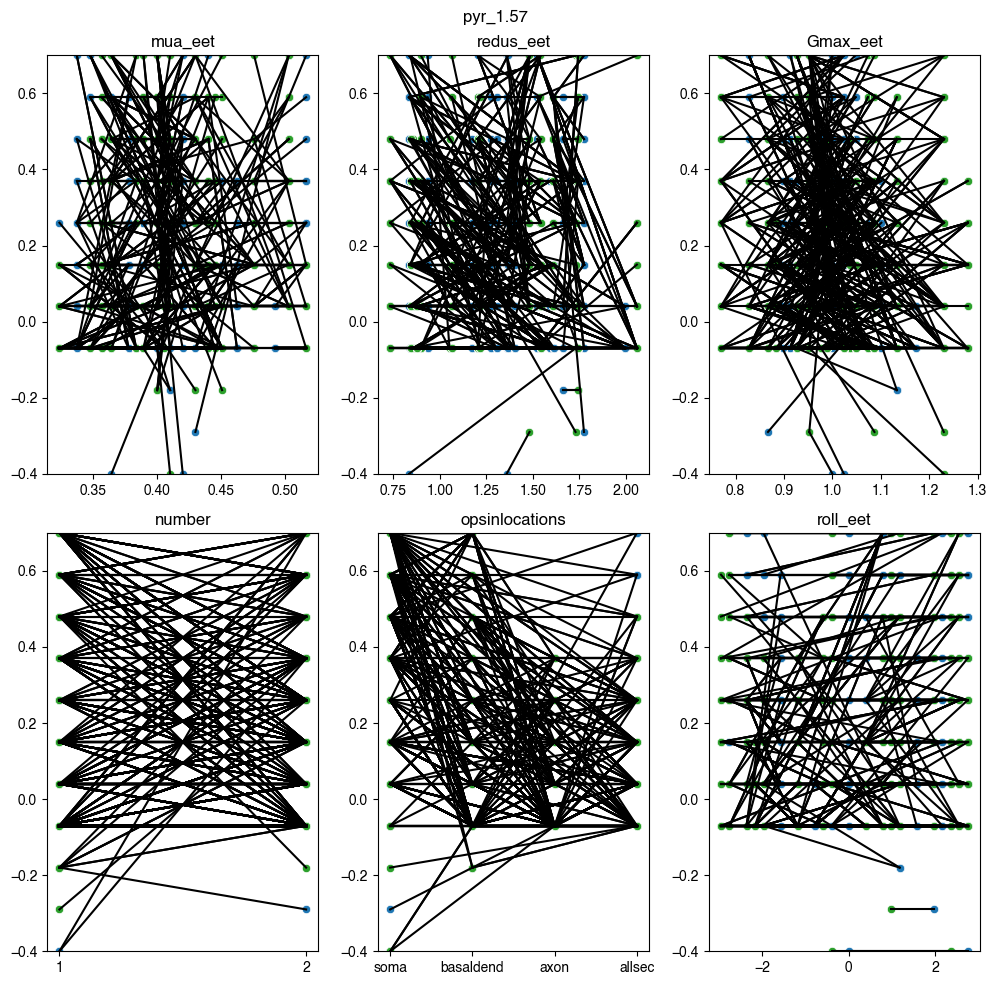

In [35]:

uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['mua_eet', 'redus_eet', 'Gmax_eet',
            'number', 'opsinlocations', 'roll_eet']

for cth in uct_theta:
    idx_m = (vta_df['ct_theta'] == cth)  # & (vta_df['level']==10)
    fig, axs = plt.subplots(
        np.ceil(len(row_strs)/3).astype(int), 3, tight_layout=True, figsize=(10, 10))
    for i, (r, ax) in enumerate(zip(row_strs, axs.ravel())):
        idx = idx_m & ((vta_df['idx_incluster_eet'] == 0))
        intm_df1 = vta_df[idx].set_index(
            ['ct_theta', 'level', 'dur', 'cluster_eet'])
        sns.scatterplot(data=vta_df[idx], x=r,
                        y='b_opt_pos_TAC', color='tab:blue', ax=ax)

        idx_2 = idx_m & (vta_df['idx_incluster_eet'] == i+1)
        intm_df2 = vta_df[idx_2].set_index(
            ['ct_theta', 'level', 'dur', 'cluster_eet'])
        sns.scatterplot(data=vta_df[idx_2], x=r,
                        y='b_opt_pos_TAC', color='tab:green', ax=ax)
        m_df = pd.merge(intm_df1, intm_df2, left_index=True, right_index=True, suffixes=(
            '_0', '_1'), validate='one_to_many').reset_index()
        data = m_df[[r+'_0', r+'_1', 'b_opt_pos_TAC_0',
                     'b_opt_pos_TAC_1']].values
        for d in data:
            ax.plot(d[0:2], d[2:], 'k')

        ax.set_xlabel(None)
        ax.set_ylim([-0.4, 0.7])
        ax.set_ylabel(None)
        ax.set_title(r)
    fig.suptitle(cth)

Text(0.5, 0.98, 'pyr_1.57')

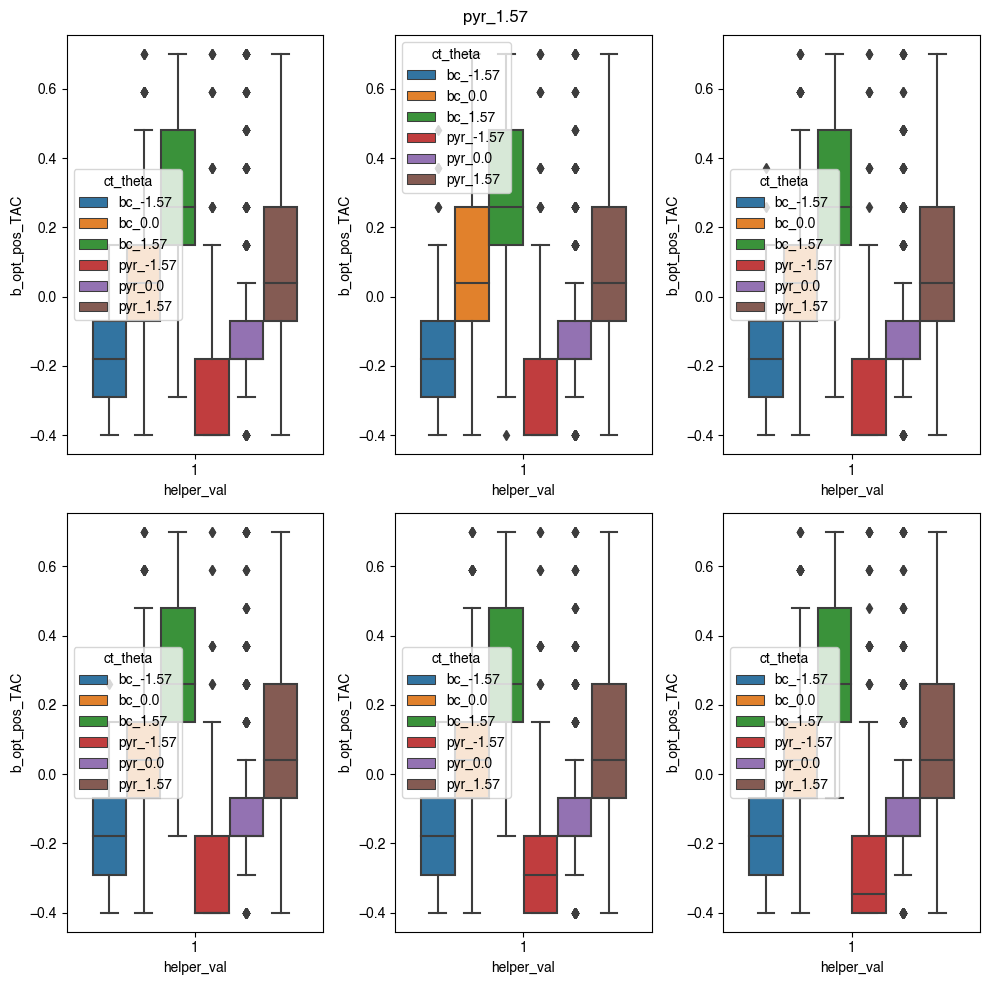

In [36]:
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['mua_eet', 'redus_eet', 'Gmax_eet',
            'number', 'opsinlocations', 'roll_eet']
vta_df['helper_val'] = 1

fig, axs = plt.subplots(np.ceil(len(row_strs)/3).astype(int),
                        3, tight_layout=True, figsize=(10, 10))
for i, (r, ax) in enumerate(zip(row_strs, axs.ravel())):
    idx = (((vta_df['idx_incluster_eet'] == 0)) |
           (vta_df['idx_incluster_eet'] == i+1))
    sns.boxplot(data=vta_df.loc[idx], x='helper_val',
                y='b_opt_pos_TAC', hue='ct_theta', ax=ax)

fig.suptitle(cth)

Text(0.5, 0.98, 'pyr_1.57')

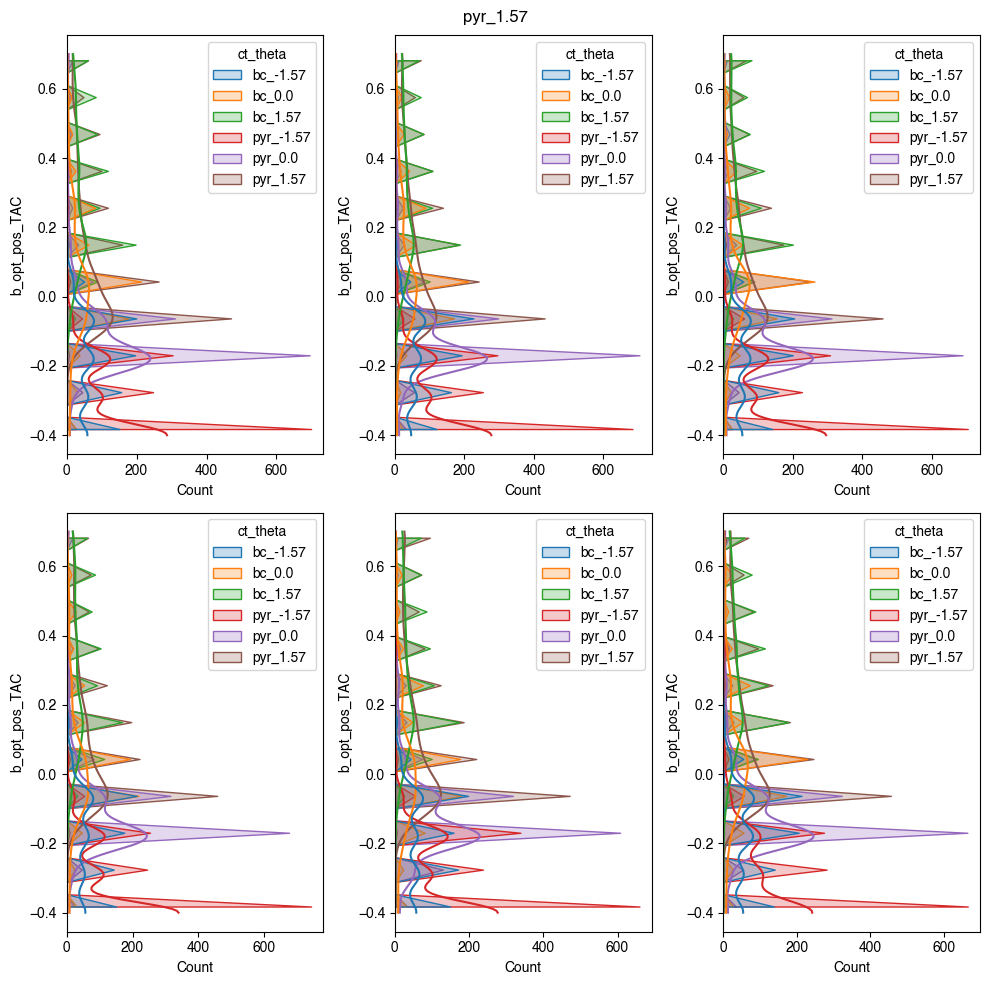

In [37]:
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['mua_eet', 'redus_eet', 'Gmax_eet',
            'number', 'opsinlocations', 'roll_eet']
vta_df['helper_val'] = 1

fig, axs = plt.subplots(np.ceil(len(row_strs)/3).astype(int),
                        3, tight_layout=True, figsize=(10, 10))
for i, (r, ax) in enumerate(zip(row_strs, axs.ravel())):
    idx = (((vta_df['idx_incluster_eet'] == 0)) |
           (vta_df['idx_incluster_eet'] == i+1))
    sns.histplot(data=vta_df.loc[idx], y='b_opt_pos_TAC',
                 hue='ct_theta', ax=ax, element="poly", kde=True)

fig.suptitle(cth)